<p style="font-size:30px">Predicting attitudes towards climate change</p>

### LINKS

XGB ALTERNATIVES
https://medium.com/@pushkarmandot/https-medium-com-pushkarmandot-what-is-lightgbm-how-to-implement-it-how-to-fine-tune-the-parameters-60347819b7fc


NEURAL NETS
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html
https://keras.io/examples/structured_data/structured_data_classification_from_scratch/

tutorial on keras // guessing number in picture
https://www.youtube.com/watch?v=pvVJzHcZNaU 

tutorial on keras 2
https://www.youtube.com/watch?v=oOSXQP7C7ck

tutorial on keras 3, with some nice plots, seeing how accuracy & losses change over time (around 11th minute)
https://www.youtube.com/watch?v=2WdPdE2hq78

feature importance with Keras (doesnt work so far?)
https://stackoverflow.com/questions/45361559/feature-importance-chart-in-neural-network-using-keras-in-python 


evaluation keras
https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/

# Introduction

<b> Context </b>
Rumour has it that in The Netherlands, attitudes on seemingly unrelated topics are grouped. They say - for example - that climate change-sceptiscim seems to cluster together with for example Covid19-denial, and - sometimes even with being less open to immigrants. I'm curious to find out if there is a truth in this rumour. Analyzing the European Social Survey of 2016 might shed some light on this.  

<b> Objective </b>
In this notebook, I will use a deep learning model (keras Sequential) to try to predict to what degree someone thinks climate change is real. In the previoius project (project 5) I already did some cleaning, wrangling and investigation using machine learning models. The tree-based model XGBoost gave the best results. In this project I'll continue and see if I can tune this model. 

<b>The data</b>
The data belongs to the European Social Survey (2016). The European Social Survey is an multi-country survey that aims to unravel public opinions on different topics. All editions have recurring questions concerning public attitudes and values towards eg media, social trust and politics. On top of that, each edition has an extra topic. In 2016 they researched public attitudes to climate change and energy security and energy preferences. See the data folder for more information about the Survey and the data. 


<b> Approach </b>
I will use the csv in which the NaNs are filled and no rows or columns are lost. First I will compile a deep learning model, leaving in climate- and energy- related questions. Next I will see how well the model performs when it does <i>not</i> have these climate and energy- related questions at it's disposal.

I will use the XGBoost model to see if I can improve the predictions by for example limiting the number of features in different ways and tuning hyperparameters.

In [523]:
#load packages

#general
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


#preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.multiclass import type_of_target
from imblearn import under_sampling #import RandomUnderSampler


#tree based model: XGBoost
import xgboost as xgb
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from xgboost import plot_importance

#tree based model: Lightgbm
import lightgbm as lgb

#optimization
import hyperopt
from hyperopt import hp, Trials, fmin, tpe, STATUS_OK



In [347]:
#set Notebook theme/layout
plt.style.use("fast")
sns.set_theme(style="white", context="notebook", palette="husl")
sns.set_context("notebook", rc={"font.size":12,"axes.titlesize":18,"axes.labelsize":12})

In [3]:
#make sure you can read and see the data
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [4]:
#load dataset
data = pd.read_csv('./data/climate_full_fill.csv')
metadata = pd.read_csv('./data/metadata.csv')

# Cleaning

This is a summary of the <b>cleaning that's performed</b> on the dataset (climate_full_fill), details about how and why are in project 5. 

<b>1: String columns </b>
<ul>
    <li> Approach: encoded using [labelencoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html) for as far as they are NOT ordinal (not: bad, oke, perfect). For categorical strings (if any are present), use [OneHotEncoder or OrdinalEncoder](https://stackoverflow.com/questions/61217713/labelencoder-for-categorical-features/61217936#61217936)</li>
    <li>Note: do not apply MinMaxScaler on top of this.</li>
    <li> ALL DATA (test and train) before splitting</li>
</ul>

<b>2: Wide range of values</b><br>
<ul>
    <li> ISCO08 and ISCO08p </li>
    <ul>
        <li>This is in fact a label already, but with the unfortunate range from: 0,10,100,110,200,210,300,310, 1000-9629</li>
        <li>Approach: Label-encoded to tighten the range</li>
        <li>Note: do not apply MinMaxScaler on top of this.</li>
        <li>ALL DATA (test and train) before splitting</li>
    </ul>
    <li> ANCESTRY (anctry1 / 2)</li>
    <ul>
        <li> The ecoding is always 5 digits long, and even 6 when the response is a "no answer"-kind</li>
        <li> Approach: use LabelEncoder to tighten the range</li>
        <li> Note: do not apply MinMaxScaler on top of this</li>
        <li> ALL DATA (test and train).</li>
    </ul>
    <li> EDUCATION and RELIGION</li>
    <ul>
        <li> Each country has their own education and religion columns. On top of that there are "converted" columns, where the education/religion of different countries are encoded in the same manner in one column. </li>
        <li> Approach: use the columns that are already "converted" by the researchers and delete the country-specific ones.</li>
    </ul>
</ul>

<b>3: No answer</b>
<ul>
    <li>Could potentially affect all columns in the dataframe, categorical and continuous alike </li>
    <ul>
        <li>Examples of "No Answer"-like responses:</li>
        <ul>
            <li>55/5555: other</li>
            <li>66/6666: not applicable</li>
            <li>7/77/7777: refusal </li>
            <li>8/88/8888: Don’t know</li>
            <li>9/99/9999: No answer</li>
        </ul>
    </ul>
    <li>Is in fact a category (see encoding below)
    <li>Approach: check for these double (or more) digits and replace them by 0.{specific digit}. Note, do this after the encoding of the ISCO08(b) columns.</li>
    <li>ALL DATA (test and train), before splitting</li>
</ul>

In [5]:
data.head()

,Unnamed: 0,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ips

In [6]:
#cut non-informative columns out of the dataframe
i = [*range(-15, 0), 0]
data = data.drop(data.columns[i], axis=1)
data.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsaf

In [7]:
#DELETE UNWANTED EDUCATION AND RELIGION COLUMNS
#select unwanted columns using the descriptions in de metadata
rows_edu = metadata[(metadata["full_text"].str.contains("education,", regex=False)) & (~metadata["full_text"].str.contains("ES - ISCED", regex=False))]
rows_rel = metadata[(metadata["full_text"].str.contains("belonging to at present,", regex=False)) | (metadata["full_text"].str.contains("belonging to in the past,", regex=False))]

#select the column-names (shorthands)
col_names = list(rows_edu["shorthand"])
col_names.extend(rows_rel["shorthand"].tolist())

#cut the columns out of the dataframe
data = data.drop(col_names, axis=1)

In [8]:
#REPLACE EXTREME VALUES
data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]] = data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]].replace(to_replace = 5555, value = 0.5) 
data[["anctry1", "anctry2"]] = data[["anctry1", "anctry2"]].replace(to_replace = 444444, value = 0.4) 

In [9]:
# DROP YearBorn column
data = data.drop("yrbrn", axis=1)

In [10]:
print(len(data))
data.head()

44387


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
0,AT,120.0,4.0,180.00000,8.0,8.0,3.0,1.0,2.0,2.0,2.0,3.0,6.0,7.0,0.0,2.0,8.0,9.0,10.0,3.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,1.00000,1.00000,1.00000,10.0,10.0,10.0,5.0,6.0,3.0,3.0,2.0,2.0,3.0,3.0,5.0,7.0,2.00000,0.12345,2.00000,0.12345,0.0,7.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,DE,2.0,DE,2010.00000,GER,ZZ,2.0,2.0,DE,2.0,DE,1.0,5.0,1.0,8.0,4.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,2.0,3.0,4.0,4.0,2.0,2.0,2.0,3.0,1.0,0.12345,4.0,4.0,8.0,4.0,10.0,10.0,0.0,0.0,0.0,1.0,1.0,2.0,5.0,1.0,2.0,6.0,3.0,10.0,10.0,10.0,5.0,1.0,1.0,5.0,5.0,5.0,1.0,5.0,3.0,5.0,4.0,0.12345,0.12345,0.12345,0.

In [11]:
# dropping the individual rows where that have no answer to the climate change question (which were filled with 0.12345)
# reset the index
data = data[data.clmchng != 0.12345].reset_index(drop=True) 

In [12]:
# there is one float in the fbrncntb column that gives errors in the LabelEncoding, convert the float to string: "ZZ"
data.loc[10133, "fbrncntb"] = "ZZ"

In [13]:
# check
print(len(data))
data.tail()

43289


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
43284,SI,90.0,2.0,0.12345,1.0,2.0,1.0,2.0,1.0,4.0,1.0,4.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,3.00000,1.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,2.0,5.0,3.0,3.0,4.0,0.0,1.0,0.0,5.0,4.0,6.0,2.0,2.0,2.0,3.0,3.0,1.0,0.0,1.0,1.00000,0.12345,0.12345,1.0,6.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,SLV,ZZ,2.0,1.0,ZZ,1.0,ZZ,5.0,1.0,5.0,10.0,5.0,10.0,5.0,4.0,5.0,4.0,1.0,1.0,2.0,3.0,5.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,0.12345,3.0,3.0,5.0,3.0,5.0,5.0,5.0,3.0,1.0,3.0,1.0,1.0,5.0,2.0,5.0,0.0,3.0,10.0,5.0,10.0,2.0,4.0,4.0,5.0,2.0,2.0,5.0,1.0,2.0,1.0,4.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.

## Less countries
Having all countries in the dataframe does not seem to work. Create dataframe with less countries, to see if this would help the algorithm to find patterns.

### NL and RU

In [14]:
#Netherlands and Russia
data_NL_RU = data.loc[data['cntry'].isin(["NL", "RU"])]
data_NL_RU.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
32080,NL,30.0,5.0,240.0,9.0,8.0,8.0,2.0,3.0,3.0,2.0,3.0,7.0,9.0,8.0,7.0,8.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,3.00000,6.00000,9.0,8.0,6.0,8.0,8.0,7.0,1.0,5.0,1.0,5.0,1.0,6.0,1.0,1.0,2.0,7.0,8.0,8.0,9.0,7.0,5.0,3.0,1.0,2.0,1.0,3.0,9.0,7.0,2.0,0.12345,2.00000,0.12345,3.0,7.0,7.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,DUT,ZZ,2.0,1.0,ZZ,1.0,ZZ,2.0,5.0,2.0,8.0,5.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0,1.0,1.0,1.0,1.0,1.0,0.12345,4.0,4.0,8.0,4.0,1.0,9.00000,3.0,6.0,3.0,1.0,2.0,2.0,3.0,3.0,4.0,8.0,6.0,7.0,8.0,8.0,5.0,1.0,1.0,5.0,4.0,2.0,4.0,4.0,2.00000,3.0,2.0,0.12345,0.12345,0.12345,2.00000,1.00000,3.00000

In [15]:
# check
print(data_NL_RU["cntry"].unique())

['NL' 'RU']


### NL, DE

In [16]:
data_NL_DE = data.loc[data['cntry'].isin(["NL", "DE"])]
data_NL_DE.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
7440,DE,3.0,5.0,1080.00000,8.0,5.0,8.0,3.0,2.0,2.0,2.0,3.0,3.0,4.0,6.0,1.0,1.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,2.0,5.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.00000,2.0,9.0,6.0,3.0,2.0,1.0,6.0,3.0,3.0,2.0,5.0,1.0,7.0,2.0,3.0,3.0,8.0,7.0,10.0,10.0,5.0,5.0,2.0,2.0,2.0,2.0,3.0,10.0,9.0,1.0,2.0,0.12345,0.12345,1.0,6.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,GER,ZZ,2.0,1.0,ZZ,1.0,ZZ,1.0,2.0,2.0,10.0,3.0,8.0,4.0,2.0,4.0,5.0,1.0,1.0,4.0,2.0,2.0,3.0,4.0,3.0,2.0,1.0,5.0,2.0,0.12345,3.0,4.0,7.0,4.0,4.0,4.0,5.0,5.0,5.0,3.0,2.0,3.0,4.0,2.0,11.0,5.0,5.0,6.0,5.0,8.0,5.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,5.0,2.0,3.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,4.00000,3.00000,

In [17]:
# check
print(data_NL_DE["cntry"].unique())

['DE' 'NL']


### Five WE countries

In [18]:
data_5cntry = data.loc[data['cntry'].isin(["NL", "DE", "FR", "GB", "BE"])]
data_5cntry["cntry"].unique()

array(['BE', 'DE', 'FR', 'GB', 'NL'], dtype=object)

# Preprocessing

## LabelEncoder
Some columns need to be encoded - more details about this in project 5

In [19]:
#LABEL ENCODER
obj = data.select_dtypes(include="object")
obj_cols = list(obj.columns)

#add the isco08 columns, they also need to be encoded
obj_cols.append("isco08")
obj_cols.append("isco08p")

data[obj_cols] = data[obj_cols].apply(LabelEncoder().fit_transform) 

print(data[obj_cols].max()) #see how many unique values there are. 

data[obj_cols].head()

cntry        22
ctzshipc    121
cntbrthc    158
lnghom1     121
lnghom2     140
fbrncntb    162
mbrncntb    159
region      274
isco08      589
isco08p     520
dtype: int64


,cntry,ctzshipc,cntbrthc,lnghom1,lnghom2,fbrncntb,mbrncntb,region,isco08,isco08p
0,0,32,40,41,140,40,41,2,102,1
1,0,32,40,41,140,40,41,2,159,104
2,0,121,158,41,140,161,159,5,350,1
3,0,121,158,41,140,161,159,2,589,1
4,0,112,142,108,51,146,144,4,280,1


In [20]:
data_NL_RU[obj_cols] = data_NL_RU[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_RU[obj_cols].max()) #see how many unique values there are. 
print(data_NL_RU[obj_cols].head())

cntry         1
ctzshipc     31
cntbrthc     63
lnghom1      41
lnghom2      41
fbrncntb     66
mbrncntb     66
region       19
isco08      349
isco08p     259
dtype: int64
       cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  \
32080      0        31        63        9       41        66        66   
32081      0        31        63       35       41        58        59   
32082      0         9        20        9       13        16        19   
32083      0        31        63        9       41        66        66   
32084      0        31        63        9       41        66        66   

       region  isco08  isco08p  
32080       7      76       43  
32081       7       1        0  
32082       7     141        0  
32083       7     219        0  
32084       7     210        0  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [21]:
data_NL_RU.tail()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
40444,1,90.0,1.0,0.12345,0.0,4.0,0.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,0.0,0.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,7.0,4.0,6.0,7.0,4.0,0.0,2.0,4.0,4.0,1.0,4.0,0.00000,2.0,2.0,3.0,3.0,3.0,3.0,7.0,4.0,3.0,3.0,1.0,2.0,3.0,3.0,0.0,0.0,2.0,0.12345,2.0,0.12345,0.0,7.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,31,2.0,57,1992.00000,27,41,2.0,2.00000,60,2.0,61,1.0,3.0,1.0,9.0,2.0,0.0,4.0,4.0,2.0,1.0,1.0,1.0,5.0,2.0,5.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,1.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,5.0,3.0,4.0,2.0,2.0,7.0,0.0,5.0,9.0,5.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,1.0,1.0,1.0,4.00000,4.00000,4

In [22]:
data_NL_DE[obj_cols] = data_NL_DE[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_DE[obj_cols].max()) #see how many unique values there are. 
print(data_NL_DE[obj_cols].head())

cntry         1
ctzshipc     59
cntbrthc     89
lnghom1      44
lnghom2      48
fbrncntb     88
mbrncntb     95
region       27
isco08      399
isco08p     332
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
7440      0        59        89       14       48        87        95      14   
7441      0        59        89       14       48        87        95      14   
7442      0        59        89       14       48        87        95      14   
7443      0        59        89       14       48        87        95      14   
7444      0        59        20       14       48        41        95      14   

      isco08  isco08p  
7440     227        0  
7441     197      209  
7442      57      181  
7443     360      302  
7444       8      134  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [23]:
data_5cntry[obj_cols] = data_5cntry[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_5cntry[obj_cols].max()) #see how many unique values there are. 
print(data_5cntry[obj_cols].head())

cntry         4
ctzshipc     86
cntbrthc    125
lnghom1      69
lnghom2      89
fbrncntb    128
mbrncntb    129
region       71
isco08      587
isco08p     409
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
1962      0        86       125       16       73       127       129       5   
1963      0        86       125       16       89       127       129       5   
1964      0        86       125       16       89       127       129       5   
1965      0        86       125       16       89       127       129       5   
1966      0        86       125       16       89       127       129       5   

      isco08  isco08p  
1962     280      331  
1963     542        0  
1964     501        0  
1965     542      300  
1966     276      386  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


## Isolate target (y) from predictors (X)
The column I want to predict should not be scaled. This is the columns: <br>
<b>"Do you think world's climate is changing"</b><br>
Variable name: clmchng<br>

Meaning of the outcomes:<br>
1 = Definitely changing	<br>
2 = Probably changing<br>
3 = Probably not changing<br>
4 =	Definitely not changing	<br><br>
7 =	Refusal<br>
8 =	Don't know<br>
9 =	No answer<br>

Isolate this column from the rest of the dataset, and see whether the data is unbalanced and undersampling of certain categories is needed.

In [24]:
#set X (predictors) and y (target)
X = data.drop("clmchng", axis=1)
y = data["clmchng"]

X_NL_RU = data_NL_RU.drop("clmchng", axis=1)
y_NL_RU = data_NL_RU["clmchng"]

X_NL_DE = data_NL_DE.drop("clmchng", axis=1)
y_NL_DE = data_NL_DE["clmchng"]

X_5cntry = data_5cntry.drop("clmchng", axis=1)
y_5cntry =data_5cntry["clmchng"]

In [25]:
#check
print(len(X.columns), len(X), len(y))
print(len(X_NL_RU.columns), len(X_NL_RU), len(y_NL_RU))
print(len(X_NL_DE.columns), len(X_NL_DE), len(y_NL_DE))
print(len(X_5cntry.columns), len(X_5cntry), len(y_5cntry))

373 43289 43289
373 3933 3933
373 4508 4508
373 10269 10269


## Create different versions of X

### X_scaled
Some of the features (columns) are already processed using the LabelEncoder, these should not also be subject to the MinMaxScaler. Therefore first 'deselect' those columns from X and then re-joining them.

In [26]:
encoded_cols = ['cntry', 'ctzshipc', 'cntbrthc', 'lnghom1', 'lnghom2', 'fbrncntb', 'mbrncntb', 'region', "isco08","isco08p", "anctry1","anctry2"]
X_to_scale = X.drop(encoded_cols, axis=1)
X_dont_scale = X[encoded_cols]

In [27]:
cols_scale = list(X_to_scale.columns)
print(cols_scale)

['nwspol', 'netusoft', 'netustm', 'ppltrst', 'pplfair', 'pplhlp', 'polintr', 'psppsgva', 'actrolga', 'psppipla', 'cptppola', 'trstprl', 'trstlgl', 'trstplc', 'trstplt', 'trstprt', 'trstep', 'trstun', 'vote', 'prtvtbat', 'prtvtcbe', 'prtvtfch', 'prtvtdcz', 'prtvede1', 'prtvede2', 'prtvtfee', 'prtvtdes', 'prtvtdfi', 'prtvtcfr', 'prtvtbgb', 'prtvtehu', 'prtvtbie', 'prtvtcil', 'prtvtbis', 'prtvtbit', 'prtvblt1', 'prtvblt2', 'prtvblt3', 'prtvtfnl', 'prtvtbno', 'prtvtdpl', 'prtvtcpt', 'prtvtdru', 'prtvtbse', 'prtvtesi', 'contplt', 'wrkprty', 'wrkorg', 'badge', 'sgnptit', 'pbldmn', 'bctprd', 'pstplonl', 'clsprty', 'prtclcat', 'prtclcbe', 'prtclfch', 'prtcldcz', 'prtclede', 'prtclfee', 'prtclees', 'prtcldfi', 'prtclefr', 'prtclbgb', 'prtclfhu', 'prtcldie', 'prtcldil', 'prtclbis', 'prtclcit', 'prtclblt', 'prtclenl', 'prtclbno', 'prtclgpl', 'prtclept', 'prtcldru', 'prtclbse', 'prtclesi', 'prtdgcl', 'lrscale', 'stflife', 'stfeco', 'stfgov', 'stfdem', 'stfedu', 'stfhlth', 'gincdif', 'mnrgtjb', 'fr

In [28]:
#create array to feed to MinMaxScaler (normalization)
X_to_scale = X_to_scale.to_numpy()

In [29]:
scaler = MinMaxScaler(feature_range=(0,10))
scaled_array = scaler.fit(X_to_scale)
scaled_array2 = scaler.transform(X_to_scale)
scaled_df = pd.DataFrame(scaled_array2, columns=cols_scale)

In [30]:
scaled_df.head() #check

,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,brncntr,livecnta,blgetmg,facntr,mocntr,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,regunit,intewde
0,0.840336,7.94937,1.250000,8.0,8.0,3.0,2.261160,3.84811,3.84811,3.84811,5.89874,6.0,7.0,0.0,2.0,8.0,9.0,10.0,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.000000,10.000000,10.000000,4.671072,4.671072,10.0,4.671072,4.671072,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.79748,10.00000,1.79748,10.00000,1.79748,5.0,2.261160,2.261160,2.261160,10.0,10.0,10.0,5.0,8.545782,5.000000,5.89874,10.0,4.840773,5.89874,10.0,5.0,7.0,10.000000,0.000000,10.000000,0.00000,0.0,10.000000,10.000000,4.671072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,10.000000,10.000000,9.965293,10.000000,10.000000,10.000000,1.79748,10.00000,1.79748,8.0,0.706413,10.0,0.888640,0.888640,0.159731,0.888640,0.159731,0.159731,0.159731,3.84811,5.89874,7.94937,7.94937,3.84811,3.84811,3.84811,5.89874,0.0,7.94937,0.706413,8.0,7.94937,10.0,10.0,0.0,0.0,0.0,1.79748,1.79748,3.84811,10.00000,1.79748,1.725317,6.0,3.0,10.0,10.0,10.0,10.00000,1.79748,1.79748,10.00000,10.00000,10.00000,1.79748,10.00000,5.89874,10.00000,10.00000

In [31]:
scaled_df.min().sort_values(ascending=True) #double check

nwspol      0.0
rshipa10    0.0
rshipa9     0.0
rshipa8     0.0
rshipa7     0.0
rshipa6     0.0
rshipa5     0.0
rshipa4     0.0
rshipa3     0.0
rshipa11    0.0
rshipa2     0.0
yrbrn11     0.0
yrbrn10     0.0
yrbrn9      0.0
yrbrn8      0.0
yrbrn7      0.0
yrbrn6      0.0
yrbrn5      0.0
yrbrn4      0.0
yrbrn12     0.0
rshipa12    0.0
icpart1     0.0
rshpsts     0.0
edctn       0.0
pdwrk       0.0
eduyrs      0.0
edupl2      0.0
eisced      0.0
edulvlb     0.0
domicil     0.0
chldhhe     0.0
chldhm      0.0
maritalb    0.0
marstgb     0.0
marstfi     0.0
marsts      0.0
iccohbt     0.0
icpart2     0.0
dvrcdeva    0.0
lvgptnea    0.0
rshpsgb     0.0
rshpsfi     0.0
yrbrn3      0.0
uempla      0.0
yrbrn2      0.0
gndr12      0.0
ubspunp     0.0
ubspedu     0.0
ubsppay     0.0
ub20unp     0.0
ub20edu     0.0
ub20pay     0.0
ub50unp     0.0
ub50edu     0.0
bnlwinc     0.0
ub50pay     0.0
ubedu       0.0
ubpay       0.0
admub       0.0
bennent     0.0
lbenent     0.0
uentrjb     0.0
imsclbn 

In [32]:
scaled_df.max().sort_values(ascending=False) #triple check

yrbrn10     10.0
eiscedm     10.0
eiscedf     10.0
elgwind     10.0
elgsun      10.0
elgnuc      10.0
prtvtdru    10.0
yrbrn2      10.0
yrbrn3      10.0
yrbrn4      10.0
yrbrn5      10.0
yrbrn6      10.0
yrbrn7      10.0
elghydr     10.0
elgngas     10.0
yrbrn11     10.0
yrbrn12     10.0
elgcoal     10.0
rdcenr      10.0
nacer2      10.0
eiscedp     10.0
livecnta    10.0
prtclfhu    10.0
ccnthum     10.0
elgbio      10.0
lkuemp      10.0
pray        10.0
eisced      10.0
prtvtehu    10.0
pdjobyr     10.0
vteurmmb    10.0
vteumbgb    10.0
vteubcmb    10.0
prtvtfch    10.0
rlgatnd     10.0
sclmeet     10.0
rlgblge     10.0
dscrdsb     10.0
dscroth     10.0
atcherp     10.0
dscrdk      10.0
atchctr     10.0
dscrref     10.0
rlgblg      10.0
rlgdnm      10.0
dscrsex     10.0
dscretn     10.0
rlgdnme     10.0
rlgdgr      10.0
dscrgnd     10.0
dscrgrp     10.0
dscrrce     10.0
dscrntn     10.0
dscrrlg     10.0
dscrna      10.0
dscrlng     10.0
dscrage     10.0
dscrnap     10.0
intewde     10

In [33]:
# join the two back together
scaled_df = pd.concat([scaled_df, X_dont_scale], axis=1, join="inner")

In [34]:
#check if it went right
print(X.shape)
print(scaled_df.shape)

(43289, 373)
(43289, 373)


In [35]:
scaled_df.dtypes #check

nwspol      float64
netusoft    float64
netustm     float64
ppltrst     float64
pplfair     float64
pplhlp      float64
polintr     float64
psppsgva    float64
actrolga    float64
psppipla    float64
cptppola    float64
trstprl     float64
trstlgl     float64
trstplc     float64
trstplt     float64
trstprt     float64
trstep      float64
trstun      float64
vote        float64
prtvtbat    float64
prtvtcbe    float64
prtvtfch    float64
prtvtdcz    float64
prtvede1    float64
prtvede2    float64
prtvtfee    float64
prtvtdes    float64
prtvtdfi    float64
prtvtcfr    float64
prtvtbgb    float64
prtvtehu    float64
prtvtbie    float64
prtvtcil    float64
prtvtbis    float64
prtvtbit    float64
prtvblt1    float64
prtvblt2    float64
prtvblt3    float64
prtvtfnl    float64
prtvtbno    float64
prtvtdpl    float64
prtvtcpt    float64
prtvtdru    float64
prtvtbse    float64
prtvtesi    float64
contplt     float64
wrkprty     float64
wrkorg      float64
badge       float64
sgnptit     float64


In [36]:
#STORE THE SCALED X VALUES IN VARIABLE X_SCALED
X_scaled = scaled_df

### X_noclimate
Predicting if people believe in climate change using questions about climate change is not that interesting. More interesting to see if you can predict someones attitude towards climate change based on <i>other</i> features. I therefore create a X_noclimate variable.

In [37]:
#isolate climate questions. 
metadata[["shorthand", "full_text"]] #Are located in row 178 till 209

,shorthand,full_text
0,name,Title of dataset
1,essround,ESS round
2,edition,Edition
3,proddate,Production date
4,idno,Respondent's identification number
5,cntry,Country
6,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"
7,netusoft,"Internet use, how often"
8,netustm,"Internet use, how much time on typical day, in minutes"
9,ppltrst,Most people can be trusted or you can't be too careful


In [38]:
#get the column names
climate_cols = list(metadata.iloc[178:210, 0]) #rows, columns
print(climate_cols)

['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmchng', 'clmthgt1', 'clmthgt2', 'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']


In [39]:
X_noclimate = data.drop(climate_cols, axis=1) #note, this X is not scaled!

X_NL_RU_noclimate = data_NL_RU.drop(climate_cols, axis=1) #note, this X is not scaled!
X_NL_DE_noclimate = data_NL_DE.drop(climate_cols, axis=1) #note, this X is not scaled!
X_5cntry_noclimate = data_5cntry.drop(climate_cols, axis=1) #note, this X is not scaled!5cntry

### X_scaled_noclimate
Another option is to use X_scaled without climate.

In [40]:
#will remove the climate columns from X_scaled, target column 'clmchng' is no longer in there. So remove it from the column-list
climate_cols_X = ['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 
                       'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 
                       'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmthgt1', 'clmthgt2', 
                       'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 
                       'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']

X_scaled_noclimate = X_scaled.drop(climate_cols_X, axis=1) #note, this X is scaled!

### X_"countries"
Another approach to simplify things is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.

As rows need to be deleted (not columns) these X's are created befores splitting X from y. You'll find them in the paragraph: "isolate target(y) from predictors (X). <br>

Names:

X_NL_RU<br>
X_NL_DE<br>
X_5cntry<br>

### X_some
Yet another option: use features that have higher correlations to the target-column to begin with.

In [41]:
corr_all = data.corr()
corr_all = corr_all["clmchng"]

In [42]:
corr_some = corr_all[corr_all > 0.05]
print(list(corr_some.index))
print(len(list(corr_some)))

['polintr', 'wrkorg', 'sgnptit', 'bctprd', 'pstplonl', 'clsprty', 'gincdif', 'freehms', 'hmsacld', 'imsmetn', 'imdfetn', 'impcntr', 'lnghom2', 'gvrfgap', 'rfgbfml', 'elgsun', 'elgwind', 'clmchng', 'clmthgt1', 'ccgdbd', 'inctxff', 'sbsrnen', 'banhhap', 'imsclbn', 'vteubcmb', 'hincfel', 'atncrse', 'ipcrtiv', 'ipeqopt', 'impdiff', 'ipudrst', 'impfree', 'iphlppl', 'iplylfr', 'impenv', 'regunit']
36


In [43]:
corr_some = corr_some.to_frame().reset_index()
corr_some.head()

,index,clmchng
0,polintr,0.074652
1,wrkorg,0.053864
2,sgnptit,0.098913
3,bctprd,0.099373
4,pstplonl,0.077107


In [44]:
corr_some = pd.merge(corr_some, metadata[["shorthand", "full_text"]], left_on= "index", right_on="shorthand", how="left")

In [45]:
corr_some.sort_values(by="clmchng", ascending=False)

,index,clmchng,shorthand,full_text
17,clmchng,1.000000,clmchng,Do you think world's climate is changing
18,clmthgt1,0.457112,clmthgt1,How much thought about climate change before today
7,freehms,0.162198,freehms,Gays and lesbians free to live life as they wish
21,sbsrnen,0.150990,sbsrnen,Favour subsidise renewable energy to reduce climate change
34,impenv,0.141534,impenv,Important to care for nature and environment
28,ipeqopt,0.134198,ipeqopt,Important that people are treated equally and have equal opportunities
35,regunit,0.124861,regunit,Regional unit
8,hmsacld,0.122876,hmsacld,Gay and lesbian couples right to adopt children
22,banhhap,0.122820,banhhap,Favour ban sale of least energy efficient household appliances to reduce climate change
32,iphlppl,0.121566,iphlppl,Important to help people and care for others well-being


In [46]:
#exclude climate questions

for i in range(len(corr_some)):
    if corr_some.loc[i, "shorthand"] in climate_cols:
        corr_some.drop(i, axis=0, inplace=True)

In [47]:
X_some = data[corr_some["shorthand"]]
print(len(X_some.columns))
X_some.head()

28


,polintr,wrkorg,sgnptit,bctprd,pstplonl,clsprty,gincdif,freehms,hmsacld,imsmetn,imdfetn,impcntr,lnghom2,gvrfgap,rfgbfml,imsclbn,vteubcmb,hincfel,atncrse,ipcrtiv,ipeqopt,impdiff,ipudrst,impfree,iphlppl,iplylfr,impenv,regunit
0,1.0,2.0,1.0,1.0,1.0,2.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,1.0,1.0,1.0,0.12345,2.0,1.0,2.0,1.0,3.0,1.0,3.0,1.0,1.0,1.0,2.0
1,1.0,2.0,2.0,1.0,1.0,1.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,3.0,2.0,2.0,0.12345,2.0,2.0,3.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0
2,3.0,1.0,2.0,1.0,2.0,2.00000,4.0,1.0,3.0,2.00000,3.00000,3.00000,140,3.0,3.0,3.0,0.12345,2.0,2.0,3.0,2.0,6.0,2.0,2.0,3.0,1.0,2.0,2.0
3,2.0,2.0,2.0,2.0,2.0,0.12345,3.0,3.0,2.0,0.12345,0.12345,0.12345,140,3.0,3.0,4.0,0.12345,2.0,2.0,2.0,2.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0
4,3.0,2.0,2.0,2.0,2.0,1.00000,1.0,1.0,1.0,2.00000,2.00000,1.00000,51,2.0,2.0,2.0,0.12345,2.0,1.0,3.0,1.0,3.0,3.0,1.0,1.0,1.0,1.0,2.0


## Create different versions of y

In [48]:
#y is interpreted as continuous because NaNs are filled with 0.12345. Turning i into integers solves this issue:
y=y.astype('int64')
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

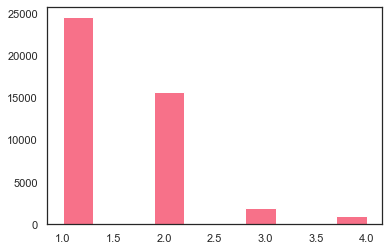

In [49]:
# y is unbalanced. There are relatively little people who say the climate is definitely not changing. This should be adressed in XGBoost and possibly in the neural net aswell.
plt.hist(y)
plt.show();

In [50]:
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

### y_zero and y_"countries"
XGBoost needs y to start at zero. Change the range, the values in y_zero will mean:

0 = Definitely changing	<br>
1 = Probably changing<br>
2 = Probably not changing<br>
3 =	Definitely not changing	<br>

In [51]:
y_zero = y-1

y_NL_RU = y_NL_RU-1
y_NL_DE = y_NL_DE-1
y_5cntry = y_5cntry -1

In [52]:
print(y_zero.value_counts(),"\n") #check
print(y_NL_RU.value_counts(),"\n")
print(y_NL_DE.value_counts(),"\n")
print(y_5cntry.value_counts())

0    24585
1    15764
2     1962
3      978
Name: clmchng, dtype: int64 

0.0    2035
1.0    1463
3.0     235
2.0     200
Name: clmchng, dtype: int64 

0.0    2878
1.0    1426
2.0     153
3.0      51
Name: clmchng, dtype: int64 

0.0    6494
1.0    3305
2.0     363
3.0     107
Name: clmchng, dtype: int64


### y_trio
The bins are very unbalanced. The non-believers making up only a small part of the observations. I will therefore also try to group the two non-believers together to form three bins (starting at zero):

0 = Definitely changing <br>
1 = Probably changing <br>
2 = Probably + Definitely not changing <br>


In [53]:
y_trio = y_zero.replace(3,2)
y_trio.value_counts()

0    24585
1    15764
2     2940
Name: clmchng, dtype: int64

### y_duo
To be fair, lets also bin the first two together and make a binary prediction. This will be the bins:

0 = Probably+ Definitely changing <br>
1 = Probably + Definitely not changing <br>

In [54]:
y_duo_intermediate=y_trio.replace(1,0) #replace 1 by 0
y_duo=y_duo_intermediate.replace(2,1) #replace 2 by 1

In [55]:
y_duo.value_counts()

0    40349
1     2940
Name: clmchng, dtype: int64

###  y_worried

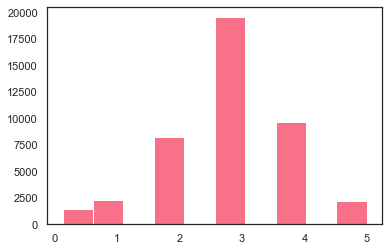

In [56]:
#Check out a different y
plt.hist(data["wrclmch"]);

In [57]:
#check another y: are you worried about climate change?
y_worried = data["wrclmch"]
print(y_worried.unique())
y_worried = y_worried.astype(int)
y_worried.unique()

[4.      3.      2.      1.      5.      0.12345]


array([4, 3, 2, 1, 5, 0])

# Functions
All functions are in this Chapter. For convenience each function has it's own paragraph.

## get_fullname()

In [58]:
def get_fullname(dataframe, metadata):
    """
    IN:
    The dataframe with the shorthands you want to decipher (in rows).
    The metadata-dataframe
    
    
    OUT:
    The input dataframe with fullnames attached
    """
    df = dataframe.groupby("feature").mean()
    fullname = pd.merge(df, metadata[["shorthand", "full_text"]], left_on= "feature", right_on="shorthand", how="left")
        
    return fullname

## XG_Boost()

In [59]:
def XG_Boost(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters (can be empty aswell).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

    random_states = random_states
    my_learning_rate = learning_rate
    
    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
#             print("percentage def:", len(y_train[y_train==0])/len(y_train)*100,
#                   "\npercentage prob:", len(y_train[y_train==1])/len(y_train)*100,
#                   "\npercentage prob not:", len(y_train[y_train==2])/len(y_train)*100,
#                   "\npercentage def not:", len(y_train[y_train==3])/len(y_train)*100)
        else:
            X_train = X_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
                                  learning_rate = my_learning_rate, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## tune_learning()

Use this function to tune the learning rate of the multiclass XG_Boost model.

In [60]:
def tune_learning(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    one_random_state: one value! 
    Whether or not you want to undersample (True) or not (False)
    
    learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
    hyperparameters: a dict with hyperparameters or an empty dict.

    
    OUT: 
    Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a barplot with the most frequently in the top 10 occuring features.
    It will print a scatterplot with the accuracy test&train scores at different learning rates

    
   """
    my_random_state = one_random_state

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    #list to keep track of learning rate
    used_learning_rate = []
    
    top_importances = []
    top_indices = []

    
    for i in learning_rate:
        used_learning_rate.append(i)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
        else:
            x_train = x_train
            y_train = y_train
        
        model = xgb.XGBClassifier(objective='multiclass:softmax', eval_metric='logloss', **hyperparams,
        learning_rate = i, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Learning rate:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', 'Def not']), 
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
                                      "Recall_test":recall_XGBoost, 
                                      "Precision_test":precision_XGBoost,
                                       "Accuracy_train":accuracy_XGBoost_train,
                                      "Recall_train":recall_XGBoost_train, 
                                      "Precision_train":precision_XGBoost_train,  
                                     "Learning_rate":used_learning_rate
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
    plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## objective()  - LR = 0.0367 for hyperparam optimization

In [61]:
def objective(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """
    #NOTE: INSERT top learning rate! 0.0367
    
    clf=xgb.XGBClassifier(learning_rate = 0.0367, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    clf.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

## Light_GBM()

In [62]:
def Light_GBM(X, y, random_states, undersample_True, learning_rate, hyperparams):
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters (can be empty aswell).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

    #lists for performances on test set
    recall = []
    accuracy = []
    precision = [] 
    
    #lists for performances on test set
    recall_train = []
    accuracy_train = []
    precision_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = lgb.LGBMClassifier(objective='multi:softmax', **hyperparams,
        learning_rate = learning_rate)
        
        result = model.fit(X_train, y_train, eval_metric='logloss')
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy.append(accuracy_score(y_test, y_pred))
        recall.append(recall_score(y_test, y_pred, average='macro'))
        precision.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_train.append(accuracy_score(y_train, y_pred_train))
        recall_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df = pd.DataFrame({"Model":["Light_GBM","Licht_GBM_train"],
                                      "Accuracy":[np.average(accuracy), np.average(accuracy_train)],
                                      "Recall":[np.average(recall), np.average(recall_train)], 
                                      "Precision":[np.average(precision), np.average(precision_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features["model"] = "Light_GBM"
    top_features["feature"] = "abc"
    
    for i in range(len(top_features)):
        index_nr = top_features["indices"][i]
        top_features.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df, top_features

## XG_Boost_trio()

In [142]:
def XG_Boost_trio(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters (can be empty aswell).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
         learning_rate = learning_rate, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob/Def not']), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## tune_learning_trio()

In [64]:
def tune_learning_trio(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    one_random_state: one value! 
    Whether or not you want to undersample (True) or not (False)
    
    learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
    hyperparameters: a dict with hyperparameters or an empty dict.

    
    OUT: 
    Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a barplot with the most frequently in the top 10 occuring features.
    It will print a scatterplot with the accuracy test&train scores at different learning rates

    
   """
    my_random_state = one_random_state

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    #list to keep track of learning rate
    used_learning_rate = []
    
    top_importances = []
    top_indices = []

    
    for i in learning_rate:
        used_learning_rate.append(i)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
        else:
            x_train = x_train
            y_train = y_train
        
        model = xgb.XGBClassifier(objective='multiclass:softmax', eval_metric='mlogloss', **hyperparams,
        learning_rate = i, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Learning rate:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Def + Prob not']), 
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
                                      "Recall_test":recall_XGBoost, 
                                      "Precision_test":precision_XGBoost,
                                       "Accuracy_train":accuracy_XGBoost_train,
                                      "Recall_train":recall_XGBoost_train, 
                                      "Precision_train":precision_XGBoost_train,  
                                     "Learning_rate":used_learning_rate
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
    plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## XG_Boost_duo()
Yes, that would indeed be a binary classification

This function is made to run the model several times with fixed learning rates and hyperparams. <br>
To tune the learning rate, see tune_learning_duo() <br>
To tune the hyperparams, see objective_duo <br>

In [65]:
def XG_Boost_duo(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters. 
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    
   """
    

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            print("percentage def/prob:", len(y_train[y_train==0])/len(y_train)*100,
                  "\npercentage prob/def not:", len(y_train[y_train==1])/len(y_train)*100)
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
         learning_rate = learning_rate, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def + Prob', 'Def + Prob not']), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train)) 
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## tune_learning_duo()

In [66]:
def tune_learning_duo(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    one_random_state: one value! 
    Whether or not you want to undersample (True) or not (False)
        learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
    hyperparameters: a dict with hyperparameters or an empty dict.

    
    OUT: 
    Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a barplot with the most frequently in the top 10 occuring features.
    It will print a scatterplot with the accuracy test&train scores at different learning rates

    
   """
    my_random_state = one_random_state

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    #list to keep track of learning rate
    used_learning_rate = []
    
    top_importances = []
    top_indices = []

    
    for i in learning_rate:
        used_learning_rate.append(i)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
        else:
            x_train = x_train
            y_train = y_train
        
        model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
        learning_rate = i, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Learning rate:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def + Prob', 'Def + Prob not']), 
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
                                      "Recall_test":recall_XGBoost, 
                                      "Precision_test":precision_XGBoost,
                                       "Accuracy_train":accuracy_XGBoost_train,
                                      "Recall_train":recall_XGBoost_train, 
                                      "Precision_train":precision_XGBoost_train,  
                                     "Learning_rate":used_learning_rate
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
    plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## objective_duo() - LR=0.0009 for hyperparam optimization

In [210]:
def objective_duo(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """
    #NOTE: INSERT top learning rate! 0.0009
    
    clf=xgb.XGBClassifier(learning_rate = 0.0009, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    clf.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

## objective_duo2() - LR= 0.0388 for hyperparam optimization

In [208]:
def objective_duo2(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """
    #NOTE: INSERT top learning rate! 0.0388
    
    clf=xgb.XGBClassifier(learning_rate = 0.0388, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    clf.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

## XG_Boost_worried()

In [69]:
def XG_Boost_worried(X, y, random_states, undersample_True):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
   
         params = {'max_depth': 10, #max depth of a tree
         'objective': 'multi:softmax',  #error evaluation for multiclass training
         'num_class': 4, #number of different outcomes in the target variable (# classes)
         'n_gpus': 0, #Set number of GPUs if available
         "colsample_bytree":0.3,
         "learning_rate":0.1,
         "eval_metric":'mlogloss' #evaluation metric
                  }
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))

        else:
            x_train = x_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', max_depth=10, colsample_bytree=0.3,
         learning_rate = 0.1, use_label_encoder = False)
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['NAN', '1', '2', '3', "4", '5']), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## XG_Boost_paramV2()

In [70]:
#getting  the hyperparameters in the formula in another way
def XG_Boost_paramV2(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
   
    hyperparams: a dictionary with eg these hyperparameter-keys: 
        "max_depth"
        "colsample_bytree"
        "gamma",
        "min_child_weight"
        "reg_alpha"
        "reg_lambda"
         
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            print("percentage def:", len(y_train[y_train==0])/len(y_train)*100,
                  "\npercentage prob:", len(y_train[y_train==1])/len(y_train)*100,
                  "\npercentage prob not:", len(y_train[y_train==2])/len(y_train)*100,
                  "\npercentage def not:", len(y_train[y_train==3])/len(y_train)*100)
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', 
                                  learning_rate = learning_rate, use_label_encoder = False,
                                  max_depth = hyperparams.get("max_depth"), 
                                  colsample_bytree = hyperparams.get("colsample_bytree"), 
                                  gamma = hyperparams.get("gamma"), 
                                  min_child_weight = hyperparams.get("min_child_weight"),
                                  reg_alpha = hyperparams.get("reg_alpha"),
                                  reg_lambda = hyperparams.get("reg_lambda")
                                 )
        
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

# To scale or not to scale
Check if scaling is of influence of XGBoost or LightGMB.

## XGBoost
conclusion (from code below): for XGBoost it doesn't matter much. Depending on what's best for LightGBM I will use that version.

### find random_states here

In [71]:
random_states = [5,12,19,26,33]
lr_default = 0.1
empty_dict = {}

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.73      0.48      0.58      4985
        Prob       0.42      0.32      0.37      3091
    Prob not       0.08      0.35      0.13       390
     Def not       0.07      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.46      0.56      4967
        Prob       0.45      0.37      0.41      3110
    Prob not       0.10      0.37      0.15       395
     Def not       0.07      0.52      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

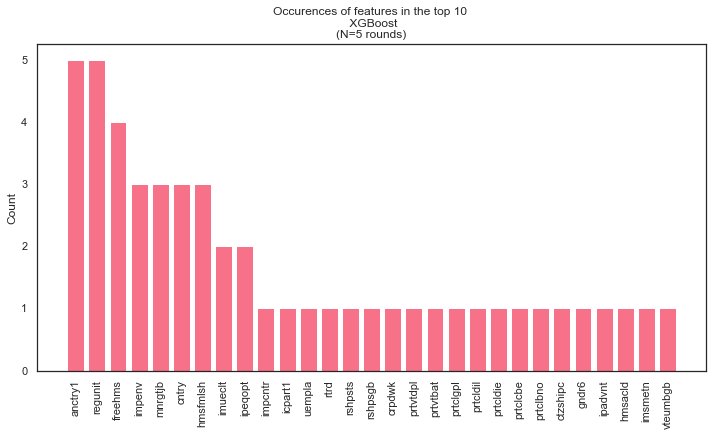

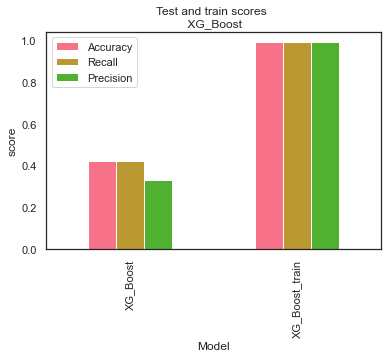

In [72]:
XGB_score_scaled, XGB_feat_scaled = XG_Boost(X_scaled_noclimate, y_zero, random_states, True, 0.1, empty_dict)

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.72      0.48      0.58      4985
        Prob       0.43      0.33      0.37      3091
    Prob not       0.08      0.33      0.13       390
     Def not       0.08      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.58      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.46      0.56      4967
        Prob       0.45      0.37      0.41      3110
    Prob not       0.10      0.37      0.15       395
     Def not       0.07      0.52      0.12       186

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.43      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

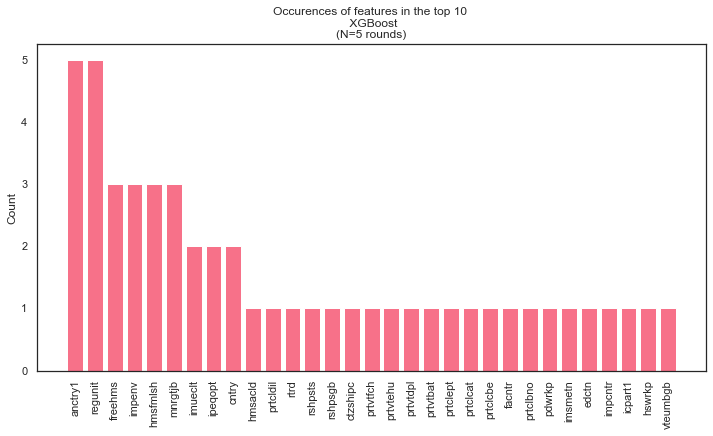

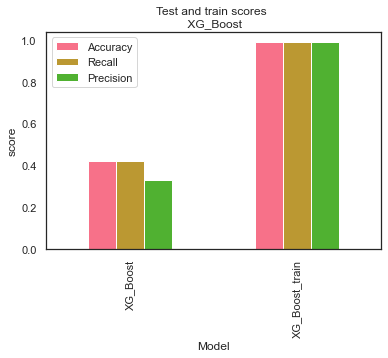

In [73]:
XGB_score, XGB_feat = XG_Boost(X_noclimate,  y_zero, random_states, True, 0.1, empty_dict)

In [74]:
print("XGBoost scaled score:\n", XGB_score_scaled)
print("\n========================================================\n")
print("XGBoost not scaled score:\n", XGB_score)

XGBoost scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.421113  0.420488   0.330319  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.988615  0.988615   0.988744  [5, 12, 19, 26, 33]


XGBoost not scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


In [75]:
#check if the models select similar features
print(set(XGB_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(XGB_feat["feature"]))

{'imsmetn', 'regunit', 'uempla', 'imueclt', 'crpdwk', 'mnrgtjb', 'prtvtbat', 'ctzshipc', 'rshpsts', 'hmsfmlsh', 'impenv', 'anctry1', 'impcntr', 'prtcldie', 'hmsacld', 'prtvtdpl', 'prtclbno', 'ipeqopt', 'ipadvnt', 'prtclcbe', 'cntry', 'prtclgpl', 'prtcldil', 'gndr6', 'vteumbgb', 'freehms', 'rshpsgb', 'rtrd', 'icpart1'}


{'imsmetn', 'regunit', 'prtclcat', 'imueclt', 'mnrgtjb', 'prtvtbat', 'ctzshipc', 'rshpsts', 'hmsfmlsh', 'prtclept', 'impenv', 'anctry1', 'impcntr', 'hmsacld', 'edctn', 'hswrkp', 'prtvtdpl', 'prtclbno', 'ipeqopt', 'prtvtehu', 'prtclcbe', 'cntry', 'prtcldil', 'prtvtfch', 'facntr', 'pdwrkp', 'vteumbgb', 'freehms', 'rshpsgb', 'rtrd', 'icpart1'}


In [76]:
#print features they have in common: only 1!
set_XGB_feat_scaled = list(set(XGB_feat_scaled["feature"]))
set_XGB_feat = list(set(XGB_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] not in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

Overlapping:

imsmetn
regunit
imueclt
mnrgtjb
prtvtbat
ctzshipc
rshpsts
hmsfmlsh
impenv
anctry1
impcntr
hmsacld
prtvtdpl
prtclbno
ipeqopt
prtclcbe
cntry
prtcldil
vteumbgb
freehms
rshpsgb
rtrd
icpart1

Not overlapping:

uempla
crpdwk
prtcldie
ipadvnt
prtclgpl
gndr6


## LightGBM
Conclusion (from code below): for LightGBM it doesnt matter much either. I will continue with the non_scaled data.

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.72      0.48      0.58      4985
        Prob       0.42      0.31      0.36      3091
    Prob not       0.08      0.35      0.13       390
     Def not       0.07      0.55      0.13       192

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.41      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.47      0.57      4967
        Prob       0.45      0.35      0.39      3110
    Prob not       0.09      0.37      0.15       395
     Def not       0.07      0.53      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

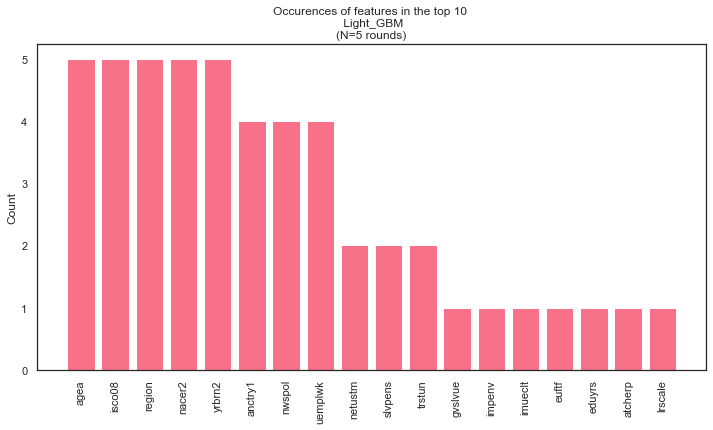

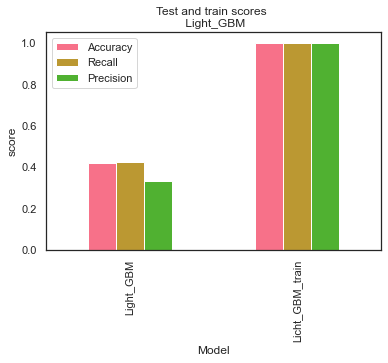

In [77]:
LGBM_score_scaled, LGBM_feat_scaled = Light_GBM(X_scaled_noclimate, y_zero, random_states, True, 0.1,empty_dict)

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.72      0.48      0.58      4985
        Prob       0.43      0.31      0.36      3091
    Prob not       0.09      0.36      0.14       390
     Def not       0.07      0.54      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.47      0.57      4967
        Prob       0.46      0.36      0.40      3110
    Prob not       0.10      0.39      0.16       395
     Def not       0.08      0.59      0.14       186

    accuracy                           0.43      8658
   macro avg       0.34      0.45      0.32      8658
weighted avg       0.58      0.43      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

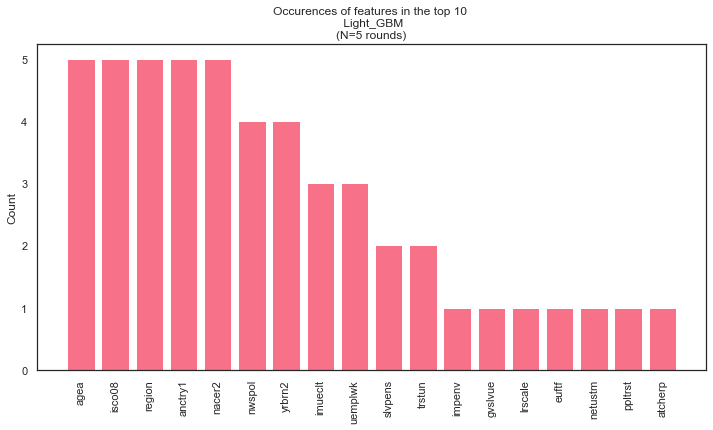

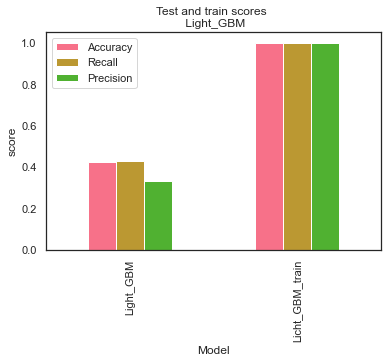

In [78]:
LGBM_score, LGBM_feat = Light_GBM(X_noclimate, y_zero, random_states, True, 0.1,empty_dict)

In [79]:
print("LightGMB scaled score:\n", LGBM_score_scaled)
print("\n========================================================\n")
print("LightGBM not scaled score:\n", LGBM_score)

LightGMB scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.420929  0.424937   0.330898  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999938  0.999938   0.999939  [5, 12, 19, 26, 33]


LightGBM not scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


In [80]:
#check if the models select similar features
print(set(LGBM_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'slvpens', 'euftf', 'uemplwk', 'nwspol', 'trstun', 'agea', 'atcherp', 'gvslvue', 'netustm', 'yrbrn2', 'isco08', 'impenv', 'anctry1', 'lrscale', 'imueclt', 'eduyrs', 'region', 'nacer2'}


{'slvpens', 'euftf', 'uemplwk', 'nwspol', 'trstun', 'agea', 'atcherp', 'gvslvue', 'netustm', 'yrbrn2', 'isco08', 'impenv', 'anctry1', 'lrscale', 'imueclt', 'ppltrst', 'region', 'nacer2'}


In [81]:
#print features they have in common: only 1!
set_LGBM_feat_scaled = list(set(LGBM_feat_scaled["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] not in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

Overlapping:

slvpens
euftf
uemplwk
nwspol
trstun
agea
atcherp
gvslvue
netustm
yrbrn2
isco08
impenv
anctry1
lrscale
imueclt
region
nacer2

Not overlapping:

eduyrs


# XGBoost versus LightGBM 
Based on the scores on the test set, XG_boost and LightGBM score equally low (see below). I'll choose XG_Boost over LightGBM the hyperparameter-optimization seems to be slightly easier in XG_boost.

In [82]:
#compare the scores (not scaled)
print("XGBoost score:\n", XGB_score)
print("\n========================================================\n")
print("LightGBM score:\n", LGBM_score)

XGBoost score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


LightGBM score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


In [83]:
#check if the models select similar features
print(set(XGB_feat["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'imsmetn', 'regunit', 'prtclcat', 'imueclt', 'mnrgtjb', 'prtvtbat', 'ctzshipc', 'rshpsts', 'hmsfmlsh', 'prtclept', 'impenv', 'anctry1', 'impcntr', 'hmsacld', 'edctn', 'hswrkp', 'prtvtdpl', 'prtclbno', 'ipeqopt', 'prtvtehu', 'prtclcbe', 'cntry', 'prtcldil', 'prtvtfch', 'facntr', 'pdwrkp', 'vteumbgb', 'freehms', 'rshpsgb', 'rtrd', 'icpart1'}


{'slvpens', 'euftf', 'uemplwk', 'nwspol', 'trstun', 'agea', 'atcherp', 'gvslvue', 'netustm', 'yrbrn2', 'isco08', 'impenv', 'anctry1', 'lrscale', 'imueclt', 'ppltrst', 'region', 'nacer2'}


In [84]:
#print features they have in common: 
set_XGB_feat = list(set(XGB_feat["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

for i in range (len(set_XGB_feat)):
    if set_XGB_feat[i] in set_LGBM_feat:
        print(set_XGB_feat[i])

imueclt
impenv
anctry1


In [85]:
#check out XGB features. Note: lot's of features are specific for 1 country; 1 feature is regional_unit
get_fullname(XGB_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
10,94,0.006250,impcntr,Allow many/few immigrants from poorer countries outside Europe
12,92,0.005387,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
7,89,0.006281,hmsfmlsh,Ashamed if close family member gay or lesbian
2,131,0.005584,ctzshipc,Citizenship
1,0,0.006825,cntry,Country
13,96,0.006374,imueclt,Country's cultural life undermined or enriched by immigrants
3,243,0.006108,edctn,Doing last 7 days: education
29,247,0.007250,rtrd,Doing last 7 days: retired
4,138,0.006998,facntr,Father born in country
0,316,0.015644,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"


In [86]:
#check out LGBM features. Note: Industry, Occupation (twice) and region have larger ranges. 
#This did not influence XGB much (previous project) but could check if it influences Light_GBM.
get_fullname(LGBM_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
0,200.0,173.000000,agea,"Age of respondent, calculated"
6,96.0,133.000000,imueclt,Country's cultural life undermined or enriched by immigrants
3,91.0,118.000000,euftf,European Union: European unification go further or gone too far
1,316.0,142.400000,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
2,107.0,138.000000,atcherp,How emotionally attached to Europe
5,336.0,143.000000,impenv,Important to care for nature and environment
9,272.0,182.000000,nacer2,"Industry, NACE rev.2"
10,3.0,138.000000,netustm,"Internet use, how much time on typical day, in minutes"
12,4.0,135.000000,ppltrst,Most people can be trusted or you can't be too careful
11,1.0,150.000000,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"


# Continue with XGBoost

## Optimize XGBoost learning rate
Find the best performing learning rate: a balance between high test_score and no overfitting in the train_set.

In [87]:
learning_rates = np.arange(0, 0.04, 0.0001)

In [88]:
#TAKES LONG TO RUN, DATA STORED IN DATAFRAME INSTEAD
# score_lr, feat_lr = tune_learning(X_noclimate, y_zero, 7, True, learning_rates, empty_dict)

In [89]:
# score_lr.to_csv('./data/learning_rate_optimization.csv') # store in CSV, only if cell above is not cancelled out 
# feat_lr.to_csv('./data/learning_rate_optimization_features.csv')

In [90]:
#import the created csv
score_lr = pd.read_csv('./data/learning_rate_optimization.csv')
score_lr.head()

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004


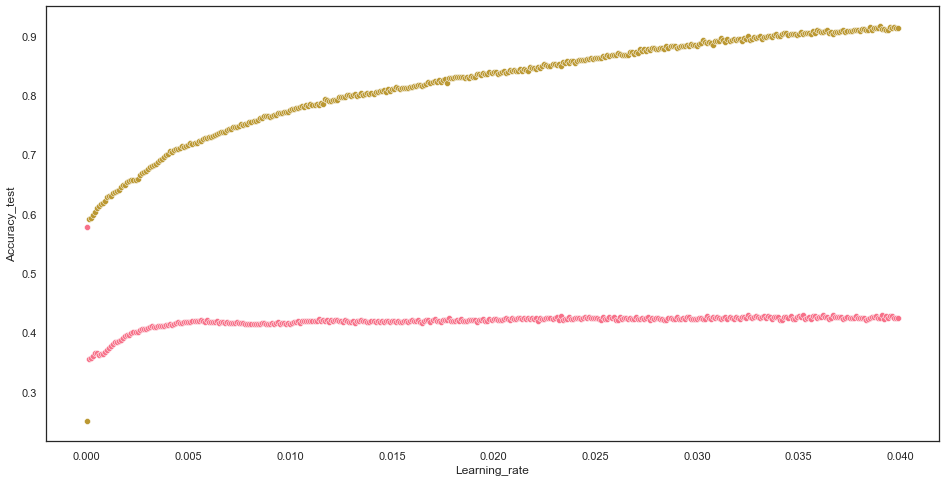

In [91]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [92]:
score_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
367,367,0.429545,0.438064,0.333342,0.903676,0.903676,0.905584,0.0367
391,391,0.429429,0.444347,0.335122,0.911280,0.911280,0.912939,0.0391
325,325,0.429198,0.437419,0.333504,0.898923,0.898923,0.900696,0.0325
352,352,0.429198,0.442046,0.333903,0.903042,0.903042,0.905000,0.0352
362,362,0.428967,0.442254,0.333650,0.906210,0.906210,0.908140,0.0362
393,393,0.428274,0.440185,0.333267,0.910013,0.910013,0.911596,0.0393
388,388,0.428043,0.433883,0.333665,0.913181,0.913181,0.914519,0.0388
350,350,0.428043,0.441734,0.334898,0.902408,0.902408,0.904249,0.0350
333,333,0.427928,0.434606,0.332722,0.898289,0.898289,0.899839,0.0333


The top 20 test-accuracies are all pretty overrtrained. And have relatively high learning_rates. Looking at the graph, I'd prefer a learning_rate smaller than 0.01. 
Zoom in a little on those values..

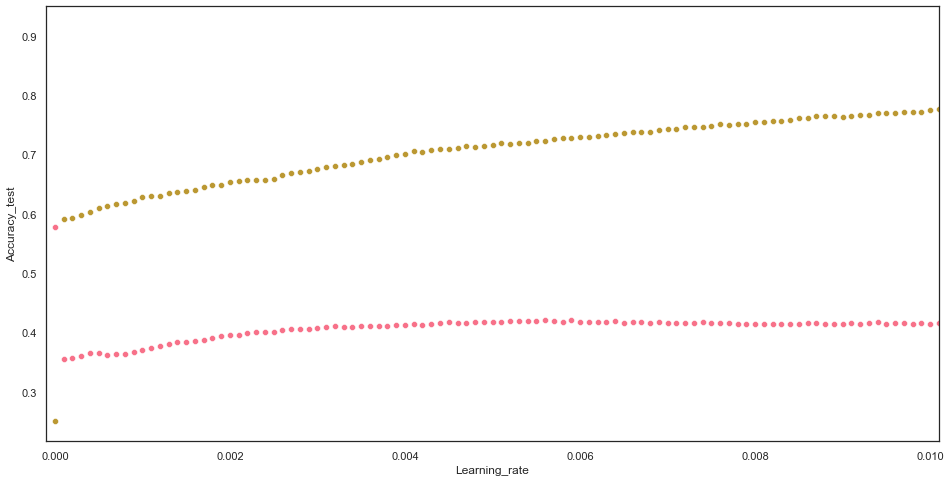

In [93]:
#plot a tighter range
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-.0001,0.0101)
plt.show();

In [94]:
score_low_lr = score_lr[score_lr["Learning_rate"]<=0.01]

In [95]:
score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test

<ipython-input-95-e187c45cbd55>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test


In [96]:
score_low_lr.sort_values(by="Accuracy_test", ascending=False).head(20)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
56,56,0.420536,0.427521,0.323065,0.723384,0.723384,0.726313,0.0056,0.302848
59,59,0.420305,0.427577,0.323302,0.727820,0.727820,0.730864,0.0059,0.307515
53,53,0.419612,0.429510,0.323446,0.718948,0.718948,0.722149,0.0053,0.299336
57,57,0.419496,0.426946,0.322642,0.725602,0.725602,0.728328,0.0057,0.306106
55,55,0.419265,0.426940,0.322577,0.722117,0.722117,0.725284,0.0055,0.302851
64,64,0.419150,0.427630,0.322386,0.734474,0.734474,0.737264,0.0064,0.315324
54,54,0.418803,0.427267,0.322220,0.718948,0.718948,0.721995,0.0054,0.300145
52,52,0.418803,0.428664,0.323262,0.717047,0.717047,0.720348,0.0052,0.298243
63,63,0.418457,0.424196,0.321305,0.732890,0.732890,0.735850,0.0063,0.314433


Top learning rates are still overtrained. Let's see where the smallest distance between train&test accuracy is.

In [97]:
score_low_lr.sort_values(by="distance", ascending=True)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001,0.236524
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002,0.236607
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004,0.237044
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003,0.238443
5,5,0.364980,0.381661,0.304286,0.609632,0.609632,0.612600,0.0005,0.244652
6,6,0.362670,0.378486,0.303552,0.613752,0.613752,0.616444,0.0006,0.251081
12,12,0.376877,0.390309,0.303665,0.629911,0.629911,0.632366,0.0012,0.253034
7,7,0.363248,0.380718,0.302788,0.616286,0.616286,0.618366,0.0007,0.253039
14,14,0.383460,0.393779,0.306314,0.636565,0.636565,0.640030,0.0014,0.253105


Taking the best distance (excluding learning_rate=0) decreases the accuracy of the testset quite a lot (to 0.36, while the allround best was >0.4 (though more heavely overrtained)). Considering both are overtrained, I'll go with the higher  Accuracy testscore, setting the learning rate to 0.0367.

In [98]:
top_lr = 0.0367

## Optimize XGBoost hyperparameters

Use the top learning rate. 
Try different random_states in train_test_split sets. See if Hyperopt returns similar results.

https://www.kaggle.com/prashant111/a-guide-on-xgboost-hyperparameters-tuning

## YOU CAN find space here

In [99]:
space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3
    }

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [101]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5361515361515361                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:47,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:44,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:41,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:39,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:38,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:36,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:36,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:47,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:39,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:36,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:34,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:33,  2.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:32,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 16%|███████▎                                      | 16/100 [00:07<00:42,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:39,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:46,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:41,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 20%|█████████▏                                    | 20/100 [00:09<00:47,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:42,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:39,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:36,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:34,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:32,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:31,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:30,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:29,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:29,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:29,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:29,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:28,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:28,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:27,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:26,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:26,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:25,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:25,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:24,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:24,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:23,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:22,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:22,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:22,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:20,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:26,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:23,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:21,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:25,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:22,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:21,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:20,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:19,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:17,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:16,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:16,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:15,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:14,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:13,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:11,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:11,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:10,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:09,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:09,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:07,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:07,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:06,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:06,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5396165396165397                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:07,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5467775467775468                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:07,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:05,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:04,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:03,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:01,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:45<00:00,  2.19trial/s, best loss: -0.5777315777315777]


In [102]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.7926369665359181, 'gamma': 1.6011503073265292, 'max_depth': 7.0, 'min_child_weight': 7.0, 'reg_alpha': 153.0, 'reg_lambda': 0.38473668253941085}


see if the estimation of hyperparameters is stable: run the same model 10 times

In [103]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:39,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:39,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:38,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:37,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:37,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:37,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:37,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:36,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:36,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5330330330330331                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:47,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:43,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:40,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:38,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:36,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5412335412335413                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:44,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:40,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:37,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:35,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:34,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:33,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:33,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:32,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:31,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:30,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:30,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:38,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:35,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:33,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:31,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:30,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:29,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:28,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:26,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:26,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:26,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:25,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:24,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:30,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:28,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 46%|█████████████████████▏                        | 46/100 [00:21<00:32,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:29,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:26,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:24,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:24,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:23,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:22,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:21,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:21,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5330330330330331                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:26,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:23,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:21,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:20,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:19,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:18,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:18,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:17,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:16,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:15,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:14,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:14,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:13,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:13,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:12,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:12,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:11,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5474705474705475                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:13,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5267960267960268                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:14,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:37<00:15,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:15,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:13,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:11,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:11,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:10,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:40<00:08,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:07,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:41<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:42<00:05,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:05,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:04,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:44<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:44<00:03,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:40,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:39,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:38,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:38,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:38,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:38,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:37,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:37,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:45,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:42,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5423885423885424                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:49,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:41,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:38,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:36,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:35,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:35,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:34,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:32,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:33,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:33,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:43,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:40,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:37,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:35,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:33,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:32,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:30,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:29,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:30,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:29,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:28,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:28,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:27,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:27,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:26,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:26,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:25,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:25,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:24,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:24,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:23,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:23,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:23,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:22,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:22,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:21,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:21,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:21,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:20,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:20,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5392700392700392                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:24,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:22,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:20,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:19,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:18,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5215985215985216                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:22,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:20,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:18,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:17,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:15,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:15,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:14,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:13,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:12,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:11,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:11,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:10,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:10,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:36<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:09,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:08,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:06,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5334950334950335                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:07,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:06,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:05,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5462000462000463                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:06,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:05,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:04,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:44<00:03,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:30,  1.09trial/s, best loss: -0.5378840378840379]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:15,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:05,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:10,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:00,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:53,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:48,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:45,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:42,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:41,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:39,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:38,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:37,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:36,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:46,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:42,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:40,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:37,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5501270501270501                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:44,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:41,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:39,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:37,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:36,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:35,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:34,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:34,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:33,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:33,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5242550242550242                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:40,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.53996303996304                                                                                                       
 30%|█████████████▊                                | 30/100 [00:15<00:47,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:42,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:38,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:35,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:32,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:31,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:30,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:29,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:36,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:33,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:31,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:29,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:28,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:27,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:26,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:25,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:25,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:24,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5382305382305382                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:30,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:28,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:26,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:24,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:23,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:21,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:20,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5411180411180411                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:25,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:22,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 61%|████████████████████████████                  | 61/100 [00:31<00:24,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:22,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:20,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:19,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:17,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:17,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:16,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:15,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:14,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:13,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:13,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:12,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:11,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:13,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:12,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:11,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:10,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:09,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:41<00:08,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:42<00:07,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:07,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:43<00:06,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:44<00:06,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:44<00:05,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:45<00:05,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:45<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:46<00:04,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:46<00:03,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:47<00:03,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:02,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:48<00:02,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:48<00:01,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:49<00:00,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:50<00:00,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:41,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:41,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:40,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:40,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5371910371910372                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:51,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:44,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:42,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:52,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:47,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:43,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:41,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:39,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:38,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:37,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:36,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:35,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5395010395010394                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:46,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:42,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:39,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:38,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:36,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:36,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:34,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:33,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:33,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:32,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:33,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:32,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:31,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:30,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:30,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:30,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:29,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:28,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:28,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:28,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:28,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:27,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:26,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:25,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:25,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:25,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:24,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:23,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5316470316470316                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:31,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:28,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5419265419265419                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:32,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:29,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:26,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5392700392700392                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:30,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5471240471240472                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:32,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:28,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:25,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:23,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:22,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:20,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:19,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5537075537075538                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:24,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:21,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:19,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:17,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:16,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:16,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:14,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:14,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:13,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:13,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:12,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:14,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:12,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:11,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:10,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:10,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:09,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:09,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:08,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:07,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:07,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:44<00:06,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:45<00:06,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:45<00:05,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:46<00:06,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:05,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:47<00:04,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:49<00:02,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5403095403095403                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:30,  1.09trial/s, best loss: -0.5403095403095403]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:15,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:05,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:58,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:52,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:48,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:46,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:44,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:43,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:41,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:40,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:39,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:38,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:37,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:37,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:36,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:49,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:44,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:41,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:39,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:38,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:38,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:37,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:36,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:35,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:35,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:34,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:34,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:33,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:32,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:32,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5330330330330331                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:42,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:38,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:35,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5509355509355509                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:42,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:38,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:35,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:32,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:30,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:29,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:29,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:28,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:27,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:26,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:26,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:25,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:24,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:24,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:23,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:30,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:27,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:24,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:23,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:22,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:21,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:26,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:23,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:22,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:21,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:20,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:19,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:18,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:17,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:17,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:16,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:15,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:14,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:14,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:13,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:13,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:12,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:11,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:11,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:39<00:10,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:10,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:40<00:09,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:09,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:41<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:42<00:07,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:07,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:43<00:06,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:44<00:06,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:44<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:45<00:05,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:45<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:46<00:04,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:46<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:47<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:02,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:48<00:02,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:48<00:01,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:49<00:01,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5382305382305382                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:50<00:00,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5532455532455532                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5368445368445368                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:24,  1.17trial/s, best loss: -0.5368445368445368]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:11,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:01,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:55,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:51,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:48,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5427350427350427                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:57,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:51,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:47,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:45,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:43,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:41,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5416955416955417                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:50,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:46,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5509355509355509                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:53,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 16%|███████▎                                      | 16/100 [00:09<00:58,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:51,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:10<00:46,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:43,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:40,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:39,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:37,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:37,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5477015477015477                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:45,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:14<00:42,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:38,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:15<00:38,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:37,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:16<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:34,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:17<00:33,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:32,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:18<00:32,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:31,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:31,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:29,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:28,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:27,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:26,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5420420420420421                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:32,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:30,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:25<00:28,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:28,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:27,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:26,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:25,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:28<00:26,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:25,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:29<00:23,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:22,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:30<00:22,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:21,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:20,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:18,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:18,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:18,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:19,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:18,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:17,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:15,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:15,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:15,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:14,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:14,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:37<00:13,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:13,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:38<00:12,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:12,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:39<00:12,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:11,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:10,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:10,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5541695541695542                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:12,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:13,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5301455301455301                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:15,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:44<00:12,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:10,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:45<00:08,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:07,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:46<00:07,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:06,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:47<00:05,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:05,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:03,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:03,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:51<00:02,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:52,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:53,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:50,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:47,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:45,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:44,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:43,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5267960267960268                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:56,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:50,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:46,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:44,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:40,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:37,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5407715407715408                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:49,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:44,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:40,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5346500346500347                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:52,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:47,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:44,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:42,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:38,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:39,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:38,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:33,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:34,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:36,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:34,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:33,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:33,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:32,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:29,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:28,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:28,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:28,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:26,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:27,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:27,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:27,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:26,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:25,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:24,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:24,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:24,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:22,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:22,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:22,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:20,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:20,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:20,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:20,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:19,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:18,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:18,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:17,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:17,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5343035343035343                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:21,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5496650496650497                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:22,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:19,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:18,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5503580503580504                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:19,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:21,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:18,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:16,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:14,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:13,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:12,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:11,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:10,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:10,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:09,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:08,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:08,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:04,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:03,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:49<00:02,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:01,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:50<00:00,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:51<00:00,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5384615384615384                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:54,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:51,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:48,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:46,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:44,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:43,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5355740355740356                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:57,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:51,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:47,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5537075537075538                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:55,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:50,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:46,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:43,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:41,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:39,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:37,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:36,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:36,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:35,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:35,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:35,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5370755370755371                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:43,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:40,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:37,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:35,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:34,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5467775467775468                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:41,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:37,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5534765534765534                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:42,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5375375375375375                                                                                                     
 37%|█████████████████                             | 37/100 [00:20<00:47,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:41,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:21<00:37,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:34,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:22<00:32,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5471240471240472                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:38,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:23<00:34,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:31,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:24<00:29,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:28,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:25<00:27,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5361515361515361                                                                                                     
 48%|██████████████████████                        | 48/100 [00:26<00:33,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:26<00:30,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:27<00:28,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:27<00:26,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:28<00:24,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:28<00:23,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:29<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:29<00:22,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:30<00:21,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:30<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:31<00:20,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:19,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:32<00:19,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:19,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:33<00:18,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:22,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:34<00:20,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:19,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:35<00:18,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:17,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:36<00:16,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:15,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:37<00:14,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:14,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:13,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:13,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:12,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:12,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:11,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:11,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:10,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:10,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:09,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:09,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:07,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:06,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:05,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:04,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5384615384615384                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:05,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5281820281820282                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:04,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:50<00:03,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:03,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5384615384615384                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:51<00:02,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:52<00:01,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:53<00:00,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:43,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:43,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:43,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:42,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:41,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5236775236775236                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:55,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:50,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:47,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:44,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:42,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:40,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:39,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:39,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:38,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:37,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:36,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:36,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:36,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:47,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:53,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:48,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.542966042966043                                                                                                      
 23%|██████████▌                                   | 23/100 [00:12<00:54,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:48,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:43,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:41,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5503580503580504                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:48,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:43,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:39,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:37,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:36,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:34,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:33,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:32,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:31,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5525525525525525                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:36,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:34,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5301455301455301                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:22<00:41,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:37,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:23<00:33,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:31,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:24<00:29,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:28,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:25<00:26,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:25<00:26,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:26<00:25,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:24,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:23,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:23,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:22,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:21,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:20,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:19,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:19,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:18,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:18,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:17,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5385770385770385                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:22,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:20,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5594825594825594                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:35<00:23,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:20,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:36<00:19,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5578655578655579                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:37<00:22,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:37<00:19,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:38<00:17,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:15,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:39<00:14,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:13,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:40<00:13,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:41<00:11,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:10,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:42<00:10,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:09,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:43<00:09,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:08,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:44<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:07,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:45<00:07,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:06,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:05,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:03,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5442365442365442                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:43,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:42,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:42,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:42,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:41,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:40,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:40,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:51,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:47,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.533957033957034                                                                                                      
 12%|█████▌                                        | 12/100 [00:06<00:57,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:50,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:46,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:43,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:41,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:39,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:37,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:36,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:36,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5453915453915454                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:45,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:42,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:41,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:39,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:37,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:36,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:35,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5254100254100255                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:44,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:41,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:38,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:36,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:34,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:32,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:31,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:29,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:28,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:27,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:26,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:26,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:25,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:25,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:25,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:24,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5527835527835527                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:31,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:28,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:26,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:25,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:24,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:23,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:22,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:21,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:28<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:20,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:29<00:20,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:19,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:30<00:18,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:18,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5182490182490183                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:23,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:21,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:19,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:18,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:17,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:16,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:15,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:15,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:14,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:14,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:13,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:12,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:11,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:39<00:11,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5564795564795565                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:13,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:12,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:11,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:10,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5576345576345576                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:11,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:10,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:11,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:09,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:08,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5377685377685377                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:09,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:07,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5412335412335413                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:47<00:07,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:06,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5404250404250405                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:06,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:49<00:05,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:04,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:50<00:03,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:51<00:02,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:53<00:00,  1.89trial/s, best loss: -0.5777315777315777]


In [104]:
#putting the list of dictionaries into a single dictionary
dict_tuple_lr = tuple(values_list_lr)
dict_full_lr = {k:[d.get(k) for d in dict_tuple_lr] for k in {k for d in dict_tuple_lr for k in d}}

In [105]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_lr['max_depth'])):
    dict_full_lr['max_depth'][i] = int(dict_full_lr['max_depth'][i])

dict_full_lr

{'colsample_bytree': [0.7189500594634475,
  0.6657647704244367,
  0.960780262912956,
  0.8473196911148144,
  0.5383274092734478,
  0.7789421352994117,
  0.9523140799600637,
  0.8914294165466249,
  0.8195440997051551,
  0.6940429618759627],
 'min_child_weight': [3.0, 6.0, 5.0, 8.0, 7.0, 3.0, 2.0, 0.0, 10.0, 4.0],
 'reg_alpha': [52.0,
  174.0,
  155.0,
  139.0,
  77.0,
  104.0,
  121.0,
  60.0,
  116.0,
  92.0],
 'gamma': [6.670463060021842,
  7.268456419520606,
  7.289261226476321,
  6.4951401442207,
  6.692005565090121,
  4.902934923435497,
  2.4341239375089705,
  5.081343612029115,
  3.158887144512719,
  3.733078197530072],
 'max_depth': [17, 16, 11, 12, 8, 14, 5, 10, 5, 9],
 'reg_lambda': [0.41315470220114947,
  0.6242438418459737,
  0.960116549449776,
  0.8678723026459242,
  0.46961851085464756,
  0.23226331513109066,
  0.4249889197140565,
  0.2808904395960551,
  0.8254040365782108,
  0.6618764563065148]}

In [106]:
top_hyperparams_lr = pd.DataFrame.from_dict(dict_full_lr)
top_hyperparams_lr.sort_values(by="max_depth")

,colsample_bytree,min_child_weight,reg_alpha,gamma,max_depth,reg_lambda
6,0.952314,2.0,121.0,2.434124,5,0.424989
8,0.819544,10.0,116.0,3.158887,5,0.825404
4,0.538327,7.0,77.0,6.692006,8,0.469619
9,0.694043,4.0,92.0,3.733078,9,0.661876
7,0.891429,0.0,60.0,5.081344,10,0.280890
2,0.960780,5.0,155.0,7.289261,11,0.960117
3,0.847320,8.0,139.0,6.495140,12,0.867872
5,0.778942,3.0,104.0,4.902935,14,0.232263
1,0.665765,6.0,174.0,7.268456,16,0.624244
0,0.718950,3.0,52.0,6.670463,17,0.413155


They are all over the place. Try them all, see which one scores best.

In [107]:
pd.Series.to_dict(top_hyperparams_lr.iloc[0,:])

{'colsample_bytree': 0.7189500594634475,
 'min_child_weight': 3.0,
 'reg_alpha': 52.0,
 'gamma': 6.670463060021842,
 'max_depth': 17.0,
 'reg_lambda': 0.41315470220114947}

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.64      0.64      0.64      4985
        Prob       0.43      0.23      0.30      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.64      0.11       192

    accuracy                           0.47      8658
   macro avg       0.28      0.38      0.26      8658
weighted avg       0.53      0.47      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.63      0.63      0.63      4967
        Prob       0.43      0.23      0.30      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.52      0.45      0.47      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-score   support

         Def       0.66      0.62      0.64      4903
        Prob       0.45      0.13      0.20      3176
    Prob not       0.08      0.25      0.13       379
     Def not       0.06      0.56      0.10       200

    accuracy                           0.42      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.54      0.42      0.44      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.63      0.70      0.66      4901
        Prob       0.49      0.17      0.25      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.53      0.48      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.66      0.63      0.64      4959
        Prob       0.46      0.29      0.36      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.61      0.10       165

    accuracy                           0.48      8658
   macro avg       0.29      0.38      0.27      8658
weighted avg       0.55      0.48      0.50      8658
 



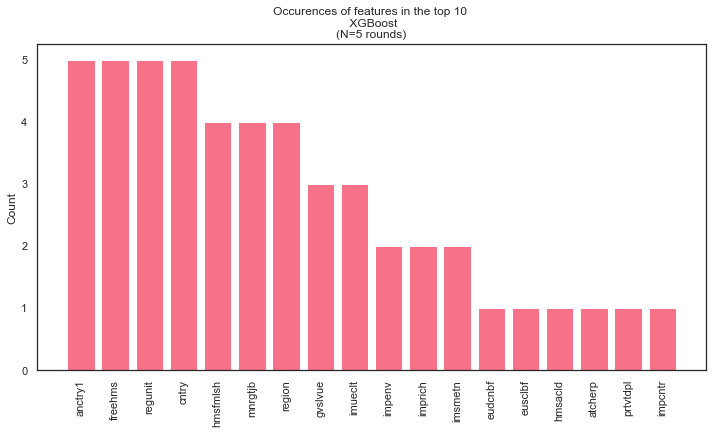

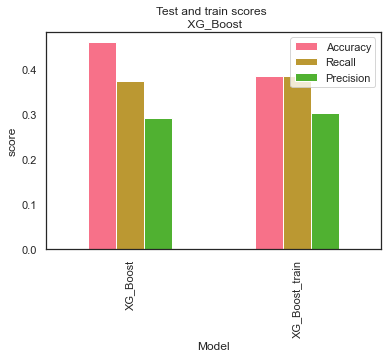

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.459506  0.373089   0.292347  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.383644  0.383644   0.302961  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.58      1.00      0.73      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.73      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.00      0.00      0.00       186

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.73      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



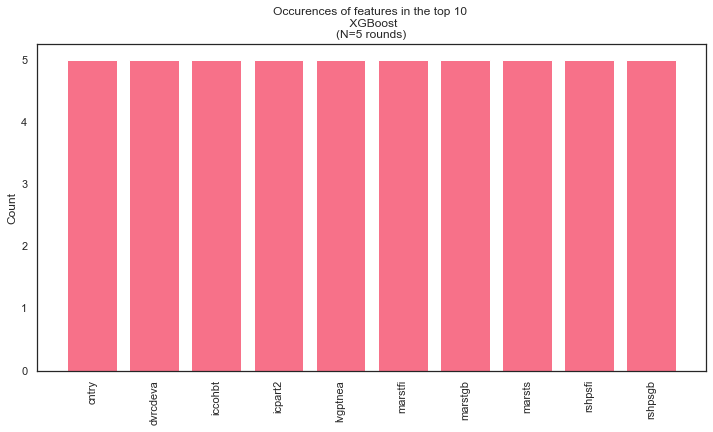

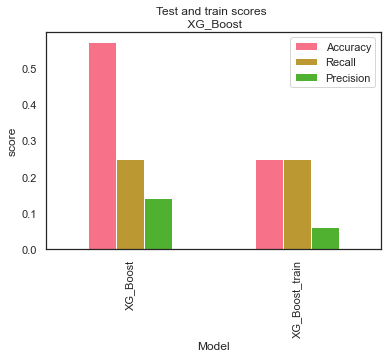

            Model  Accuracy  Recall  Precision         Random_state
0        XG_Boost  0.570917    0.25   0.142729  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.250000    0.25   0.062500  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



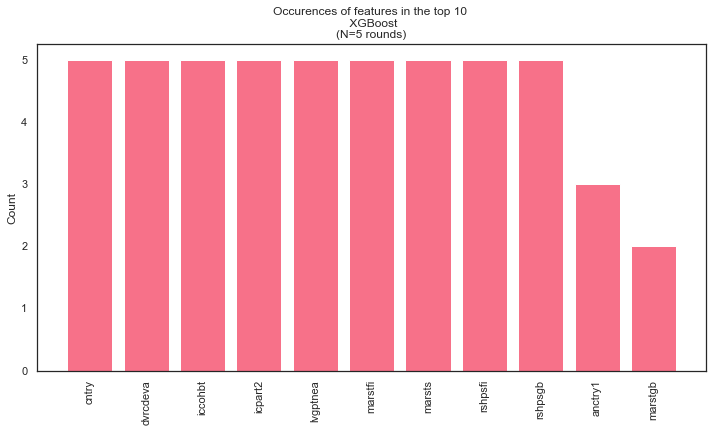

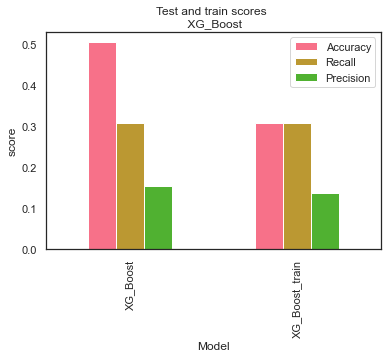

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.505290  0.308508   0.153843  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.307385  0.307385   0.136517  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



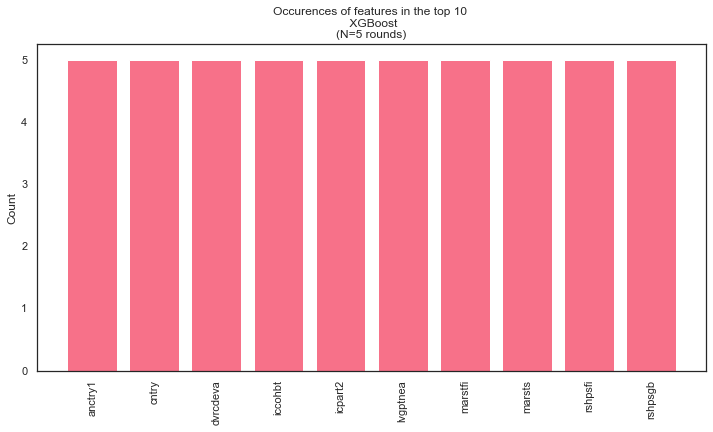

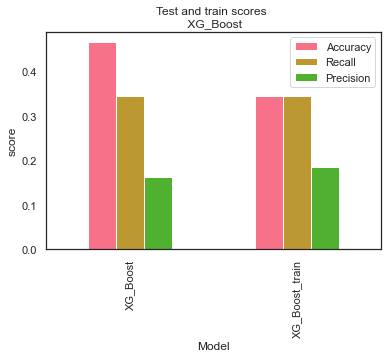

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.64      0.66      0.65      4985
        Prob       0.44      0.20      0.27      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.52      0.46      0.47      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.62      0.68      0.65      4967
        Prob       0.44      0.16      0.23      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.52      0.46      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.65      0.65      0.65      4903
        Prob       0.49      0.26      0.34      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.30      0.37      0.27      8658
weighted avg       0.55      0.48      0.49      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.62      0.71      0.66      4901
        Prob       0.49      0.16      0.24      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.25      8658
weighted avg       0.53      0.48      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.65      0.68      0.66      4959
        Prob       0.49      0.21      0.30      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.30      0.38      0.26      8658
weighted avg       0.55      0.48      0.49      8658
 



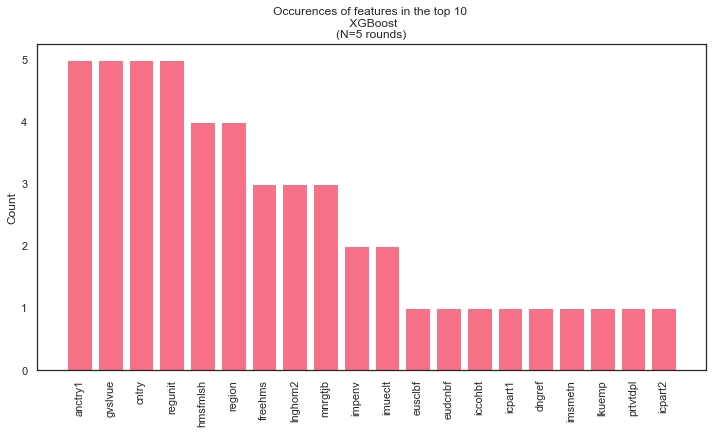

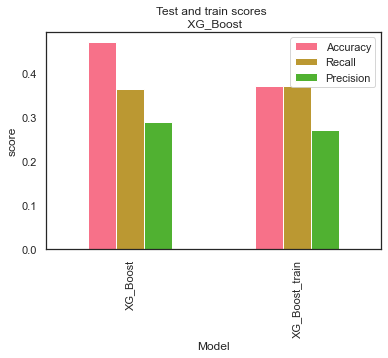

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.470963  0.364908   0.289945  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.371234  0.371234   0.272037  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.62      0.69      0.65      4967
        Prob       0.44      0.14      0.21      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.63      0.69      0.66      4903
        Prob       0.49      0.20      0.29      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.63      0.71      0.67      4959
        Prob       0.49      0.16      0.24      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



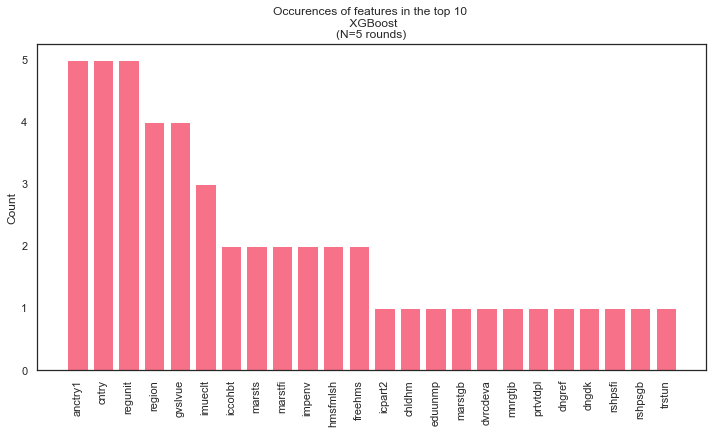

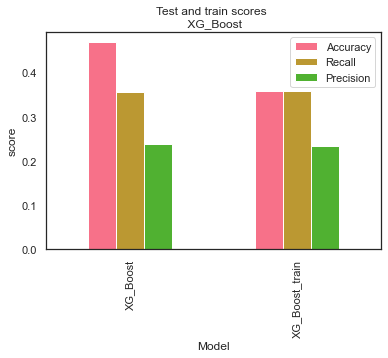

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.468630  0.354845   0.238061  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.357716  0.357716   0.234306  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.63      0.64      0.63      4967
        Prob       0.43      0.21      0.28      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.51      0.45      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.62      0.71      0.66      4903
        Prob       0.48      0.16      0.23      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.29      0.35      0.25      8658
weighted avg       0.53      0.47      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.63      0.71      0.67      4959
        Prob       0.47      0.20      0.28      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.06      0.58      0.10       165

    accuracy                           0.49      8658
   macro avg       0.29      0.37      0.26      8658
weighted avg       0.53      0.49      0.49      8658
 



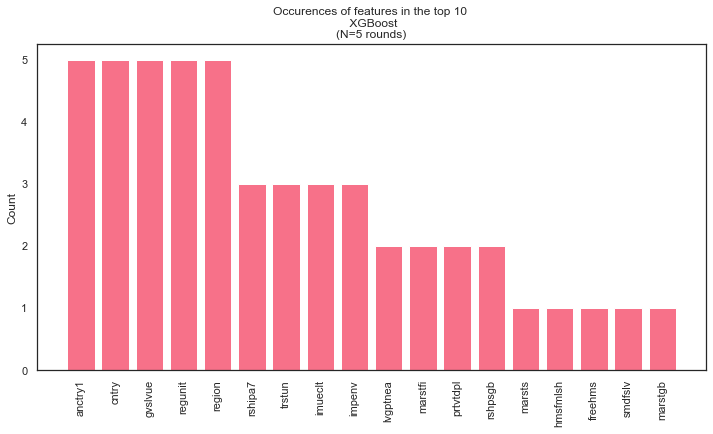

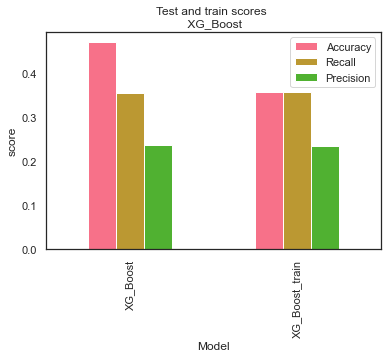

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.469392  0.354706   0.235862  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.356957  0.356957   0.234615  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.64      0.64      0.64      4985
        Prob       0.43      0.23      0.30      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.62      0.11       192

    accuracy                           0.47      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.53      0.47      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.64      0.62      0.63      4967
        Prob       0.43      0.24      0.31      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.36      0.26      8658
weighted avg       0.52      0.45      0.47      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-score   support

         Def       0.66      0.62      0.64      4903
        Prob       0.45      0.13      0.20      3176
    Prob not       0.08      0.26      0.13       379
     Def not       0.06      0.56      0.10       200

    accuracy                           0.42      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.54      0.42      0.44      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.63      0.69      0.66      4901
        Prob       0.49      0.20      0.28      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.30      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.66      0.62      0.64      4959
        Prob       0.46      0.34      0.39      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.06      0.60      0.10       165

    accuracy                           0.49      8658
   macro avg       0.29      0.39      0.28      8658
weighted avg       0.55      0.49      0.51      8658
 



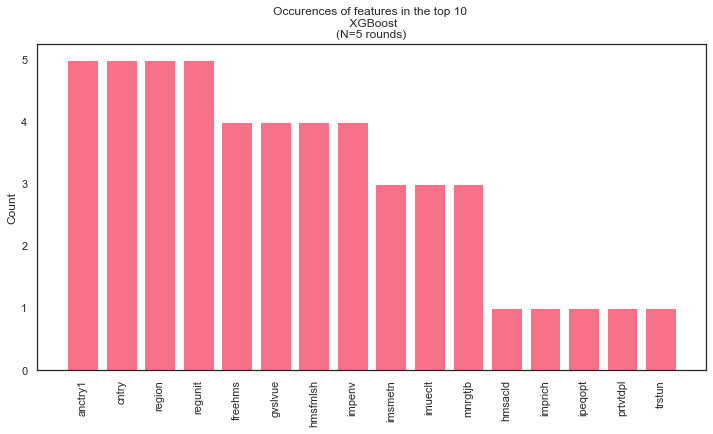

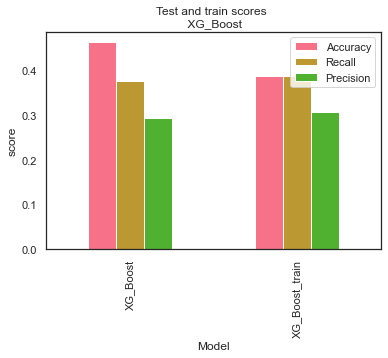

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.461793  0.374576   0.293484  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.386528  0.386528   0.306053  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.62      0.67      0.64      4967
        Prob       0.44      0.17      0.25      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.52      0.46      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.62      0.71      0.66      4903
        Prob       0.48      0.16      0.23      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.29      0.35      0.25      8658
weighted avg       0.53      0.47      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.63      0.71      0.67      4959
        Prob       0.47      0.17      0.25      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.59      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.53      0.48      0.48      8658
 



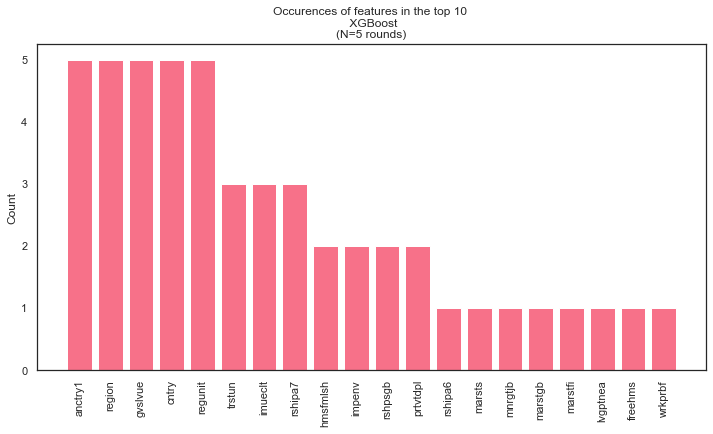

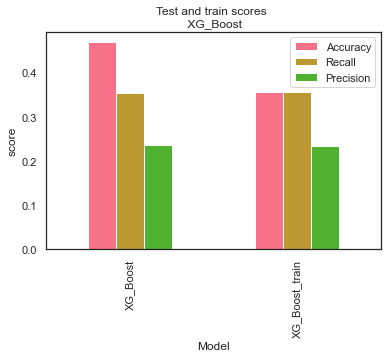

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.468237  0.353579   0.236333  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.356343  0.356343   0.233039  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.64      0.66      0.65      4985
        Prob       0.44      0.20      0.27      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.52      0.46      0.47      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.62      0.68      0.65      4967
        Prob       0.44      0.16      0.24      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.52      0.46      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.64      0.69      0.66      4903
        Prob       0.50      0.21      0.30      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.30      0.36      0.26      8658
weighted avg       0.54      0.48      0.49      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.65      0.68      0.66      4959
        Prob       0.48      0.22      0.30      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.61      0.09       165

    accuracy                           0.48      8658
   macro avg       0.30      0.38      0.26      8658
weighted avg       0.55      0.48      0.49      8658
 



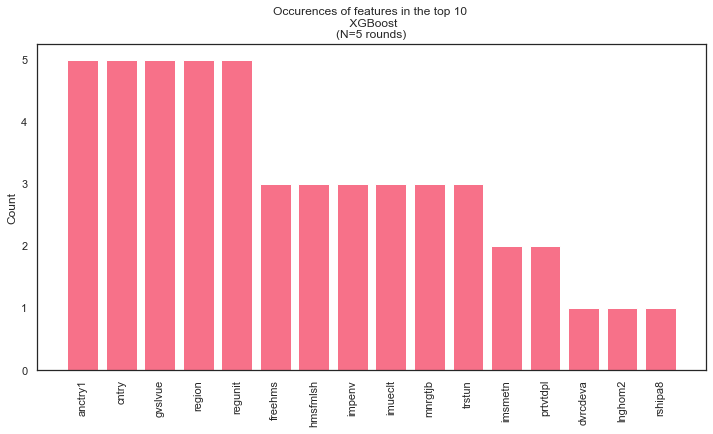

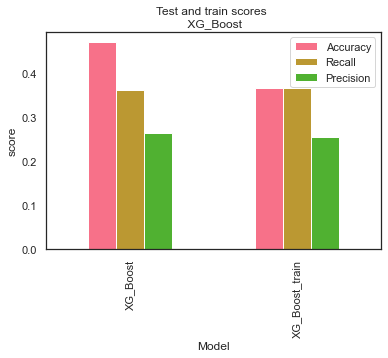

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.469924  0.360579   0.263652  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.365970  0.365970   0.254281  [5, 12, 19, 26, 33]


In [108]:
#try them all
keep_score =[]
keep_feat = []

for i in range(len(top_hyperparams_lr)):
    a  = pd.Series.to_dict(top_hyperparams_lr.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score, feat = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, a)  
    print(score)
    keep_score.append(score)
    keep_feat.append(feat)

eyeball the outcome..: first and second dict-items are oke; the others won't predict all four classes (which makes them unsuitable). The first performs slightly better (accuracy_test .42 versus 0.41 for the second one, see below). But overall the scores are quite bad.

In [109]:
keep_score

[            Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.459506  0.373089   0.292347  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.383644  0.383644   0.302961  [5, 12, 19, 26, 33],
             Model  Accuracy  Recall  Precision         Random_state
 0        XG_Boost  0.570917    0.25   0.142729  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.250000    0.25   0.062500  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.505290  0.308508   0.153843  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.307385  0.307385   0.136517  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.470963  0.364908   0.289945  [5, 12, 19, 26, 33]
 1  XG_B

In [110]:
top_params = pd.Series.to_dict(top_hyperparams_lr.iloc[0,:])
top_params["max_depth"] = int(top_params["max_depth"])
type(top_params)

dict

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.64      0.64      0.64      4985
        Prob       0.43      0.23      0.30      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.64      0.11       192

    accuracy                           0.47      8658
   macro avg       0.28      0.38      0.26      8658
weighted avg       0.53      0.47      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.63      0.63      0.63      4967
        Prob       0.43      0.23      0.30      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.45      8658
   macro avg       0.28      0.35      0.25      8658
weighted avg       0.52      0.45      0.47      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-score   support

         Def       0.66      0.62      0.64      4903
        Prob       0.45      0.13      0.20      3176
    Prob not       0.08      0.25      0.13       379
     Def not       0.06      0.56      0.10       200

    accuracy                           0.42      8658
   macro avg       0.31      0.39      0.27      8658
weighted avg       0.54      0.42      0.44      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.63      0.70      0.66      4901
        Prob       0.49      0.17      0.25      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.53      0.48      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.66      0.63      0.64      4959
        Prob       0.46      0.29      0.36      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.61      0.10       165

    accuracy                           0.48      8658
   macro avg       0.29      0.38      0.27      8658
weighted avg       0.55      0.48      0.50      8658
 



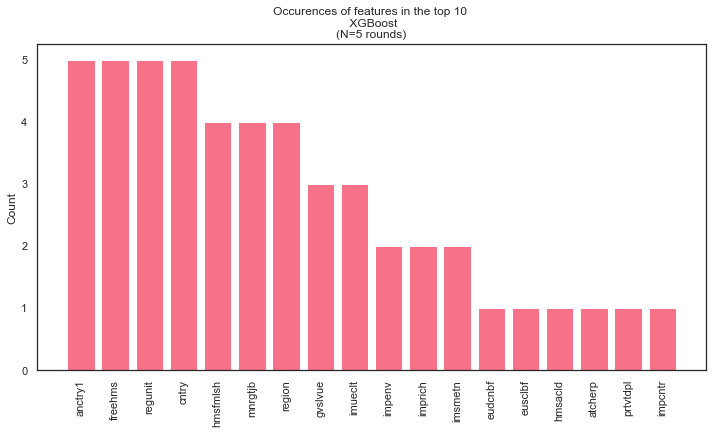

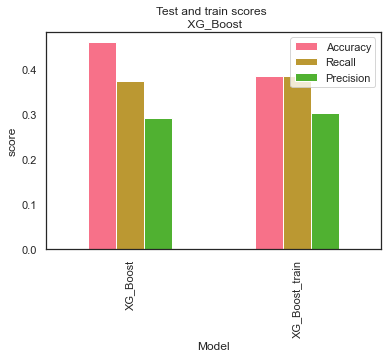

In [112]:
#run the model with the hyperparams
score_hp, feat_hp = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, top_params)

In [113]:
score_hp

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.459506,0.373089,0.292347,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.383644,0.383644,0.302961,"[5, 12, 19, 26, 33]"


In [115]:
feat_hp.groupby("feature").count()

,indices,importance,model
feature,,,
anctry1,5,5,5
atcherp,1,1,1
cntry,5,5,5
eudcnbf,1,1,1
eusclbf,1,1,1
freehms,5,5,5
gvslvue,3,3,3
hmsacld,1,1,1
hmsfmlsh,4,4,4


The accurcay test-score is below 0.50 that's still no good. 

## Try: less countries
An approach to simplify things - and maybe improve performance - is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.
Use both default and optimized params

648 648
Random state: 5 
               precision    recall  f1-score   support

         Def       0.67      0.43      0.53       408
        Prob       0.43      0.33      0.37       293
    Prob not       0.07      0.32      0.12        38
     Def not       0.14      0.42      0.21        48

    accuracy                           0.39       787
   macro avg       0.33      0.37      0.31       787
weighted avg       0.52      0.39      0.43       787
 

620 620
Random state: 12 
               precision    recall  f1-score   support

         Def       0.65      0.46      0.54       384
        Prob       0.48      0.30      0.37       303
    Prob not       0.12      0.40      0.18        45
     Def not       0.17      0.55      0.26        55

    accuracy                           0.40       787
   macro avg       0.36      0.43      0.34       787
weighted avg       0.52      0.40      0.43       787
 

648 648
Random state: 19 
               precision    recall  f1-score   

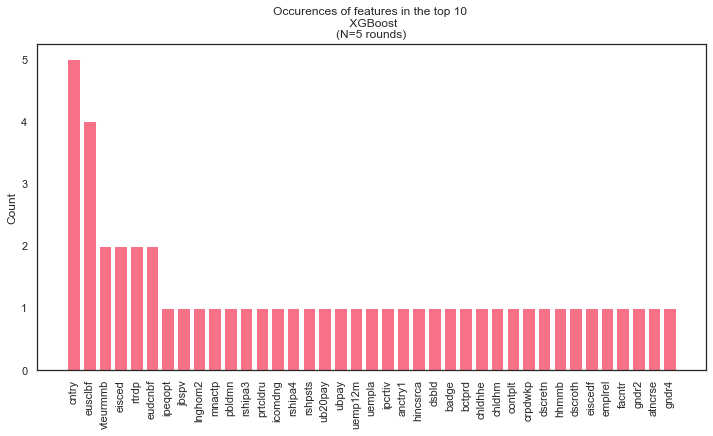

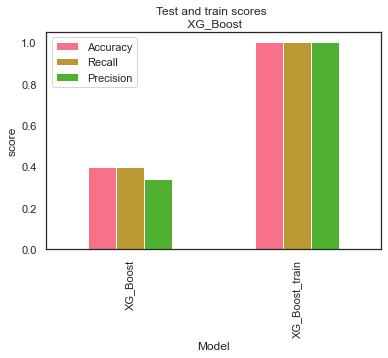

In [116]:
NL_RU_score_dflt, NL_RU_feat_dflt = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, 0.1, empty_dict) 

In [117]:
NL_RU_score_dflt #not very accurate either.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.39695,0.395432,0.341315,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.00000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


648 648


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.52      1.00      0.68       408
        Prob       0.00      0.00      0.00       293
    Prob not       0.00      0.00      0.00        38
     Def not       0.00      0.00      0.00        48

    accuracy                           0.52       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.27      0.52      0.35       787
 

620 620


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.49      1.00      0.66       384
        Prob       0.00      0.00      0.00       303
    Prob not       0.00      0.00      0.00        45
     Def not       0.00      0.00      0.00        55

    accuracy                           0.49       787
   macro avg       0.12      0.25      0.16       787
weighted avg       0.24      0.49      0.32       787
 

648 648


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.51      1.00      0.68       402
        Prob       0.00      0.00      0.00       302
    Prob not       0.00      0.00      0.00        38
     Def not       0.00      0.00      0.00        45

    accuracy                           0.51       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.26      0.51      0.35       787
 

616 616


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.53      1.00      0.69       414
        Prob       0.00      0.00      0.00       273
    Prob not       0.00      0.00      0.00        46
     Def not       0.00      0.00      0.00        54

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 

684 684


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.53      1.00      0.69       415
        Prob       0.00      0.00      0.00       294
    Prob not       0.00      0.00      0.00        29
     Def not       0.00      0.00      0.00        49

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 



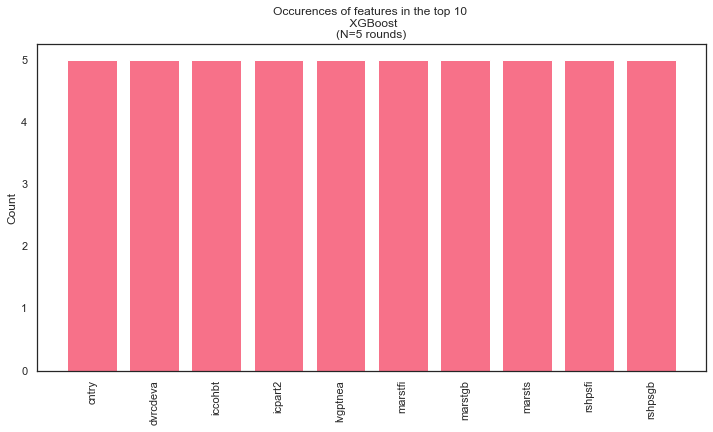

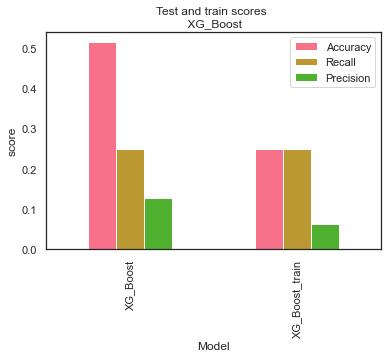

In [118]:
NL_RU_score, NL_RU_feat = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, top_lr, top_params) 

In [119]:
NL_RU_score #not very accurate either. Compared with all countries: not an improvement. 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.514104,0.25,0.128526,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


168 168
Random state: 5 
               precision    recall  f1-score   support

         Def       0.69      0.26      0.37       566
        Prob       0.36      0.37      0.36       297
    Prob not       0.01      0.07      0.02        30
     Def not       0.01      0.22      0.02         9

    accuracy                           0.29       902
   macro avg       0.27      0.23      0.19       902
weighted avg       0.55      0.29      0.36       902
 

160 160
Random state: 12 
               precision    recall  f1-score   support

         Def       0.70      0.32      0.44       577
        Prob       0.33      0.25      0.28       288
    Prob not       0.05      0.31      0.08        26
     Def not       0.02      0.36      0.03        11

    accuracy                           0.30       902
   macro avg       0.27      0.31      0.21       902
weighted avg       0.56      0.30      0.38       902
 

168 168
Random state: 19 
               precision    recall  f1-score   

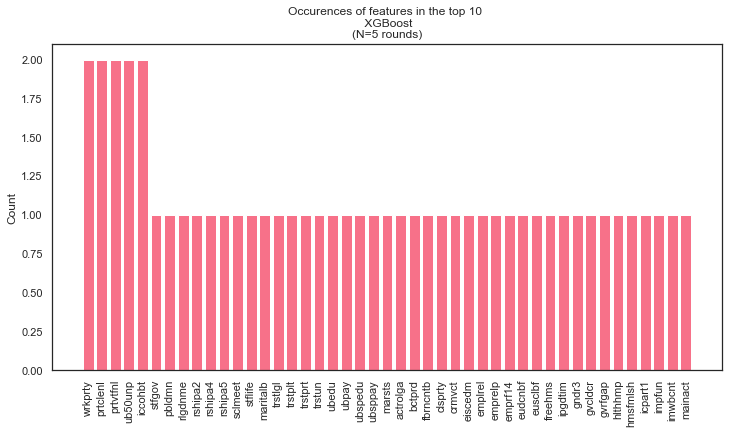

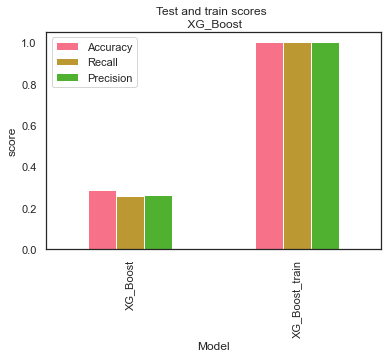

In [120]:
NL_DE_score_dflt, NL_DE_feat_dflt = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, 0.1, empty_dict)

In [121]:
NL_DE_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.287805,0.255942,0.261519,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


168 168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.63      1.00      0.77       566
        Prob       0.00      0.00      0.00       297
    Prob not       0.00      0.00      0.00        30
     Def not       0.00      0.00      0.00         9

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.39      0.63      0.48       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.64      1.00      0.78       577
        Prob       0.00      0.00      0.00       288
    Prob not       0.00      0.00      0.00        26
     Def not       0.00      0.00      0.00        11

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

168 168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.64      1.00      0.78       578
        Prob       0.00      0.00      0.00       288
    Prob not       0.00      0.00      0.00        27
     Def not       0.00      0.00      0.00         9

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.63      1.00      0.77       570
        Prob       0.00      0.00      0.00       282
    Prob not       0.00      0.00      0.00        39
     Def not       0.00      0.00      0.00        11

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.40      0.63      0.49       902
 

156 156


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.65      1.00      0.79       586
        Prob       0.00      0.00      0.00       273
    Prob not       0.00      0.00      0.00        31
     Def not       0.00      0.00      0.00        12

    accuracy                           0.65       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.42      0.65      0.51       902
 



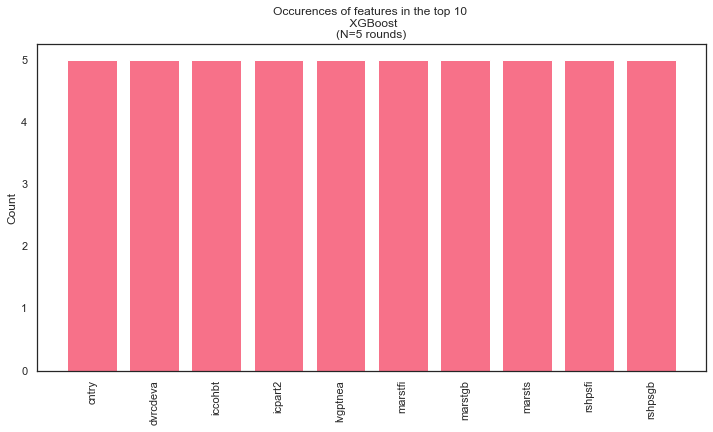

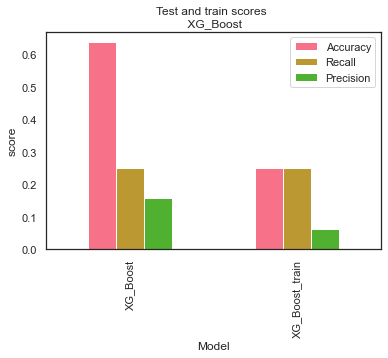

In [122]:
NL_DE_score, NL_DE_feat = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, top_lr, top_params) 

unusable: does not predict all classes

364 364
Random state: 5 
               precision    recall  f1-score   support

         Def       0.73      0.35      0.47      1334
        Prob       0.34      0.30      0.32       637
    Prob not       0.04      0.24      0.07        67
     Def not       0.01      0.25      0.02        16

    accuracy                           0.33      2054
   macro avg       0.28      0.28      0.22      2054
weighted avg       0.58      0.33      0.41      2054
 

356 356
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.42      0.53      1261
        Prob       0.39      0.29      0.33       699
    Prob not       0.05      0.28      0.09        76
     Def not       0.01      0.33      0.03        18

    accuracy                           0.37      2054
   macro avg       0.30      0.33      0.25      2054
weighted avg       0.58      0.37      0.44      2054
 

360 360
Random state: 19 
               precision    recall  f1-score   

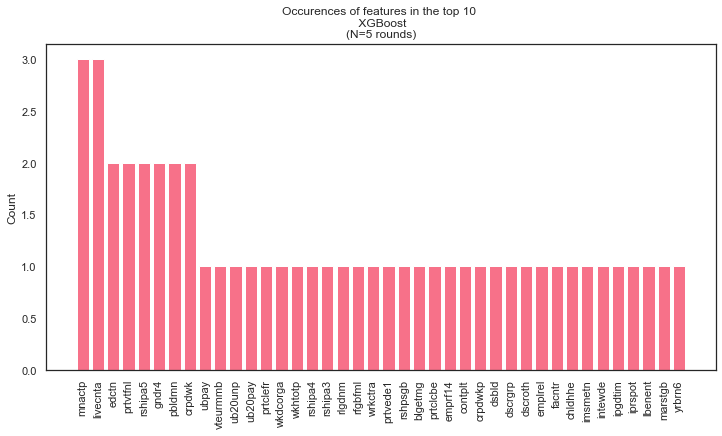

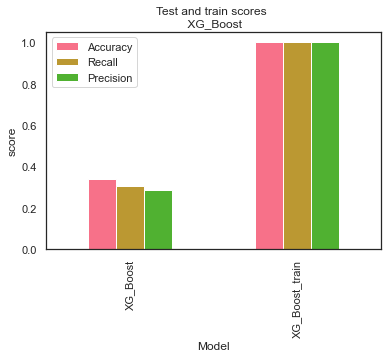

In [123]:
cntry5_score_dflt, cntry5_feat_dflt = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, 0.1, empty_dict)

In [124]:
cntry5_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.340214,0.305203,0.285209,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


364 364


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.65      1.00      0.79      1334
        Prob       0.00      0.00      0.00       637
    Prob not       0.00      0.00      0.00        67
     Def not       0.00      0.00      0.00        16

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.61      1.00      0.76      1261
        Prob       0.00      0.00      0.00       699
    Prob not       0.00      0.00      0.00        76
     Def not       0.00      0.00      0.00        18

    accuracy                           0.61      2054
   macro avg       0.15      0.25      0.19      2054
weighted avg       0.38      0.61      0.47      2054
 

360 360


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.63      1.00      0.77      1295
        Prob       0.00      0.00      0.00       672
    Prob not       0.00      0.00      0.00        70
     Def not       0.00      0.00      0.00        17

    accuracy                           0.63      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.40      0.63      0.49      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.62      1.00      0.77      1283
        Prob       0.00      0.00      0.00       678
    Prob not       0.00      0.00      0.00        75
     Def not       0.00      0.00      0.00        18

    accuracy                           0.62      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.39      0.62      0.48      2054
 

336 336


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.65      1.00      0.79      1338
        Prob       0.00      0.00      0.00       620
    Prob not       0.00      0.00      0.00        73
     Def not       0.00      0.00      0.00        23

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 



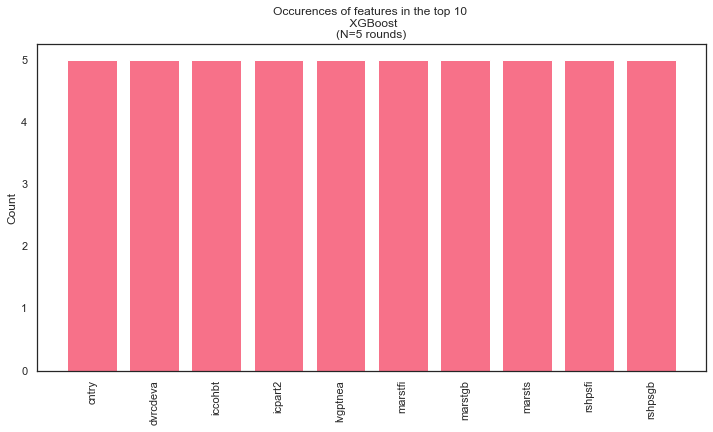

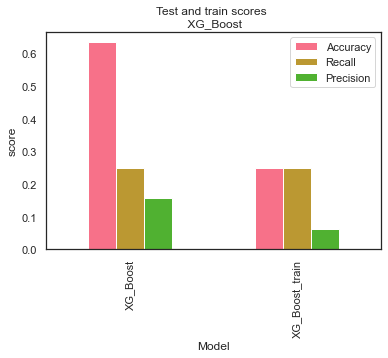

In [125]:
cntry5_score, cntry5_feat = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, top_lr, top_params) 

In [126]:
cntry5_score #deterioration

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.633982,0.25,0.158496,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


#### use y_worried
Yet another idea is that maybe 'do you think climate change is real' is not discriminatory enough. Maybe more difference lies in whether someone is worried about it or not. I'll therefore try if the model could explain this y better.

WOULD HAVE TO BE TUNED COMPLETELY!! SKIP FOR NOW!

# Drop features by importance
Maybe there are just too many features for the model to choose from. Below, features are dropped one by one, hoping the accuracy will increase/decrease parabola-wise.

Use top_params and top_lr (learning rate)
Fastest to get the code out of the function for this one.

In [127]:
#lists for performances on test set
recall_XGBoost = []
accuracy_XGBoost = []
precision_XGBoost = [] 

#lists for performances on test set
recall_XGBoost_train = []
accuracy_XGBoost_train = []
precision_XGBoost_train = []


#TRAIN_TEST_SPLIT
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 5) #split data

#UNDERSAMPLE
undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
X_train = X_train_under
y_train = y_train_under

#ASSEMBLE & FIT MODEL
model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **top_params,
                          learning_rate = top_lr, use_label_encoder = False)
result = model.fit(X_train, y_train)

#PREDICT Y
y_pred = result.predict(X_test)
y_pred_train = result.predict(X_train) 

#accuracy, recall and precision on test set
accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))

#accuracy, recall and precision on train set
accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#feature importances 
feature_names = [f'{X_train.columns[j]}' for j in range(X_train.shape[1])] #get the names

importances = model.feature_importances_ #array of importances of all features. no indices or whatever, just importances
importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df       
importance_df["feature"] = X_train.columns
print(importance_df.head())
importance_df = importance_df.sort_values(by="importance", ascending=True).reset_index()
importance_df.head()


   index  importance   feature
0      0    0.064566     cntry
1      1    0.000000    nwspol
2      2    0.000000  netusoft
3      3    0.000000   netustm
4      4    0.000000   ppltrst


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,level_0,index,importance,feature
0,170,170,0.0,ub20pay
1,230,230,0.0,iccohbt
2,229,229,0.0,icpart2
3,228,228,0.0,dvrcdeva
4,227,227,0.0,lvgptnea


In [128]:
#store the dataframe in csv, as I might need it. 
importance_df.to_csv('./data/importance_df_dropping.csv', index=False) #cancel out to keep it constant over runs!

In [129]:
#import the csv again if needed
importance_df = pd.read_csv('./data/importance_df_dropping.csv')

In [130]:
#again use top_params and top_lr
#keep cutting off features, until there are only 10 left:
for i in range(len(X_noclimate.columns)-10): 
    print("I'm working on round", (i+1))
    to_drop = list(importance_df.loc[0:i,"feature"]) #list with features to drop, starting at the lowest importances
    X_dropping = X_noclimate.drop(to_drop, axis =1)
    print(len(X_dropping.columns)) #check if the columns really get dropped
    
    #TRAIN_TEST_SPLIT
    X_train, X_test, y_train, y_test = train_test_split(X_dropping, y_zero, test_size=0.2, shuffle=True, random_state = 5) #split data

    #UNDERSAMPLE
    undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
    X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
    X_train = X_train_under
    y_train = y_train_under

    #ASSEMBLE & FIT MODEL
    model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **top_params,
                          learning_rate = top_lr, use_label_encoder = False)
    result = model.fit(X_train, y_train)

    #PREDICT Y
    y_pred = result.predict(X_test)
    y_pred_train = result.predict(X_train) 

    #accuracy, recall and precision on test set
    accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
    recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
    precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))

    #accuracy, recall and precision on train set
    accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
    recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
    precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))


I'm working on round 1
341


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 2
340


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 3
339


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 4
338


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 5
337


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 6
336


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 7
335


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 8
334


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 9
333


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 10
332


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 11
331


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 12
330


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 13
329


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 14
328


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 15
327


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 16
326


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 17
325


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 18
324


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 19
323


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 20
322


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 21
321


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 22
320


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 23
319


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 24
318


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 25
317


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 26
316


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 27
315


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 28
314


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 29
313


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 30
312


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 31
311


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 32
310


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 33
309


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 34
308


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 35
307


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 36
306


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 37
305


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 38
304


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 39
303


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 40
302


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 41
301


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 42
300


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 43
299


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 44
298


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 45
297


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 46
296


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 47
295


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 48
294


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 49
293


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 50
292


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 51
291


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 52
290


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 53
289


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 54
288


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 55
287


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 56
286


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 57
285


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 58
284


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 59
283


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 60
282


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 61
281


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 62
280


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 63
279


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 64
278


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 65
277


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 66
276


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 67
275


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 68
274


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 69
273


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 70
272


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 71
271


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 72
270


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 73
269


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 74
268


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 75
267


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 76
266


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 77
265


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 78
264


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 79
263


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 80
262


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 81
261


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 82
260


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 83
259


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 84
258


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 85
257


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 86
256


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 87
255


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 88
254


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 89
253


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 90
252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 91
251


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 92
250


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 93
249


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 94
248


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 95
247


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 96
246


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 97
245


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 98
244


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 99
243


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 100
242


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 101
241


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 102
240


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 103
239


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 104
238


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 105
237


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 106
236


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 107
235


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 108
234


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 109
233


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 110
232


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 111
231


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 112
230


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 113
229


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 114
228


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 115
227


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 116
226


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 117
225


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 118
224


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 119
223


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 120
222


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 121
221


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 122
220


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 123
219


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 124
218


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 125
217


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 126
216


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 127
215


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 128
214


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 129
213


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 130
212


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 131
211


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 132
210


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 133
209


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 134
208


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 135
207


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 136
206


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 137
205


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 138
204


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 139
203


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 140
202


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 141
201


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 142
200


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 143
199


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 144
198


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 145
197


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 146
196


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 147
195


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 148
194


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 149
193


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 150
192


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 151
191


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 152
190


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 153
189


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 154
188


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 155
187


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 156
186


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 157
185


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 158
184


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 159
183


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 160
182


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 161
181


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 162
180


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 163
179


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 164
178


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 165
177


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 166
176


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 167
175


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 168
174


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 169
173


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 170
172


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 171
171


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 172
170


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 173
169


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 174
168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 175
167


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 176
166


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 177
165


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 178
164


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 179
163


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 180
162


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 181
161


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 182
160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 183
159


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 184
158


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 185
157


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 186
156


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 187
155


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 188
154


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 189
153


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 190
152


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 191
151


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 192
150


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 193
149


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 194
148


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 195
147


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 196
146


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 197
145


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 198
144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 199
143


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 200
142


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 201
141


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 202
140


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 203
139


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 204
138


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 205
137


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 206
136


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 207
135


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 208
134


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 209
133


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 210
132


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 211
131


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 212
130


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 213
129


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 214
128


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 215
127


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 216
126


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 217
125


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 218
124


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 219
123


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 220
122


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 221
121


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 222
120


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 223
119


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 224
118


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 225
117


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 226
116


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 227
115


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 228
114


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 229
113


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 230
112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 231
111


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 232
110


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 233
109


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 234
108


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 235
107


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 236
106


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 237
105


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 238
104


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 239
103


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 240
102


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 241
101


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 242
100


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 243
99


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 244
98


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 245
97


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 246
96


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 247
95


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 248
94


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 249
93


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 250
92


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 251
91


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 252
90


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 253
89


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 254
88


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 255
87


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 256
86


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 257
85


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 258
84


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 259
83


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 260
82


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 261
81


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 262
80


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 263
79


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 264
78


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 265
77


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 266
76


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 267
75


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 268
74


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 269
73


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 270
72


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 271
71


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 272
70


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 273
69


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 274
68


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 275
67


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 276
66


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 277
65


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 278
64


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 279
63


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 280
62


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 281
61


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 282
60


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 283
59


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 284
58


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 285
57


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 286
56


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 287
55


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 288
54


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 289
53


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 290
52


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 291
51


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 292
50


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 293
49


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 294
48


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 295
47


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 296
46


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 297
45


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 298
44


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 299
43


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 300
42


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 301
41


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 302
40


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 303
39


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 304
38


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 305
37


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 306
36


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 307
35


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 308
34


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 309
33


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 310
32


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 311
31


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 312
30


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 313
29


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 314
28


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 315
27


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 316
26


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 317
25


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 318
24


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 319
23


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 320
22


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 321
21


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 322
20


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 323
19


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 324
18


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 325
17


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 326
16


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 327
15


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 328
14


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 329
13


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 330
12


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 331
11


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 332
10


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


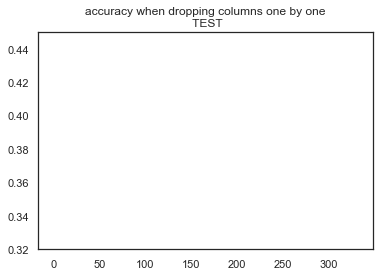

In [131]:
plt.scatter(y=accuracy_XGBoost, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one\n TEST")
plt.ylim(0.32,0.45);

In [132]:
max_val = np.max(accuracy_XGBoost)
print(max_val) #0.438

#find out at which index max_val is
for i in range(len(accuracy_XGBoost)):
    if accuracy_XGBoost[i] == max_val:
        print(i) #89 

0.47285747285747287
249


In [133]:
# top 5
top_5 = sorted(accuracy_XGBoost)[(len(accuracy_XGBoost)-5):(len(accuracy_XGBoost)+1)]
print(top_5)

#find out at which index max_val is
for i in range(len(accuracy_XGBoost)):
    if accuracy_XGBoost[i] in top_5:
        print("\nNumber of columns dropped:", i, "\nAccuracy:", accuracy_XGBoost[i])

[0.4718179718179718, 0.4718179718179718, 0.4723954723954724, 0.4725109725109725, 0.47285747285747287]

Number of columns dropped: 58 
Accuracy: 0.4718179718179718

Number of columns dropped: 129 
Accuracy: 0.4725109725109725

Number of columns dropped: 164 
Accuracy: 0.4718179718179718

Number of columns dropped: 175 
Accuracy: 0.4718179718179718

Number of columns dropped: 188 
Accuracy: 0.4723954723954724

Number of columns dropped: 249 
Accuracy: 0.47285747285747287


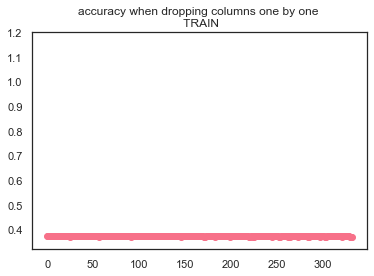

In [134]:
plt.scatter(y=accuracy_XGBoost_train, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one \n TRAIN")
plt.ylim(0.32,1.2);

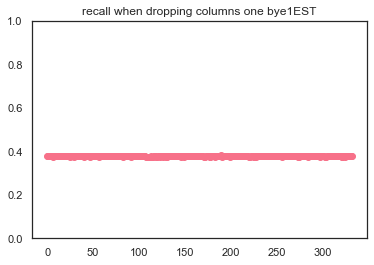

In [135]:
plt.scatter(y=recall_XGBoost, x=range(len(recall_XGBoost)))
plt.title("recall when dropping columns one bye1EST")
plt.ylim(0,1);

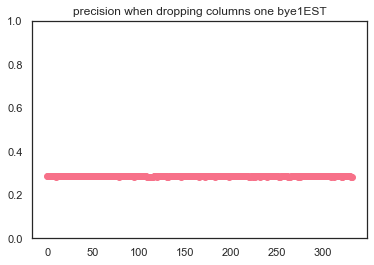

In [136]:
plt.scatter(y=precision_XGBoost, x=range(len(precision_XGBoost)))
plt.title("precision when dropping columns one bye1EST")
plt.ylim(0,1);

# Use X_some
X_some are those features that have correlations >0.05 to the target-column.<br> Run with 'default values'(lr = 0.1. hyperparams: empty dict) and earlier assigned top_lr and top_params.

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.70      0.46      0.56      4985
        Prob       0.42      0.31      0.36      3091
    Prob not       0.07      0.31      0.12       390
     Def not       0.07      0.50      0.12       192

    accuracy                           0.40      8658
   macro avg       0.31      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.70      0.44      0.54      4967
        Prob       0.42      0.35      0.38      3110
    Prob not       0.08      0.34      0.13       395
     Def not       0.07      0.48      0.12       186

    accuracy                           0.40      8658
   macro avg       0.32      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

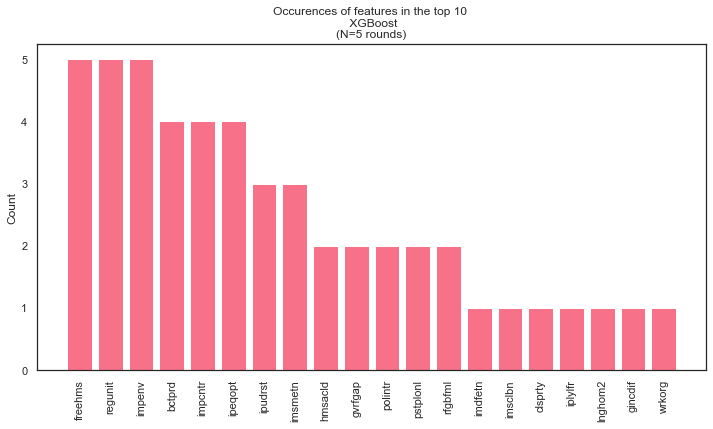

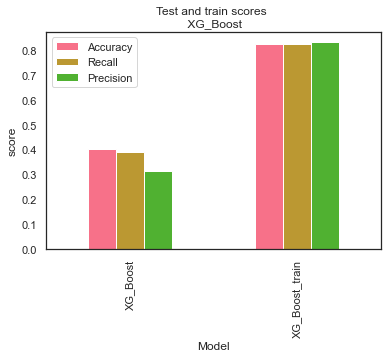

In [137]:
score_some, feat_some = XG_Boost(X_some, y_zero, random_states, True, 0.1, empty_dict)

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.62      0.75      0.68      4985
        Prob       0.43      0.24      0.31      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.09      0.46      0.15       192

    accuracy                           0.52      8658
   macro avg       0.29      0.36      0.28      8658
weighted avg       0.51      0.52      0.50      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.64      0.60      0.62      4967
        Prob       0.42      0.41      0.42      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.08      0.39      0.13       186

    accuracy                           0.50      8658
   macro avg       0.28      0.35      0.29      8658
weighted avg       0.52      0.50      0.51      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.64      0.67      0.65      4903
        Prob       0.45      0.37      0.41      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.08      0.36      0.14       200

    accuracy                           0.52      8658
   macro avg       0.29      0.35      0.30      8658
weighted avg       0.53      0.52      0.52      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.61      0.75      0.67      4901
        Prob       0.44      0.25      0.32      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.09      0.35      0.15       232

    accuracy                           0.52      8658
   macro avg       0.29      0.34      0.29      8658
weighted avg       0.51      0.52      0.50      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.66      0.56      0.60      4959
        Prob       0.43      0.49      0.45      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.07      0.38      0.12       165

    accuracy                           0.50      8658
   macro avg       0.29      0.36      0.29      8658
weighted avg       0.53      0.50      0.51      8658
 



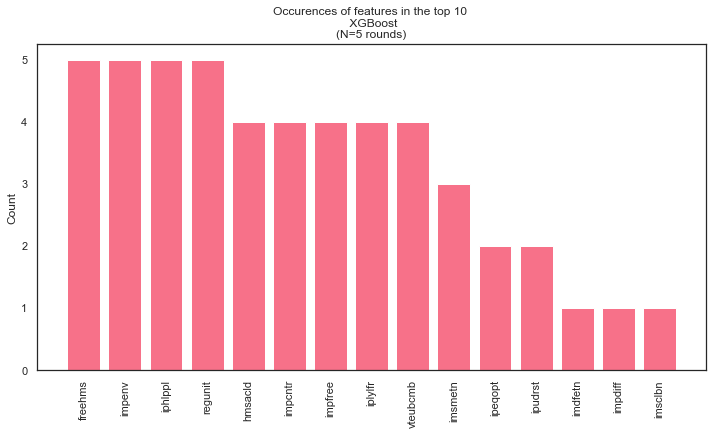

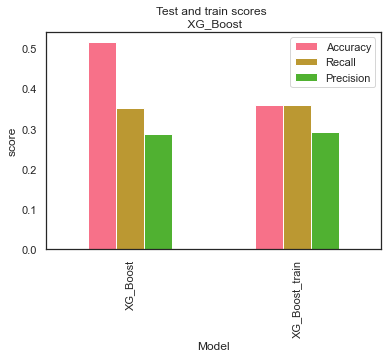

In [138]:
score_some_top, feat_some_top = XG_Boost(X_some, y_zero, random_states, True, top_lr, top_params)

In [139]:
score_some #test-score not improved compared to X_noclimate

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.404158,0.390214,0.315256,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.824435,0.824435,0.830388,"[5, 12, 19, 26, 33]"


In [140]:
score_some_top #test-score not improved compared to X_noclimate

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.515315,0.351184,0.287500,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.359084,0.359084,0.291866,"[5, 12, 19, 26, 33]"


Does not seem extremely viable. Try yet a different approach..

# Use y_trio

7074 7074
Random state: 5 
               precision    recall  f1-score   support

         Def       0.73      0.56      0.63      4985
        Prob       0.47      0.40      0.43      3091
Prob/Def not       0.15      0.56      0.23       582

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 

7077 7077
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.55      0.63      4967
        Prob       0.47      0.41      0.43      3110
Prob/Def not       0.14      0.53      0.22       581

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 

7083 7083
Random state: 19 
               precision    recall  f1-score   support

         Def       0.71      0.54      0.62      4903
        Prob       0.48      0.43      

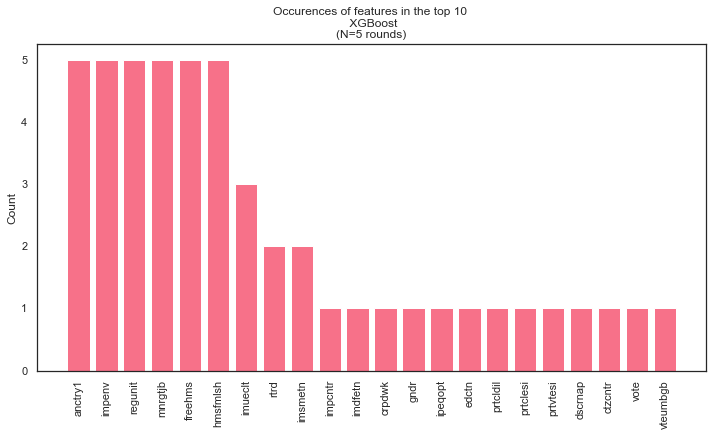

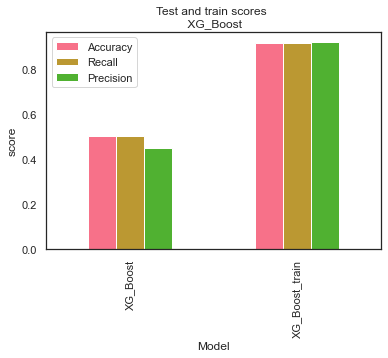

In [143]:
score_trio, feat_trio = XG_Boost_trio(X_noclimate, y_trio, random_states, True, 0.1, empty_dict)

In [144]:
score_trio #score improved!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.500947,0.502634,0.447462,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.917352,0.917352,0.918633,"[5, 12, 19, 26, 33]"


In [145]:
get_fullname(feat_trio, metadata).sort_values(by="importance", ascending=False) #check out the features 

,indices,importance,shorthand,full_text
0,316,0.010475,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
5,88,0.010116,freehms,Gays and lesbians free to live life as they wish
21,185,0.009812,vteumbgb,"Would vote for [country] to remain member of European Union or leave, United Kingdom"
14,87,0.009484,mnrgtjb,Men should have more right to job than women when jobs are scarce
18,340,0.008557,regunit,Regional unit
7,89,0.008158,hmsfmlsh,Ashamed if close family member gay or lesbian
10,336,0.008045,impenv,Important to care for nature and environment
17,45,0.007427,prtvtesi,"Party voted for in last national election, Slovenia"
15,67,0.007321,prtcldil,"Which party feel closer to, Israel"
13,320,0.007313,ipeqopt,Important that people are treated equally and have equal opportunities


## tune trio learning rates

In [146]:
learning_rates = np.arange(0, 0.04, 0.001) #previous had stepsize 0.0001, for speed-sake a little bigger this time

7080 7080


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Learning rate: 0.0 
                 precision    recall  f1-score   support

           Def       0.58      1.00      0.73      5002
          Prob       0.00      0.00      0.00      3076
Def + Prob not       0.00      0.00      0.00       580

      accuracy                           0.58      8658
     macro avg       0.19      0.33      0.24      8658
  weighted avg       0.33      0.58      0.42      8658
 

7080 7080
Learning rate: 0.001 
                 precision    recall  f1-score   support

           Def       0.70      0.52      0.59      5002
          Prob       0.43      0.37      0.40      3076
Def + Prob not       0.13      0.50      0.20       580

      accuracy                           0.47      8658
     macro avg       0.42      0.46      0.40      8658
  weighted avg       0.56      0.47      0.50      8658
 

7080 7080
Learning rate: 0.002 
                 precision    recall  f1-score   support

           Def       0.70      0.53      0.61      5002
      

7080 7080
Learning rate: 0.017 
                 precision    recall  f1-score   support

           Def       0.71      0.56      0.63      5002
          Prob       0.45      0.36      0.40      3076
Def + Prob not       0.14      0.54      0.22       580

      accuracy                           0.49      8658
     macro avg       0.43      0.49      0.42      8658
  weighted avg       0.58      0.49      0.52      8658
 

7080 7080
Learning rate: 0.018000000000000002 
                 precision    recall  f1-score   support

           Def       0.72      0.56      0.63      5002
          Prob       0.45      0.35      0.40      3076
Def + Prob not       0.14      0.56      0.22       580

      accuracy                           0.49      8658
     macro avg       0.44      0.49      0.42      8658
  weighted avg       0.58      0.49      0.52      8658
 

7080 7080
Learning rate: 0.019 
                 precision    recall  f1-score   support

           Def       0.72      0.57

7080 7080
Learning rate: 0.034 
                 precision    recall  f1-score   support

           Def       0.73      0.56      0.64      5002
          Prob       0.47      0.39      0.43      3076
Def + Prob not       0.15      0.56      0.23       580

      accuracy                           0.50      8658
     macro avg       0.45      0.50      0.43      8658
  weighted avg       0.60      0.50      0.53      8658
 

7080 7080
Learning rate: 0.035 
                 precision    recall  f1-score   support

           Def       0.73      0.57      0.64      5002
          Prob       0.46      0.39      0.42      3076
Def + Prob not       0.15      0.56      0.23       580

      accuracy                           0.50      8658
     macro avg       0.45      0.51      0.43      8658
  weighted avg       0.60      0.50      0.53      8658
 

7080 7080
Learning rate: 0.036000000000000004 
                 precision    recall  f1-score   support

           Def       0.73      0.56

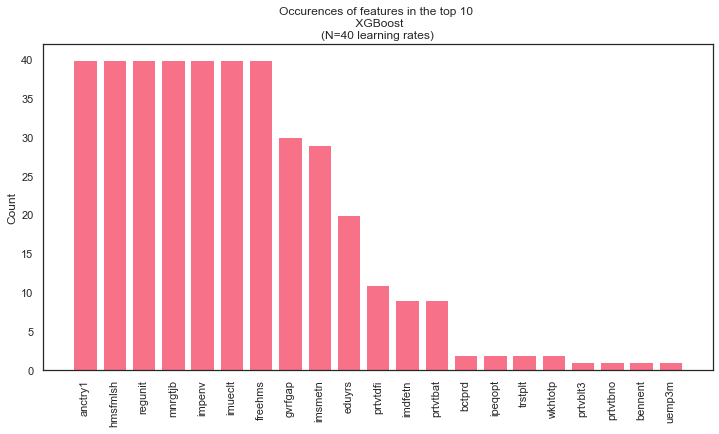

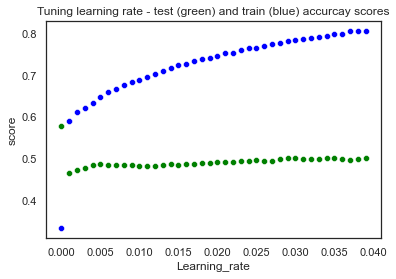

In [147]:
score_trio_lr, feat_trio_lr = tune_learning_trio(X_noclimate, y_trio,7, True, learning_rates, empty_dict)

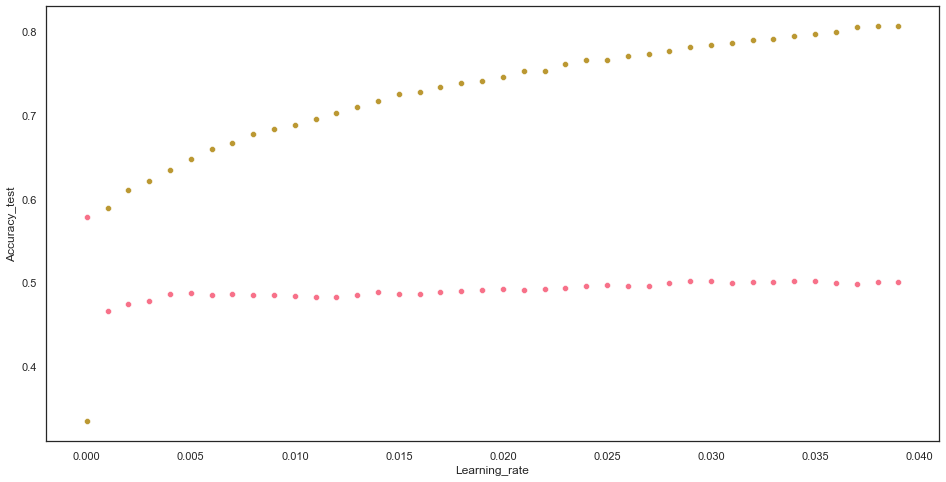

In [148]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [149]:
score_trio_lr["distance"] = score_trio_lr.Accuracy_train - score_trio_lr.Accuracy_test

In [150]:
score_trio_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores: not improved

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.000,-0.244398
34,0.501964,0.504387,0.446942,0.794209,0.794209,0.795827,0.034,0.292246
35,0.501848,0.505177,0.446478,0.797599,0.797599,0.799538,0.035,0.295751
29,0.501040,0.501204,0.445375,0.781780,0.781780,0.782949,0.029,0.280740
30,0.501040,0.502804,0.445796,0.783475,0.783475,0.784862,0.030,0.282435
39,0.500693,0.504761,0.445822,0.806497,0.806497,0.808202,0.039,0.305804
33,0.500462,0.500738,0.444871,0.791384,0.791384,0.793225,0.033,0.290922
32,0.500462,0.501705,0.445385,0.789972,0.789972,0.791469,0.032,0.289510
38,0.500231,0.503437,0.445562,0.806356,0.806356,0.808178,0.038,0.306125
36,0.499653,0.503479,0.444921,0.799576,0.799576,0.801368,0.036,0.299923


In [151]:
score_trio_lr.sort_values(by="distance", ascending=True).head(20) #smallest distance: not score within 0.50's 

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.000,-0.244398
1,0.465119,0.462293,0.417082,0.589266,0.589266,0.588679,0.001,0.124147
2,0.474012,0.468865,0.423268,0.610734,0.610734,0.609847,0.002,0.136722
3,0.478055,0.469931,0.424276,0.621186,0.621186,0.620353,0.003,0.143131
4,0.485331,0.475953,0.429596,0.634605,0.634605,0.634015,0.004,0.149273
5,0.486717,0.478751,0.431025,0.647599,0.647599,0.647625,0.005,0.160881
6,0.484292,0.475759,0.428529,0.659181,0.659181,0.659861,0.006,0.174889
7,0.485562,0.478440,0.429696,0.666667,0.666667,0.667435,0.007,0.181104
8,0.484523,0.476623,0.429178,0.677401,0.677401,0.678511,0.008,0.192878
9,0.484176,0.476006,0.429362,0.683898,0.683898,0.685025,0.009,0.199722


In [152]:
#same pattern as in the original four-class: all are overtrained. try again with smaller step for values between 0 and 0.01

In [153]:
learning_rates = np.arange(0, 0.007, 0.0001) 

7080 7080


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Learning rate: 0.0 
                 precision    recall  f1-score   support

           Def       0.58      1.00      0.73      5002
          Prob       0.00      0.00      0.00      3076
Def + Prob not       0.00      0.00      0.00       580

      accuracy                           0.58      8658
     macro avg       0.19      0.33      0.24      8658
  weighted avg       0.33      0.58      0.42      8658
 

7080 7080
Learning rate: 0.0001 
                 precision    recall  f1-score   support

           Def       0.70      0.50      0.58      5002
          Prob       0.43      0.39      0.41      3076
Def + Prob not       0.13      0.50      0.20       580

      accuracy                           0.46      8658
     macro avg       0.42      0.46      0.40      8658
  weighted avg       0.56      0.46      0.49      8658
 

7080 7080
Learning rate: 0.0002 
                 precision    recall  f1-score   support

           Def       0.70      0.50      0.58      5002
    

7080 7080
Learning rate: 0.0017000000000000001 
                 precision    recall  f1-score   support

           Def       0.70      0.53      0.60      5002
          Prob       0.43      0.37      0.40      3076
Def + Prob not       0.13      0.49      0.20       580

      accuracy                           0.47      8658
     macro avg       0.42      0.46      0.40      8658
  weighted avg       0.57      0.47      0.50      8658
 

7080 7080
Learning rate: 0.0018000000000000002 
                 precision    recall  f1-score   support

           Def       0.70      0.53      0.60      5002
          Prob       0.43      0.37      0.40      3076
Def + Prob not       0.13      0.49      0.20       580

      accuracy                           0.47      8658
     macro avg       0.42      0.46      0.40      8658
  weighted avg       0.57      0.47      0.50      8658
 

7080 7080
Learning rate: 0.0019 
                 precision    recall  f1-score   support

           Def   

7080 7080
Learning rate: 0.0034000000000000002 
                 precision    recall  f1-score   support

           Def       0.71      0.55      0.62      5002
          Prob       0.44      0.37      0.40      3076
Def + Prob not       0.13      0.49      0.21       580

      accuracy                           0.48      8658
     macro avg       0.43      0.47      0.41      8658
  weighted avg       0.57      0.48      0.51      8658
 

7080 7080
Learning rate: 0.0035 
                 precision    recall  f1-score   support

           Def       0.71      0.55      0.62      5002
          Prob       0.44      0.37      0.40      3076
Def + Prob not       0.13      0.50      0.21       580

      accuracy                           0.48      8658
     macro avg       0.43      0.47      0.41      8658
  weighted avg       0.57      0.48      0.51      8658
 

7080 7080
Learning rate: 0.0036000000000000003 
                 precision    recall  f1-score   support

           Def   

7080 7080
Learning rate: 0.0051 
                 precision    recall  f1-score   support

           Def       0.71      0.56      0.63      5002
          Prob       0.45      0.36      0.40      3076
Def + Prob not       0.13      0.51      0.21       580

      accuracy                           0.49      8658
     macro avg       0.43      0.48      0.41      8658
  weighted avg       0.58      0.49      0.52      8658
 

7080 7080
Learning rate: 0.005200000000000001 
                 precision    recall  f1-score   support

           Def       0.71      0.56      0.63      5002
          Prob       0.45      0.36      0.40      3076
Def + Prob not       0.13      0.51      0.21       580

      accuracy                           0.49      8658
     macro avg       0.43      0.48      0.41      8658
  weighted avg       0.58      0.49      0.52      8658
 

7080 7080
Learning rate: 0.0053 
                 precision    recall  f1-score   support

           Def       0.71      0.

7080 7080
Learning rate: 0.0068000000000000005 
                 precision    recall  f1-score   support

           Def       0.71      0.56      0.63      5002
          Prob       0.45      0.36      0.40      3076
Def + Prob not       0.13      0.51      0.21       580

      accuracy                           0.49      8658
     macro avg       0.43      0.48      0.41      8658
  weighted avg       0.58      0.49      0.52      8658
 

7080 7080
Learning rate: 0.006900000000000001 
                 precision    recall  f1-score   support

           Def       0.71      0.56      0.63      5002
          Prob       0.45      0.36      0.40      3076
Def + Prob not       0.13      0.52      0.21       580

      accuracy                           0.49      8658
     macro avg       0.43      0.48      0.41      8658
  weighted avg       0.58      0.49      0.52      8658
 



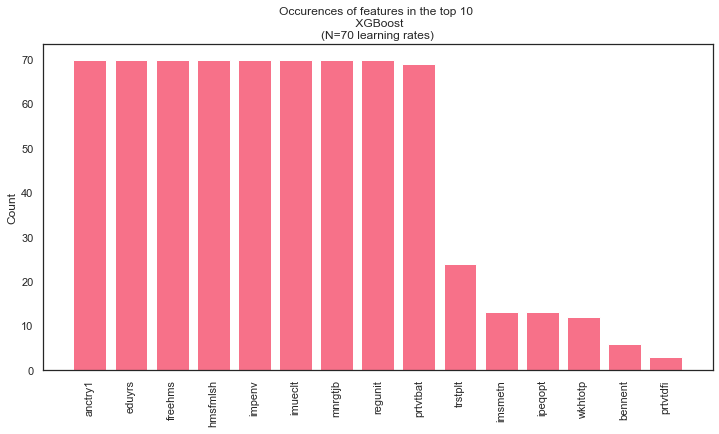

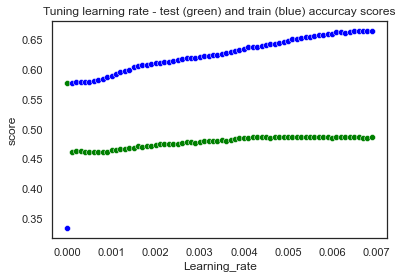

In [154]:
score_trio_lr2, feat_trio_lr2 = tune_learning_trio(X_noclimate, y_trio,7, True, learning_rates, empty_dict)

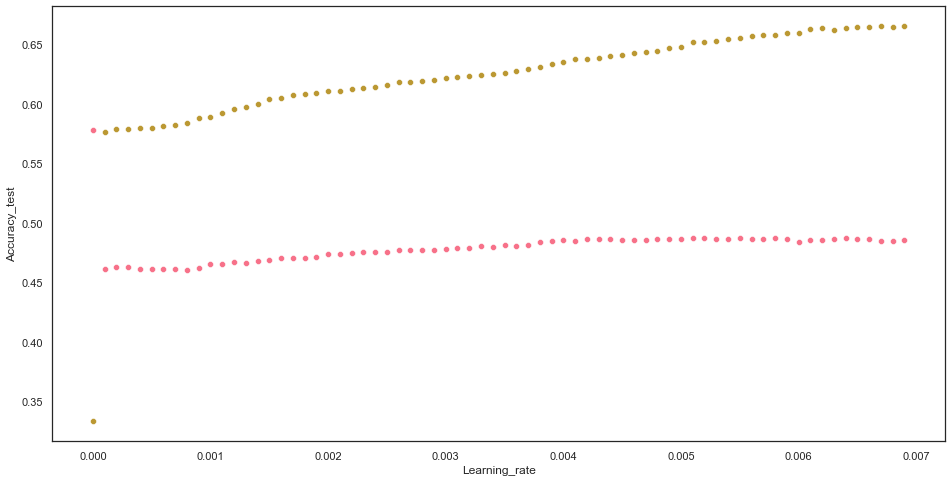

In [155]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_trio_lr2, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_trio_lr2, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [156]:
score_trio_lr2["distance"] = score_trio_lr2.Accuracy_train - score_trio_lr2.Accuracy_test

In [157]:
score_trio_lr2.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores: all lower than 0.50

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.0000,-0.244398
51,0.487526,0.478201,0.431295,0.651412,0.651412,0.651529,0.0051,0.163886
52,0.487410,0.478900,0.431248,0.651554,0.651554,0.651741,0.0052,0.164143
55,0.487179,0.477334,0.430574,0.654802,0.654802,0.655250,0.0055,0.167623
64,0.487064,0.478325,0.430530,0.663559,0.663559,0.664231,0.0064,0.176495
58,0.486948,0.477709,0.430510,0.657910,0.657910,0.658486,0.0058,0.170961
66,0.486833,0.478575,0.430560,0.663983,0.663983,0.664660,0.0066,0.177150
59,0.486833,0.477725,0.430637,0.659605,0.659605,0.660245,0.0059,0.172772
57,0.486833,0.477983,0.429922,0.657345,0.657345,0.657895,0.0057,0.170512
54,0.486717,0.478633,0.430758,0.654379,0.654379,0.654730,0.0054,0.167661


In [158]:
top_score_trio = score_trio_lr.iloc[34,:] #will choose this one: not too much loss of accuracy.
top_score_trio = top_score_trio.to_dict()

#safety hardcoding ;)

{'Accuracy_test': 0.5019635019635019,
 'Recall_test': 0.5043874700093806,
 'Precision_test': 0.4469422352822627,
 'Accuracy_train': 0.7942090395480226,
 'Recall_train': 0.7942090395480226,
 'Precision_train': 0.795827137272248,
 'Learning_rate': 0.034,
 'distance': 0.3986639507825948}

## tune hyperparameters

In [159]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_trio, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [160]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:33,  1.05trial/s, best loss: -0.5273735273735274]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  2%|▉                                              | 2/100 [00:01<01:23,  1.17trial/s, best loss: -0.5273735273735274]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5677985677985677                                                                                                     
  3%|█▍                                             | 3/100 [00:03<02:01,  1.25s/trial, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:04<01:41,  1.06s/trial, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
  5%|██▎                                            | 5/100 [00:05<01:36,  1.02s/trial, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  6%|██▊                                            | 6/100 [00:05<01:21,  1.15trial/s, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:06<01:12,  1.29trial/s, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:06<01:04,  1.42trial/s, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:07<01:00,  1.51trial/s, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:07<00:55,  1.62trial/s, best loss: -0.5677985677985677]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:08<00:50,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 12%|█████▌                                        | 12/100 [00:08<00:47,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:09<00:47,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<00:45,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:44,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 16%|███████▎                                      | 16/100 [00:10<00:43,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<00:40,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5170940170940171                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:52,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:12<00:47,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<00:50,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:46,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:44,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:43,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:15<00:40,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:38,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:37,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:37,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:36,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 30%|█████████████▊                                | 30/100 [00:18<00:40,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:19<00:39,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:19<00:36,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:20<00:36,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5222915222915223                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:43,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5164010164010164                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:51,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:46,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:42,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:38,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:36,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:25<00:34,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:25<00:33,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:26<00:32,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:26<00:31,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:27<00:30,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:27<00:30,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:28<00:28,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5343035343035343                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:29<00:36,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:32,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:30<00:31,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 50%|███████████████████████                       | 50/100 [00:31<00:35,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:31<00:32,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:32<00:29,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:33<00:28,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 54%|████████████████████████▊                     | 54/100 [00:33<00:27,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:34<00:25,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:34<00:25,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:35<00:23,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:35<00:22,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:36<00:21,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:36<00:20,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.536036036036036                                                                                                      
 61%|████████████████████████████                  | 61/100 [00:37<00:26,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:38<00:24,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:38<00:22,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5151305151305151                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:39<00:26,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:40<00:23,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:40<00:21,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:41<00:19,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:41<00:18,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:42<00:17,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:43<00:16,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:43<00:16,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:44<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:14,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:45<00:13,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:46<00:16,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:46<00:14,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:47<00:13,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:47<00:12,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:48<00:12,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:10,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:49<00:10,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:09,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:50<00:09,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:08,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:51<00:07,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:07,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:52<00:07,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:53<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:53<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:54<00:06,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:55<00:05,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:55<00:04,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:56<00:04,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:56<00:03,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:57<00:02,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [00:57<00:02,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:58<00:01,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:58<00:01,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [00:59<00:00,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:45,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:46,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:01<00:46,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5159390159390159                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:58,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:02<00:54,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  6%|██▊                                            | 6/100 [00:03<00:54,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:03<00:52,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:47,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
  9%|████▏                                          | 9/100 [00:05<01:01,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:56,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:50,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<00:54,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5138600138600139                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<01:03,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:08<00:56,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<00:50,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.516054516054516                                                                                                      
 16%|███████▎                                      | 16/100 [00:09<00:57,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5211365211365211                                                                                                     
 17%|███████▊                                      | 17/100 [00:10<00:53,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5295680295680296                                                                                                     
 18%|████████▎                                     | 18/100 [00:11<01:01,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:11<00:54,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:12<00:47,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:12<00:44,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:13<00:43,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 23%|██████████▌                                   | 23/100 [00:13<00:41,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:40,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 25%|███████████▌                                  | 25/100 [00:14<00:39,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 26%|███████████▉                                  | 26/100 [00:15<00:39,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:16<00:38,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:16<00:36,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:16<00:35,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:17<00:33,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:17<00:33,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:18<00:34,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:18<00:32,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:19<00:31,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 35%|████████████████                              | 35/100 [00:19<00:31,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 36%|████████████████▌                             | 36/100 [00:20<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:20<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5211365211365211                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:21<00:41,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:22<00:46,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:23<00:41,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:23<00:37,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:24<00:34,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:24<00:31,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:25<00:30,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:25<00:29,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:26<00:27,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:26<00:26,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:27<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:28<00:29,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:28<00:27,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5317625317625317                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:29<00:31,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:29<00:28,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:30<00:27,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 54%|████████████████████████▊                     | 54/100 [00:31<00:26,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:31<00:24,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:32<00:23,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:32<00:22,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 58%|██████████████████████████▋                   | 58/100 [00:33<00:21,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:33<00:21,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:34<00:19,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:34<00:18,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:35<00:19,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:35<00:18,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:36<00:19,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:37<00:22,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:37<00:20,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:38<00:18,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:38<00:17,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:39<00:16,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:39<00:15,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:40<00:14,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:40<00:13,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 73%|█████████████████████████████████▌            | 73/100 [00:41<00:14,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:41<00:13,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 75%|██████████████████████████████████▌           | 75/100 [00:42<00:12,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:42<00:12,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:43<00:11,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 78%|███████████████████████████████████▉          | 78/100 [00:43<00:11,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:44<00:10,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:44<00:10,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 81%|█████████████████████████████████████▎        | 81/100 [00:45<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 82%|█████████████████████████████████████▋        | 82/100 [00:45<00:09,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:46<00:09,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:46<00:08,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:47<00:07,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:47<00:07,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:48<00:06,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 88%|████████████████████████████████████████▍     | 88/100 [00:48<00:06,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:49<00:05,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:49<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:50<00:04,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:51<00:04,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 93%|██████████████████████████████████████████▊   | 93/100 [00:51<00:03,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:52<00:03,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:52<00:02,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:53<00:02,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:53<00:01,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:54<00:00,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:54<00:00,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:48,  2.06trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5136290136290136                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:01,  1.59trial/s, best loss: -0.5136290136290136]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5257565257565258                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:08,  1.41trial/s, best loss: -0.5257565257565258]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:02<01:02,  1.52trial/s, best loss: -0.5257565257565258]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
  5%|██▍                                             | 5/100 [00:03<01:06,  1.43trial/s, best loss: -0.527951027951028]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<00:57,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5211365211365211                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:53,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:05<00:51,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5612150612150613                                                                                                     
  9%|████▏                                          | 9/100 [00:07<01:30,  1.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:24,  1.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:08<01:12,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:01,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<00:53,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5144375144375144                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:01,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527027027027027                                                                                                      
 15%|██████▉                                       | 15/100 [00:11<01:07,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5152460152460152                                                                                                     
 16%|███████▎                                      | 16/100 [00:12<01:08,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5262185262185263                                                                                                     
 17%|███████▊                                      | 17/100 [00:13<01:11,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5152460152460152                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<01:12,  1.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:14<01:01,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 20%|█████████▏                                    | 20/100 [00:14<00:54,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<00:49,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:46,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:42,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:40,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:17<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:38,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:36,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:34,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:33,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:33,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:34,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:32,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5284130284130284                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:44,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:41,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 37%|█████████████████                             | 37/100 [00:24<00:39,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:36,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:34,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:25<00:33,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:32,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:26<00:31,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:27<00:31,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:27<00:30,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:28<00:28,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:28<00:29,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:29<00:28,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:27,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:30<00:26,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:30<00:25,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:31<00:25,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:31<00:25,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:32<00:31,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:33<00:27,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:33<00:26,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:34<00:24,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:34<00:22,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:35<00:22,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:35<00:21,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:36<00:21,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:37<00:20,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:37<00:19,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:38<00:19,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:38<00:18,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:39<00:18,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:39<00:17,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:40<00:16,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:40<00:16,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:41<00:18,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:41<00:16,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:42<00:15,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:43<00:19,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:43<00:16,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:44<00:15,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:44<00:13,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5296835296835297                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:45<00:17,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:15,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:47<00:13,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:47<00:12,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:11,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:48<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:09,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:49<00:08,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:08,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:50<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:07,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:51<00:07,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:52<00:06,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:52<00:05,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:53<00:06,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:54<00:05,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:54<00:04,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:55<00:03,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:55<00:03,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:56<00:02,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:56<00:02,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:57<00:01,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:57<00:01,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [00:58<00:00,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5657195657195657                                                                                                     
  1%|▍                                              | 1/100 [00:02<03:30,  2.12s/trial, best loss: -0.5657195657195657]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5257565257565258                                                                                                     
  2%|▉                                              | 2/100 [00:02<02:49,  1.73s/trial, best loss: -0.5657195657195657]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:03<02:11,  1.36s/trial, best loss: -0.5657195657195657]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  4%|█▉                                             | 4/100 [00:03<01:46,  1.11s/trial, best loss: -0.5657195657195657]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.525063525063525                                                                                                      
  5%|██▎                                            | 5/100 [00:04<01:41,  1.07s/trial, best loss: -0.5657195657195657]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:05<01:23,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:10,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:06<01:03,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<00:59,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:07<00:53,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 11%|█████                                         | 11/100 [00:07<00:51,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<00:47,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<00:43,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<00:43,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5642180642180642                                                                                                     
 16%|███████▎                                      | 16/100 [00:12<01:25,  1.01s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5232155232155232                                                                                                     
 17%|███████▊                                      | 17/100 [00:13<01:24,  1.02s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5073920073920074                                                                                                     
 18%|████████▎                                     | 18/100 [00:13<01:21,  1.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5263340263340264                                                                                                     
 19%|████████▋                                     | 19/100 [00:15<01:20,  1.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:15<01:08,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:16<00:58,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:16<00:51,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:17<00:47,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:17<00:45,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 25%|███████████▌                                  | 25/100 [00:18<00:44,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:44,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:19<00:42,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:19<00:40,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:39,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:37,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 32%|██████████████▋                               | 32/100 [00:21<00:36,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:22<00:35,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 34%|███████████████▋                              | 34/100 [00:23<00:36,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:35,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:24<00:34,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5143220143220143                                                                                                     
 37%|█████████████████                             | 37/100 [00:25<00:43,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:25<00:40,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:26<00:36,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.533957033957034                                                                                                      
 40%|██████████████████▍                           | 40/100 [00:27<00:44,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:27<00:39,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:28<00:37,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:28<00:35,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:29<00:33,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:30<00:32,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:36,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:31<00:32,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:31<00:30,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:32<00:29,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:33<00:29,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:27,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 52%|███████████████████████▉                      | 52/100 [00:34<00:26,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:34<00:25,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5121275121275122                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:31,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:36<00:28,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:36<00:25,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:37<00:25,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:24,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:38<00:23,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:21,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5269115269115269                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:26,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:40<00:23,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:40<00:22,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:41<00:20,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:41<00:19,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 66%|██████████████████████████████▎               | 66/100 [00:42<00:19,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:42<00:18,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:17,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:44<00:16,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:15,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:45<00:15,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:45<00:14,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:46<00:14,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:46<00:13,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:47<00:12,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:47<00:12,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:48<00:12,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:48<00:11,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:49<00:10,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:49<00:09,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:50<00:09,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:50<00:09,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5719565719565719                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:52<00:17,  1.03s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:53<00:14,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:54<00:11,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:09,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:55<00:08,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:07,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:56<00:06,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:05,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:57<00:04,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5311850311850311                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:58<00:04,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:59<00:03,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:59<00:02,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:00<00:02,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:00<00:01,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:01<00:01,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:45,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  2%|▉                                              | 2/100 [00:00<00:46,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:46,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:01<00:45,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5612150612150613                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:30,  1.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:14,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<01:02,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:05<00:56,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:51,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5654885654885655                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:31,  1.01s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5136290136290136                                                                                                     
 11%|█████                                         | 11/100 [00:08<01:27,  1.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:09<01:11,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:00,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:00,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:10<00:52,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<00:48,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<00:44,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 18%|████████▎                                     | 18/100 [00:12<00:42,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:12<00:41,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<00:39,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:39,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:39,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:14<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 24%|███████████                                   | 24/100 [00:15<00:37,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:15<00:36,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:36,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 27%|████████████▍                                 | 27/100 [00:16<00:36,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:16<00:34,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 29%|█████████████▎                                | 29/100 [00:17<00:34,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:17<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:18<00:34,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 32%|██████████████▋                               | 32/100 [00:19<00:34,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:19<00:33,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:19<00:31,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5341880341880342                                                                                                     
 35%|████████████████                              | 35/100 [00:20<00:41,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:21<00:37,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5184800184800185                                                                                                     
 37%|█████████████████                             | 37/100 [00:22<00:42,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:22<00:38,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:23<00:34,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:23<00:34,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:24<00:32,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:24<00:30,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:25<00:30,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:26<00:37,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5302610302610302                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:27<00:41,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:27<00:36,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:28<00:33,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:28<00:30,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:29<00:29,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 50%|███████████████████████                       | 50/100 [00:29<00:27,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:30<00:26,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:30<00:26,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:31<00:24,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:31<00:23,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:32<00:22,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:32<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:33<00:27,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:34<00:24,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:34<00:23,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:35<00:21,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:35<00:20,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:36<00:20,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:36<00:19,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5347655347655348                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:37<00:24,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:38<00:21,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:38<00:20,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:39<00:18,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:39<00:16,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:40<00:16,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:40<00:15,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:41<00:15,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:41<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:42<00:14,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:42<00:13,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:43<00:13,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:44<00:13,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:44<00:13,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:45<00:12,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:45<00:11,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:46<00:11,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:46<00:10,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:47<00:09,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:48<00:09,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:48<00:10,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:49<00:09,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:50<00:08,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:50<00:08,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:51<00:07,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:51<00:06,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:52<00:05,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:52<00:05,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:53<00:04,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:54<00:03,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:54<00:03,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:55<00:02,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [00:55<00:02,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [00:56<00:01,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [00:57<00:01,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [00:57<00:00,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:50,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5302610302610302                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:05,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:02<00:59,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:02<00:58,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<00:54,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5155925155925156                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:04,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  7%|███▎                                           | 7/100 [00:04<01:00,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:05<00:57,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5108570108570109                                                                                                     
  9%|████▏                                          | 9/100 [00:06<01:06,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 10%|████▌                                         | 10/100 [00:06<01:00,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5263340263340264                                                                                                     
 11%|█████                                         | 11/100 [00:07<01:08,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:09,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5256410256410257                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:15,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:10<01:06,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<01:00,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5228690228690228                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:06,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:12<00:59,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:56,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:51,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<00:49,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:46,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:45,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:43,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:42,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 25%|███████████▌                                  | 25/100 [00:16<00:42,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:41,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:40,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:39,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:50,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:47,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:44,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:41,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:39,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:37,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:36,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:35,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 37%|█████████████████                             | 37/100 [00:23<00:35,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:35,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:36,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.512012012012012                                                                                                      
 40%|██████████████████▍                           | 40/100 [00:26<00:43,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:39,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:36,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:27<00:35,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:28<00:33,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:28<00:32,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:29<00:31,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5281820281820282                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:30<00:34,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:30<00:32,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:31<00:30,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:32<00:29,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:32<00:28,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:33<00:27,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:33<00:26,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:34<00:25,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.512936012936013                                                                                                      
 55%|█████████████████████████▎                    | 55/100 [00:35<00:31,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:35<00:29,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:36<00:28,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:36<00:25,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:37<00:24,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:29,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5362670362670363                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:34,  1.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:40<00:30,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:40<00:26,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:41<00:23,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:42<00:22,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:42<00:21,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:43<00:19,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:18,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:44<00:17,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:17,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:45<00:16,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:46<00:15,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:46<00:14,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:47<00:14,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:47<00:13,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:48<00:13,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:48<00:12,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:14,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:50<00:13,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:50<00:12,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:51<00:11,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 82%|█████████████████████████████████████▋        | 82/100 [00:52<00:10,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:52<00:09,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:53<00:09,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:53<00:08,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:07,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:54<00:07,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:06,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:55<00:06,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:05,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:57<00:05,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:58<00:04,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:58<00:03,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:59<00:02,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:00<00:02,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:00<00:01,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:01<00:01,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5646800646800647                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:50,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:50,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:01<00:51,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:51,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:50,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  6%|██▊                                            | 6/100 [00:03<00:51,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:03<00:52,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:50,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:49,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5154770154770155                                                                                                     
 10%|████▌                                         | 10/100 [00:05<01:02,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:06<00:58,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<01:07,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<01:02,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:08<00:58,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<01:08,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
 16%|███████▎                                      | 16/100 [00:10<01:07,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:11<01:01,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:11<00:55,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 19%|████████▋                                     | 19/100 [00:12<00:52,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5204435204435205                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<01:01,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:55,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:51,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:49,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:15<00:46,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:44,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:42,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:42,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:41,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<00:41,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:50,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:46,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 32%|██████████████▋                               | 32/100 [00:20<00:44,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:43,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5348810348810349                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:54,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:48,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:43,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:24<00:40,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:38,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 39%|█████████████████▉                            | 39/100 [00:25<00:38,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:26<00:36,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:35,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:27<00:34,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:27<00:34,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:28<00:32,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:28<00:32,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:29<00:32,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:30<00:32,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 48%|██████████████████████                        | 48/100 [00:30<00:31,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:31<00:31,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 50%|███████████████████████                       | 50/100 [00:32<00:30,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:32<00:30,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 52%|███████████████████████▉                      | 52/100 [00:33<00:29,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:33<00:28,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:34<00:27,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:35<00:27,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:35<00:26,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:36<00:26,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:36<00:25,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:37<00:24,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5108570108570109                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:38<00:29,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:26,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5307230307230307                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:40<00:31,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:40<00:27,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:41<00:25,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:41<00:23,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:42<00:21,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:43<00:20,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:19,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:44<00:18,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:18,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:45<00:18,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:46<00:16,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 73%|█████████████████████████████████▌            | 73/100 [00:46<00:16,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:47<00:15,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:47<00:15,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:48<00:14,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:49<00:13,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:13,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:50<00:12,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:50<00:12,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:51<00:11,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:52<00:11,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:52<00:10,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:53<00:09,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:53<00:08,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:08,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 87%|████████████████████████████████████████      | 87/100 [00:55<00:07,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:07,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:56<00:06,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:05,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:57<00:05,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:58<00:04,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:59<00:05,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:59<00:04,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:00<00:03,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:01<00:02,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:01<00:01,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:02<00:01,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:02<00:00,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:47,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:47,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5236775236775236                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:04,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:02<01:01,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:07,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:01,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:57,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5214830214830215                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:03,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:57,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5086625086625086                                                                                                     
 10%|████▌                                         | 10/100 [00:06<01:07,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<01:02,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:11,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5236775236775236                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:17,  1.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:10<01:08,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5206745206745207                                                                                                     
 15%|██████▉                                       | 15/100 [00:11<01:15,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:05,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5218295218295218                                                                                                     
 17%|███████▊                                      | 17/100 [00:12<01:12,  1.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:13<01:02,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 19%|████████▋                                     | 19/100 [00:14<00:57,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<00:53,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<00:50,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:47,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:45,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:44,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:17<00:43,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:18<00:43,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 27%|████████████▍                                 | 27/100 [00:18<00:44,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 28%|████████████▉                                 | 28/100 [00:19<00:45,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:44,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:20<00:42,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:41,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:40,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 33%|███████████████▏                              | 33/100 [00:22<00:40,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:38,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:37,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 36%|████████████████▌                             | 36/100 [00:24<00:37,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:24<00:36,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:25<00:35,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 39%|█████████████████▉                            | 39/100 [00:25<00:35,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:26<00:41,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:27<00:38,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:27<00:37,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:28<00:36,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:29<00:34,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:29<00:32,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:31,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:30<00:30,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 48%|██████████████████████                        | 48/100 [00:31<00:30,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:31<00:29,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.512012012012012                                                                                                      
 50%|███████████████████████                       | 50/100 [00:33<00:36,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:33,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:30,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.571032571032571                                                                                                      
 53%|████████████████████████▍                     | 53/100 [00:36<00:55,  1.18s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5226380226380226                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:37<00:53,  1.16s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:38<00:44,  1.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:38<00:38,  1.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:39<00:34,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:40<00:30,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:40<00:27,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:41<00:25,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:41<00:24,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:42<00:22,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:42<00:22,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:43<00:21,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:44<00:20,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:44<00:20,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:45<00:19,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:45<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:46<00:17,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:46<00:16,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:47<00:16,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:47<00:15,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:48<00:15,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:49<00:14,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 75%|██████████████████████████████████▌           | 75/100 [00:49<00:14,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:50<00:13,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 77%|███████████████████████████████████▍          | 77/100 [00:50<00:13,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 78%|███████████████████████████████████▉          | 78/100 [00:51<00:13,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:51<00:12,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:52<00:11,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 81%|█████████████████████████████████████▎        | 81/100 [00:53<00:10,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:54<00:13,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 83%|██████████████████████████████████████▏       | 83/100 [00:54<00:11,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:55<00:10,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:55<00:09,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 86%|███████████████████████████████████████▌      | 86/100 [00:56<00:08,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:57<00:07,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:57<00:06,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:58<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 90%|█████████████████████████████████████████▍    | 90/100 [00:58<00:05,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:59<00:05,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:59<00:04,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:00<00:03,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:00<00:03,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:01<00:02,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:02<00:02,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:02<00:01,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:03<00:01,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.536036036036036                                                                                                      
 99%|█████████████████████████████████████████████▌| 99/100 [01:04<00:00,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:48,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  2%|▉                                              | 2/100 [00:01<00:49,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5271425271425272                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:58,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:54,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5239085239085239                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:08,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<01:01,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:04<00:58,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:03,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5196350196350197                                                                                                     
  9%|████▏                                          | 9/100 [00:06<01:10,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5012705012705013                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:10,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 11%|█████                                         | 11/100 [00:07<01:11,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:02,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<00:56,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:09<00:53,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5202125202125202                                                                                                     
 15%|██████▉                                       | 15/100 [00:10<01:03,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5154770154770155                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:07,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<00:58,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:54,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:49,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<00:46,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:44,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:44,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:42,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:15<00:41,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:42,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:41,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 27%|████████████▍                                 | 27/100 [00:17<00:41,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<00:39,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:38,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 31%|██████████████▎                               | 31/100 [00:19<00:44,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:41,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:39,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:38,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 35%|████████████████                              | 35/100 [00:22<00:38,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:22<00:36,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5302610302610302                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:44,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:40,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 39%|█████████████████▉                            | 39/100 [00:24<00:39,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5377685377685377                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:26<00:48,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:42,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5144375144375144                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:27<00:47,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5184800184800185                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:28<00:51,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:29<00:45,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:29<00:40,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:36,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:31<00:41,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 48%|██████████████████████                        | 48/100 [00:32<00:37,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:32<00:35,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:33<00:33,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:30,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:29,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:35<00:32,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:29,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:36<00:28,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:36<00:26,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:37<00:25,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5649110649110649                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:39<00:47,  1.12s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:40<00:43,  1.06s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:41<00:36,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:41<00:31,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:42<00:28,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:43<00:26,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:43<00:23,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:44<00:21,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:44<00:20,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:45<00:19,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:45<00:18,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:46<00:17,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:47<00:17,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:47<00:16,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:48<00:15,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:48<00:15,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:49<00:14,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:49<00:14,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:50<00:13,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 77%|███████████████████████████████████▍          | 77/100 [00:51<00:13,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:51<00:12,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:52<00:12,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:52<00:11,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:53<00:10,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:53<00:10,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:54<00:09,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:55<00:09,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:55<00:08,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:56<00:07,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:56<00:07,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:57<00:06,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:57<00:06,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:58<00:05,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:59<00:05,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:00<00:05,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5108570108570109                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:01<00:05,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 94%|███████████████████████████████████████████▏  | 94/100 [01:01<00:04,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:02<00:03,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [01:03<00:02,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:03<00:01,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:04<00:01,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:04<00:00,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5131670131670132                                                                                                     
  1%|▍                                              | 1/100 [00:01<01:44,  1.06s/trial, best loss: -0.5131670131670132]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:29,  1.09trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5304920304920305                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:35,  1.01trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  4%|█▉                                             | 4/100 [00:03<01:24,  1.14trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
  5%|██▎                                            | 5/100 [00:04<01:23,  1.13trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:13,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:05,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:00,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<00:58,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:04,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5194040194040194                                                                                                     
 11%|█████                                         | 11/100 [00:08<01:16,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 12%|█████▌                                        | 12/100 [00:09<01:08,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:02,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<00:57,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:55,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<00:51,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 17%|███████▊                                      | 17/100 [00:12<00:57,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:51,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:47,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 20%|█████████▏                                    | 20/100 [00:13<00:46,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:45,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:44,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:44,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:43,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:42,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:41,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:41,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:40,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:39,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:38,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:38,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5220605220605221                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:49,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:23<00:45,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:43,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 37%|█████████████████                             | 37/100 [00:24<00:41,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:39,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5174405174405174                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:25<00:46,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:26<00:43,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:27<00:39,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:27<00:38,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.568953568953569                                                                                                      
 43%|███████████████████▊                          | 43/100 [00:30<01:08,  1.21s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:30<00:56,  1.01s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5128205128205128                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:31<00:56,  1.03s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:32<00:47,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:32<00:41,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:33<00:36,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:34<00:35,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:34<00:33,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:35<00:32,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:35<00:30,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:36<00:29,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:37<00:27,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:37<00:26,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:38<00:26,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:38<00:25,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:39<00:24,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.51004851004851                                                                                                       
 59%|███████████████████████████▏                  | 59/100 [00:40<00:30,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:41<00:27,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:41<00:25,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:42<00:23,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:42<00:23,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5281820281820282                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:43<00:25,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5197505197505198                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:44<00:29,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:45<00:25,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:46<00:22,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 68%|███████████████████████████████▎              | 68/100 [00:46<00:21,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:47<00:19,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 70%|████████████████████████████████▏             | 70/100 [00:47<00:19,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:48<00:17,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:48<00:16,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:49<00:15,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:50<00:15,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:50<00:14,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:51<00:13,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:51<00:13,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:52<00:12,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:52<00:11,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:53<00:11,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 81%|█████████████████████████████████████▎        | 81/100 [00:54<00:11,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:54<00:10,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:55<00:09,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:55<00:09,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:56<00:10,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:57<00:10,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5301455301455301                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:58<00:11,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:59<00:09,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:59<00:07,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [01:00<00:06,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 91%|█████████████████████████████████████████▊    | 91/100 [01:01<00:05,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [01:01<00:05,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [01:02<00:04,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [01:02<00:03,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [01:03<00:02,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.559020559020559                                                                                                      
 96%|████████████████████████████████████████████▏ | 96/100 [01:05<00:04,  1.04s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [01:06<00:02,  1.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:06<00:01,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [01:07<00:00,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [01:07<00:00,  1.47trial/s, best loss: -0.5777315777315777]


In [161]:
#putting the list of dictionaries into a single dictionary
dict_tuple_lr = tuple(values_list_lr)
dict_full_trio = {k:[d.get(k) for d in dict_tuple_lr] for k in {k for d in dict_tuple_lr for k in d}}

In [162]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_trio['max_depth'])):
    dict_full_trio['max_depth'][i] = int(dict_full_trio['max_depth'][i])

dict_full_trio

{'colsample_bytree': [0.5169176931811361,
  0.865054344073269,
  0.9336028914307193,
  0.5744861082422863,
  0.8524747939635424,
  0.5055068683695697,
  0.8214992101788186,
  0.5068983786519194,
  0.9481962156273529,
  0.8104259176185793],
 'min_child_weight': [1.0, 7.0, 1.0, 6.0, 0.0, 10.0, 5.0, 2.0, 8.0, 6.0],
 'reg_alpha': [123.0,
  154.0,
  131.0,
  164.0,
  145.0,
  163.0,
  146.0,
  139.0,
  161.0,
  105.0],
 'gamma': [4.792434176769305,
  1.8930107761632238,
  3.35581564307459,
  6.652973687196933,
  7.379216556499348,
  5.982285351817846,
  2.6546127631154324,
  6.935086092811382,
  1.9417064525478818,
  7.892141375674402],
 'max_depth': [12, 6, 8, 10, 3, 11, 8, 17, 15, 12],
 'reg_lambda': [0.06016804555845556,
  0.7966963866347346,
  0.04011249955106677,
  0.9314931105850814,
  0.5593460225707129,
  0.17658443214296338,
  0.2516593950345566,
  0.04580562452521486,
  0.9662522114676374,
  0.20027662015634573]}

In [163]:
top_hyperparams_trio = pd.DataFrame.from_dict(dict_full_trio)
top_hyperparams_trio.sort_values(by="max_depth")

,colsample_bytree,min_child_weight,reg_alpha,gamma,max_depth,reg_lambda
4,0.852475,0.0,145.0,7.379217,3,0.559346
1,0.865054,7.0,154.0,1.893011,6,0.796696
2,0.933603,1.0,131.0,3.355816,8,0.040112
6,0.821499,5.0,146.0,2.654613,8,0.251659
3,0.574486,6.0,164.0,6.652974,10,0.931493
5,0.505507,10.0,163.0,5.982285,11,0.176584
0,0.516918,1.0,123.0,4.792434,12,0.060168
9,0.810426,6.0,105.0,7.892141,12,0.200277
8,0.948196,8.0,161.0,1.941706,15,0.966252
7,0.506898,2.0,139.0,6.935086,17,0.045806


3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



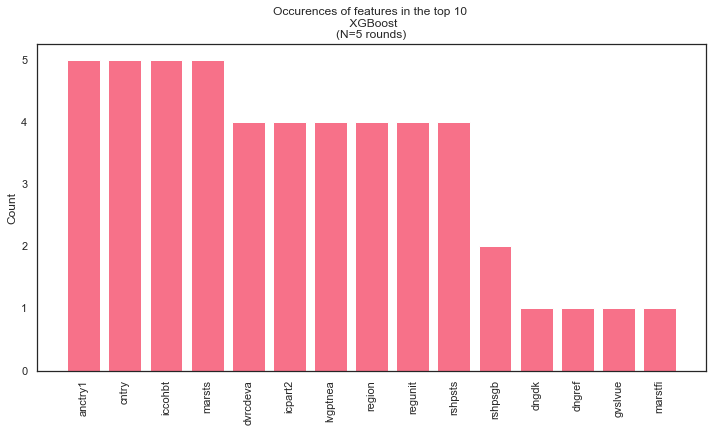

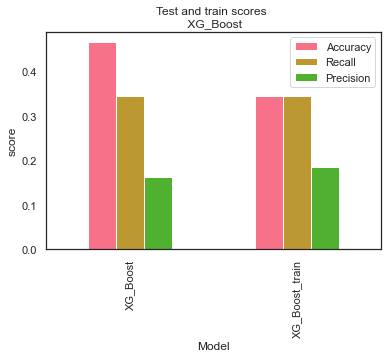

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.83      0.69      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.07      0.53      0.13       232

    accuracy                           0.48      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.33      0.48      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.59      0.83      0.69      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.06      0.58      0.10       165

    accuracy                           0.49      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.34      0.49      0.40      8658
 



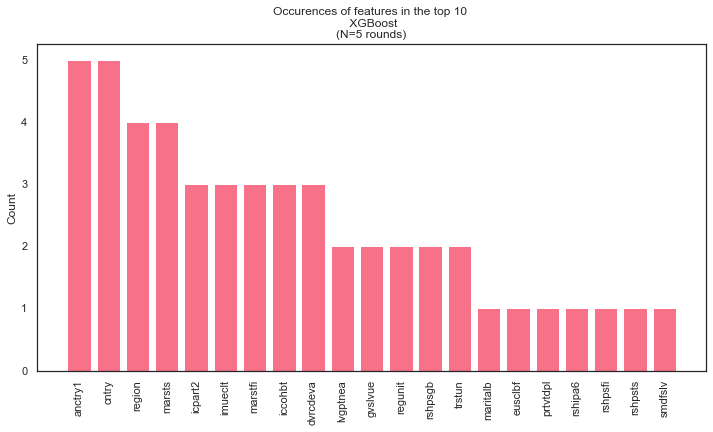

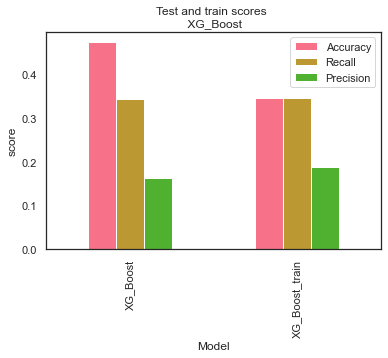

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.472811  0.344021   0.162457  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.346414  0.346414   0.188616  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



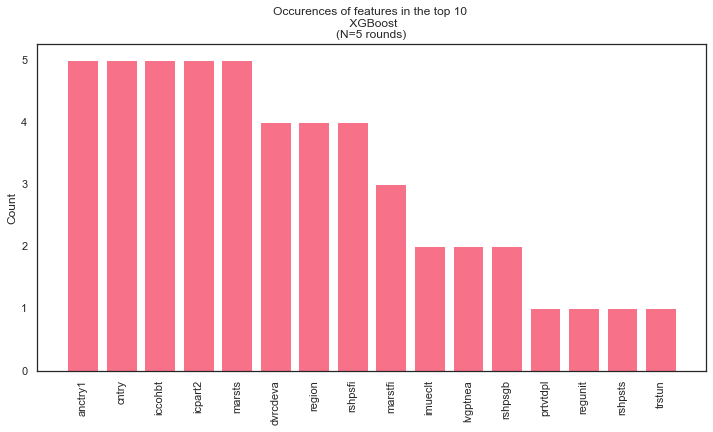

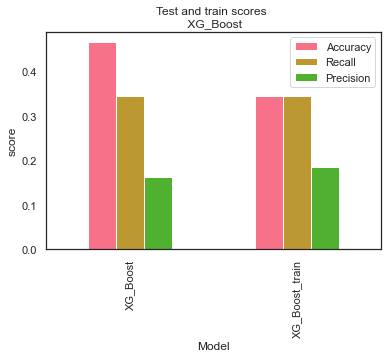

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.58      1.00      0.73      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.73      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



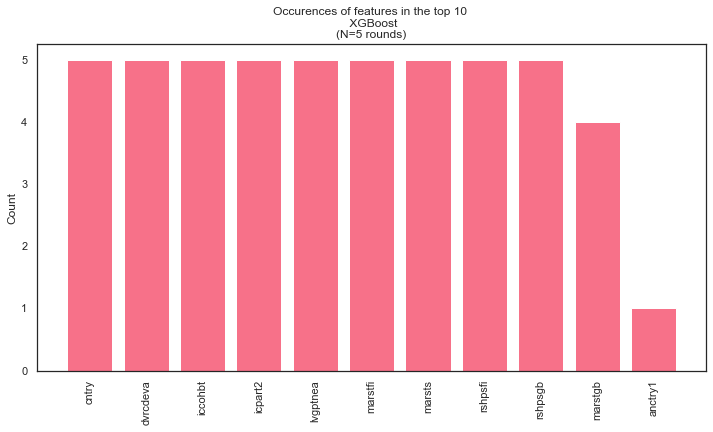

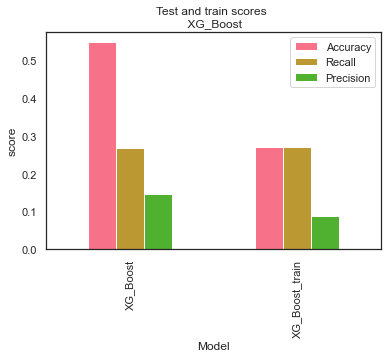

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.548233  0.267025   0.146084  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.269508  0.269508   0.087383  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



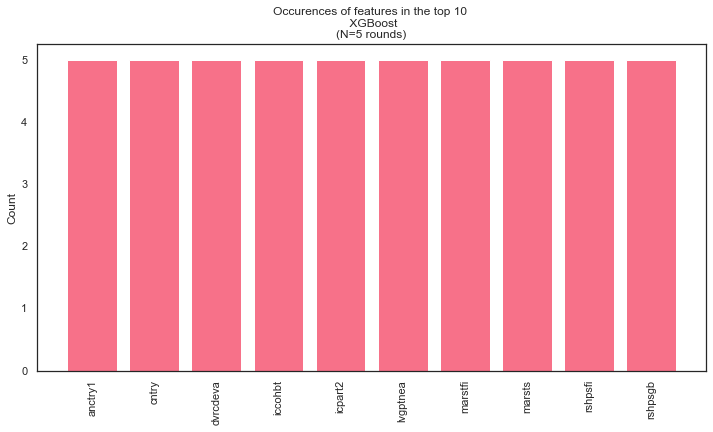

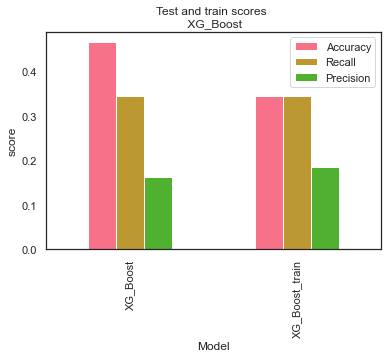

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.58      1.00      0.73      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.57      1.00      0.72      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



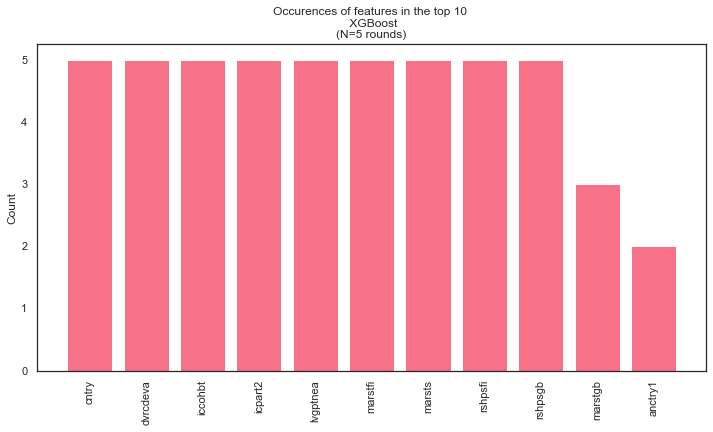

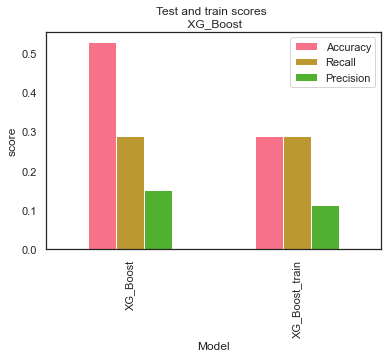

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.526958  0.287619   0.149789  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.289065  0.289065   0.112113  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



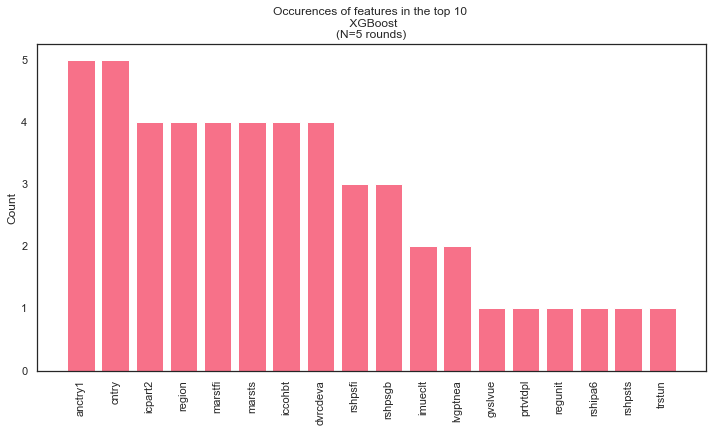

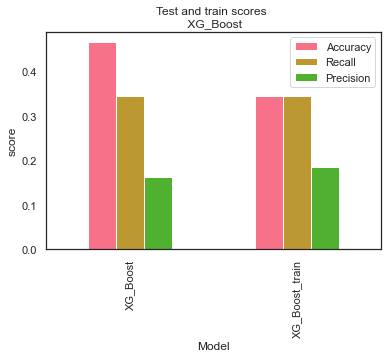

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



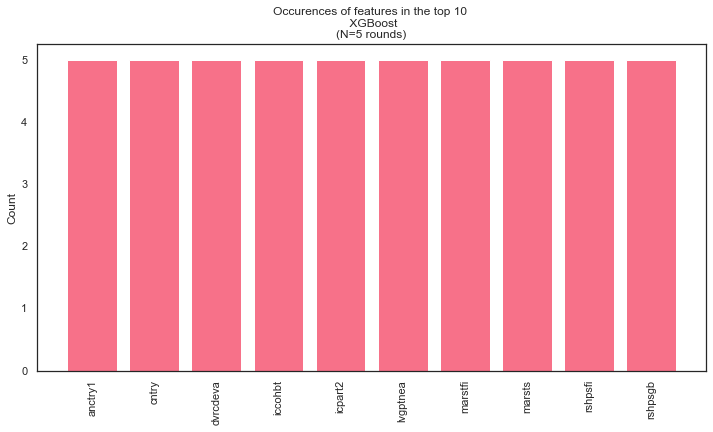

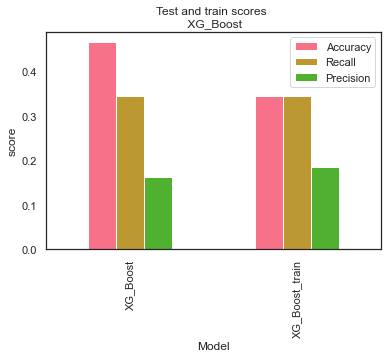

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.59      0.83      0.69      4959
        Prob       0.00      0.00      0.00      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.06      0.58      0.10       165

    accuracy                           0.49      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.34      0.49      0.40      8658
 



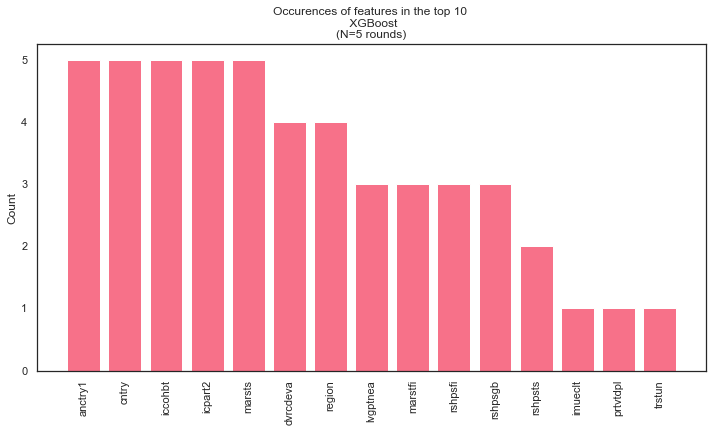

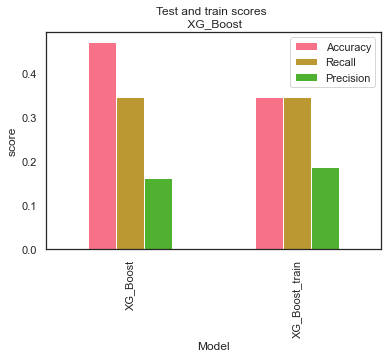

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost   0.46900  0.344185   0.162266  [5, 12, 19, 26, 33]
1  XG_Boost_train   0.34581  0.345810   0.187034  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 5 
               precision    recall  f1-score   support

         Def       0.60      0.79      0.68      4985
        Prob       0.00      0.00      0.00      3091
    Prob not       0.00      0.00      0.00       390
     Def not       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         Def       0.59      0.78      0.67      4967
        Prob       0.00      0.00      0.00      3110
    Prob not       0.00      0.00      0.00       395
     Def not       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4903
        Prob       0.00      0.00      0.00      3176
    Prob not       0.00      0.00      0.00       379
     Def not       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         Def       0.59      0.80      0.68      4901
        Prob       0.00      0.00      0.00      3139
    Prob not       0.00      0.00      0.00       386
     Def not       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         Def       0.63      0.71      0.67      4959
        Prob       0.49      0.16      0.24      3140
    Prob not       0.00      0.00      0.00       394
     Def not       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



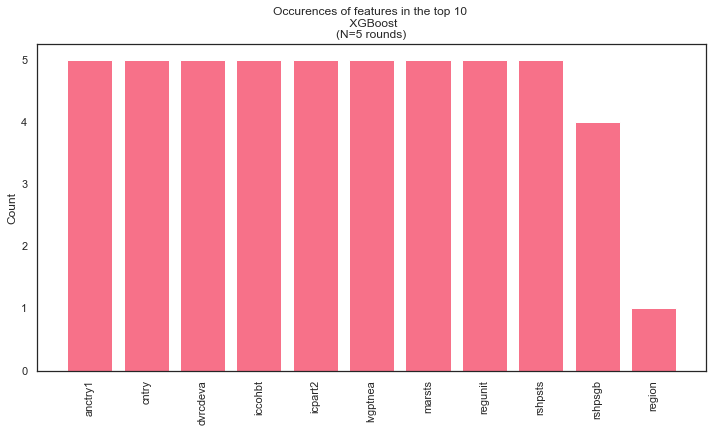

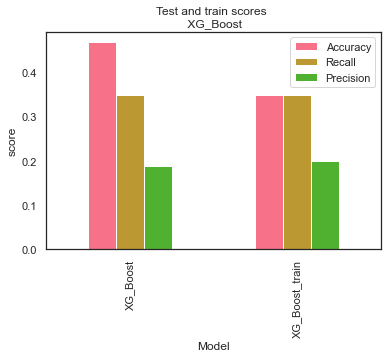

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.466736  0.347835   0.188405  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.347594  0.347594   0.200013  [5, 12, 19, 26, 33]


In [165]:
#try them all
keep_score_trio =[]
keep_feat_trio = []

for i in range(len(top_hyperparams_trio)):
    a  = pd.Series.to_dict(top_hyperparams_trio.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score, feat = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, a)  
    print(score)
    keep_score_trio.append(score)
    keep_feat_trio.append(feat)

In [166]:
keep_score_trio #only 3 that predict all classes: index 4,5 and 7


[            Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.472811  0.344021   0.162457  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.346414  0.346414   0.188616  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.548233  0.267025   0.146084  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.269508  0.269508   0.087383  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1

This did counter the overtraining (it's now slightly undertrained), but did not improve the accuracy score (it's even a bit lower now). Try a different approach:

# Use y_duo - binary classification
start out with learning rate of 0.1 and empty_dict for hyperparameters

4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8076
Def + Prob not       0.12      0.65      0.20       582

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8077
Def + Prob not       0.12      0.67      0.21       581

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

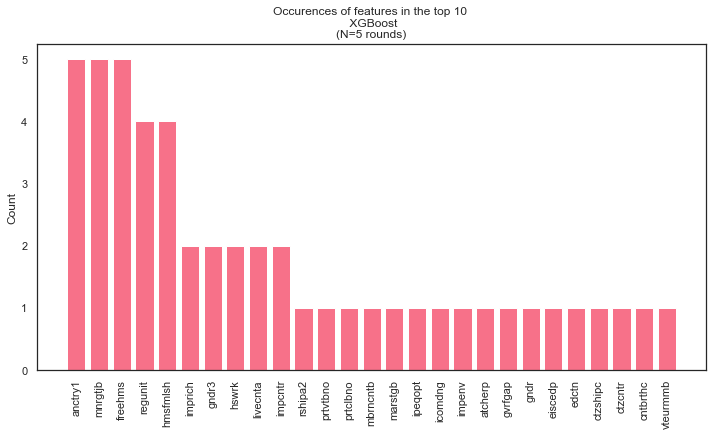

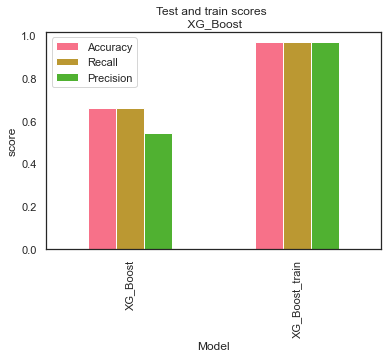

In [167]:
score_duo, feat_duo = XG_Boost_duo(X_noclimate, y_duo, random_states, True, 0.1, empty_dict)

In [168]:
score_duo #some true improvement in accuracy!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.660083,0.660925,0.543856,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.964799,0.964799,0.965434,"[5, 12, 19, 26, 33]"


In [169]:
get_fullname(feat_duo, metadata).sort_values(by="importance", ascending=False) #check it out

,indices,importance,shorthand,full_text
0,316,0.017511,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
18,134,0.012411,livecnta,What year you first came to live in country
25,212,0.012361,rshipa2,Second person in household: relationship to respondent
7,88,0.012327,freehms,Gays and lesbians free to live life as they wish
2,133,0.011726,cntbrthc,Country of birth
19,233,0.011543,marstgb,"Legal marital status, United Kingdom"
14,94,0.010699,impcntr,Allow many/few immigrants from poorer countries outside Europe
23,40,0.009851,prtvtbno,"Party voted for in last national election, Norway"
21,87,0.009448,mnrgtjb,Men should have more right to job than women when jobs are scarce
15,336,0.009062,impenv,Important to care for nature and environment


The accuracy looks promising, optimize learning rate and hyperparameters.

## Tune duo learning rate

In [170]:
learning_rates = list(np.arange(0, 0.04, 0.0001))

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Learning rate: 0.0 
                 precision    recall  f1-score   support

    Def + Prob       0.93      1.00      0.97      8078
Def + Prob not       0.00      0.00      0.00       580

      accuracy                           0.93      8658
     macro avg       0.47      0.50      0.48      8658
  weighted avg       0.87      0.93      0.90      8658
 

4720 4720
Learning rate: 0.0001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.76      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.63      8658
     macro avg       0.53      0.62      0.47      8658
  weighted avg       0.90      0.63      0.73      8658
 

4720 4720
Learning rate: 0.0002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.64      8658
   

4720 4720
Learning rate: 0.0019 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0021000000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                  

4720 4720
Learning rate: 0.0038 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.62      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0039000000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                  

4720 4720
Learning rate: 0.0057 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0058000000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0059 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.62      0.19       580

      accuracy                 

4720 4720
Learning rate: 0.0076 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0077 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0078000000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                 

4720 4720
Learning rate: 0.0095 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.009600000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0097 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                  

4720 4720
Learning rate: 0.0114 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0115 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.011600000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                  

4720 4720
Learning rate: 0.013300000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0134 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0135 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.63      0.20       580

      accuracy                  

4720 4720
Learning rate: 0.0152 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.63      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4720 4720
Learning rate: 0.015300000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.63      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.66      0.74      8658
 

4720 4720
Learning rate: 0.0154 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                  

4720 4720
Learning rate: 0.0171 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4720 4720
Learning rate: 0.0172 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.63      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4720 4720
Learning rate: 0.0173 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66 

Learning rate: 0.019 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.74      8658
 

4720 4720
Learning rate: 0.019100000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.019200000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy               

4720 4720
Learning rate: 0.020900000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.021 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.79      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.0211 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                   

4720 4720
Learning rate: 0.0228 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.0229 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.023 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.66  

4720 4720
Learning rate: 0.0247 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.79      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.024800000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy                           0.66      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.024900000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy    

4720 4720
Learning rate: 0.026600000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.0267 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66      8658
     macro avg       0.54      0.65      0.50      8658
  weighted avg       0.91      0.66      0.75      8658
 

4720 4720
Learning rate: 0.0268 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                  

4720 4720
Learning rate: 0.0285 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0286 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0287 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.66 

4720 4720
Learning rate: 0.0304 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.13      0.66      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.030500000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.030600000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy    

4720 4720
Learning rate: 0.0323 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0324 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0325 
                 precision    recall  f1-score   support

    Def + Prob       0.97      0.67      0.79      8078
Def + Prob not       0.13      0.67      0.21       580

      accuracy                           0.67 

Learning rate: 0.0342 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.66      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.034300000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.65      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0344 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.13      0.66      0.21       580

      accuracy                           0

Learning rate: 0.0361 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.13      0.66      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0362 
                 precision    recall  f1-score   support

    Def + Prob       0.97      0.67      0.79      8078
Def + Prob not       0.13      0.67      0.21       580

      accuracy                           0.67      8658
     macro avg       0.55      0.67      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0363 
                 precision    recall  f1-score   support

    Def + Prob       0.97      0.67      0.79      8078
Def + Prob not       0.13      0.67      0.22       580

      accuracy                           0.67      8658


4720 4720
Learning rate: 0.0381 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.038200000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.12      0.64      0.21       580

      accuracy                           0.67      8658
     macro avg       0.54      0.66      0.50      8658
  weighted avg       0.91      0.67      0.75      8658
 

4720 4720
Learning rate: 0.0383 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.67      0.79      8078
Def + Prob not       0.13      0.66      0.21       580

      accuracy                  

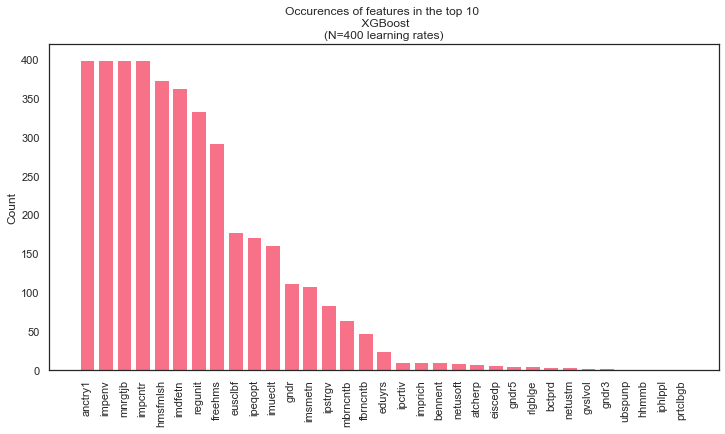

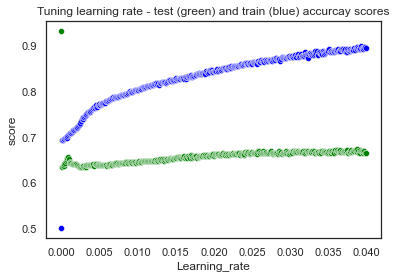

In [171]:
#Takes very long to run, so stored in CSV in the cell below
# score_duo_lr, feat_duo_lr = tune_learning_duo(X_noclimate, y_duo, 7, True, learning_rates, empty_dict)

In [172]:
# score_duo_lr.to_csv('./data/learning_rate_duo_optimization2.csv') # store in CSV, only if cell above is not cancelled out 
# feat_duo_lr.to_csv('./data/learning_rate_duo_optimization_features2.csv')

In [173]:
score_duo_lr = pd.read_csv('./data/learning_rate_duo_optimization2.csv')

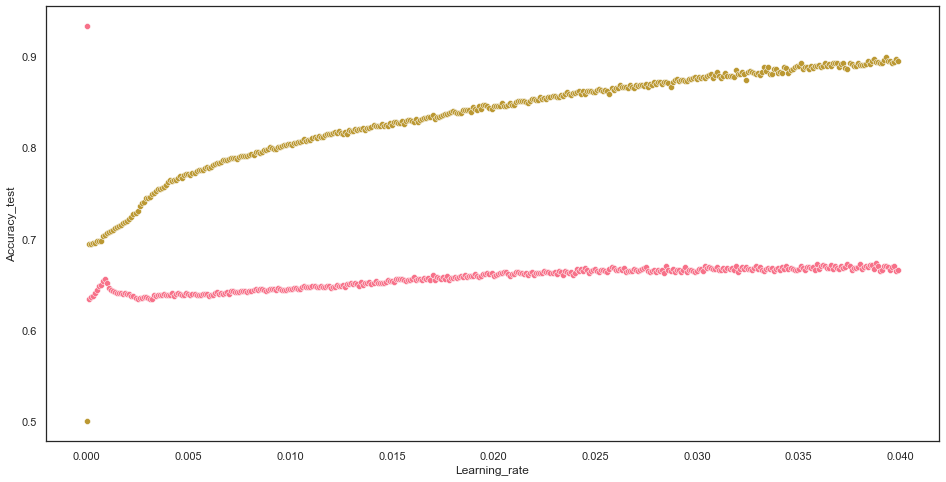

In [174]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

Looks promising somewhere around 0.002! check it out! First zoom in a little:

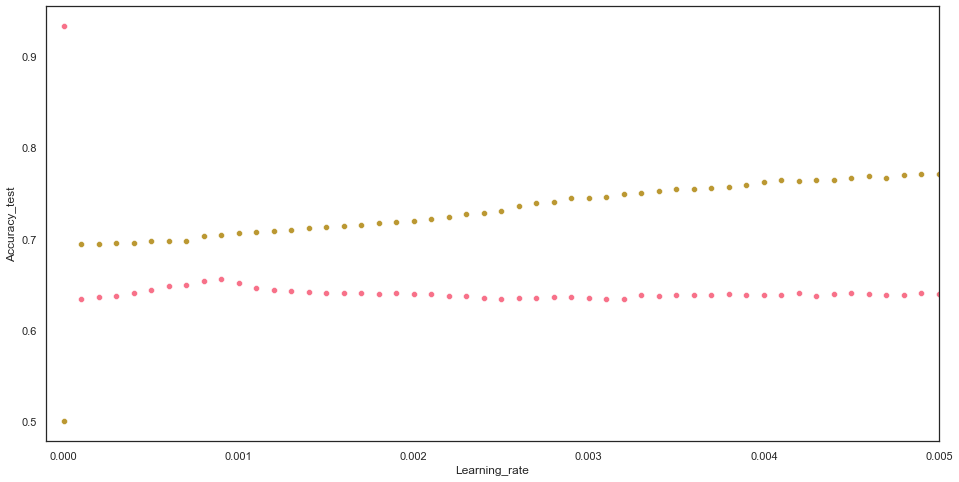

In [175]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-0.0001, 0.005)
plt.show(); 

In [176]:
score_duo_lr["distance"] = score_duo_lr.Accuracy_train - score_duo_lr.Accuracy_test

In [177]:
score_duo_lr.sort_values(by="Accuracy_test", ascending=False).head(20) 
#highest learning rates are not in this just selected part. 
# keep 0.0388 as option for top_lr_duo, also as it is close to the lr of 0.0367 of the original model. 

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
388,388,0.674059,0.666894,0.546024,0.893856,0.893856,0.895791,0.0388,0.219797
380,380,0.672442,0.662827,0.544860,0.890890,0.890890,0.892953,0.0380,0.218448
359,359,0.671980,0.668180,0.546207,0.889831,0.889831,0.891498,0.0359,0.217851
374,374,0.671980,0.665780,0.545589,0.886229,0.886229,0.887946,0.0374,0.214249
385,385,0.671518,0.662331,0.544669,0.891525,0.891525,0.893665,0.0385,0.220008
386,386,0.671287,0.667009,0.545857,0.894703,0.894703,0.896690,0.0386,0.223417
366,366,0.671287,0.660607,0.544208,0.889195,0.889195,0.891107,0.0366,0.217908
362,362,0.671056,0.669285,0.546426,0.889831,0.889831,0.891864,0.0362,0.218775
375,375,0.670825,0.663560,0.544938,0.892373,0.892373,0.894277,0.0375,0.221548


In [178]:
score_duo_lr.sort_values(by="distance", ascending=True).head(20) 
#the smallest distance is between 0.0002-0.0009. The highest accuracy here is 0.655694 at index 9 below 
#(learning rate 0.0009 )
# I'll try this one as top_lr_duo

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
7,7,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.0007,0.048636
9,9,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.0009,0.048755
8,8,0.653615,0.625532,0.534101,0.702966,0.702966,0.703408,0.0008,0.049351
6,6,0.648071,0.628162,0.534520,0.698093,0.698093,0.698315,0.0006,0.050022
5,5,0.644029,0.625195,0.533576,0.697881,0.697881,0.698018,0.0005,0.053853
10,10,0.651998,0.627066,0.534421,0.706144,0.706144,0.706522,0.0010,0.054146
4,4,0.640910,0.625124,0.533425,0.695975,0.695975,0.696089,0.0004,0.055064
2,2,0.636752,0.623696,0.532890,0.694492,0.694492,0.694532,0.0002,0.057739
3,3,0.637676,0.624192,0.533053,0.695551,0.695551,0.695604,0.0003,0.057875


In [179]:
learning_rates_tiny = list(np.arange(0.0005, 0.001, 0.00001))

4720 4720
Learning rate: 0.0005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.60      0.19       580

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.00051 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.61      0.19       580

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0005200000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.60      0.18       580

      accuracy                

4720 4720
Learning rate: 0.0006900000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.61      0.19       580

      accuracy                           0.65      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0007000000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.61      0.19       580

      accuracy                           0.65      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0007100000000000006 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.61      0.19       580

 

4720 4720
Learning rate: 0.000880000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.11      0.59      0.19       580

      accuracy                           0.65      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.000890000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.11      0.59      0.19       580

      accuracy                           0.66      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.66      0.74      8658
 

4720 4720
Learning rate: 0.0009000000000000011 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.11      0.59      0.19       580

   

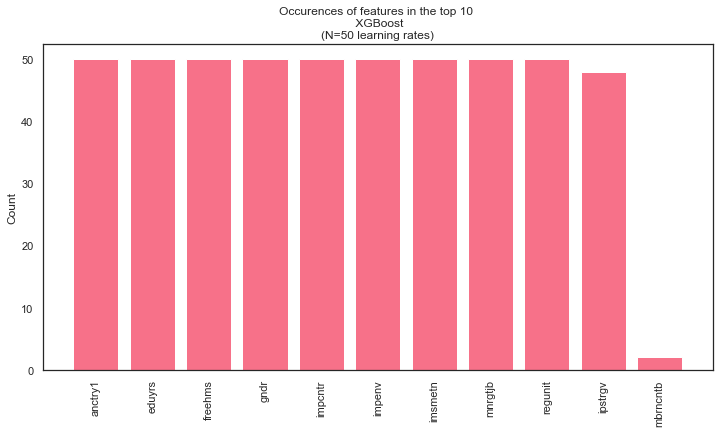

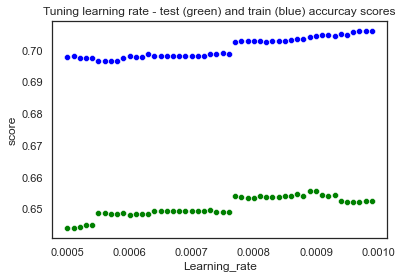

In [180]:
score_duo_tiny, feat_duo_tiny = tune_learning_duo(X_noclimate, y_duo, 7, True, learning_rates_tiny, empty_dict)

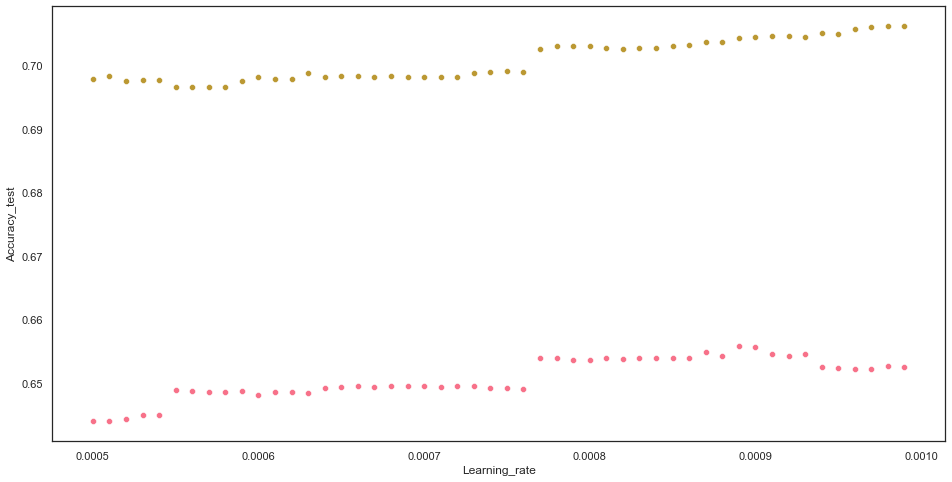

In [181]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [182]:
score_duo_tiny["distance"] = score_duo_tiny.Accuracy_train - score_duo_tiny.Accuracy_test

In [183]:
score_duo_tiny.sort_values(by="Accuracy_test", ascending=False).head(20) #accuracies are really close in the top. 
#0.0009 still a good one

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428
40,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.00090,0.048755
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716
41,0.654539,0.626827,0.534483,0.704661,0.704661,0.705091,0.00091,0.050122
43,0.654539,0.627627,0.534690,0.704449,0.704449,0.704886,0.00093,0.049910
38,0.654193,0.625841,0.534210,0.703602,0.703602,0.704070,0.00088,0.049409
42,0.654193,0.627441,0.534625,0.704661,0.704661,0.705091,0.00092,0.050468
36,0.653962,0.625717,0.534166,0.703178,0.703178,0.703628,0.00086,0.049216
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581
35,0.653962,0.625717,0.534166,0.702966,0.702966,0.703424,0.00085,0.049004


In [184]:
score_duo_tiny.sort_values(by="distance", ascending=True).head(20) 
# smaller distances are around 0.047/0.048 not such a big difference with top_accuracy scores
# not so different from the 0.0009 distance, so I'll select 0.0009 anyway

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
5,0.648880,0.626195,0.534050,0.696610,0.696610,0.696884,0.00055,0.047731
6,0.648764,0.626933,0.534235,0.696610,0.696610,0.696884,0.00056,0.047846
8,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00058,0.048077
7,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00057,0.048077
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581
22,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00072,0.048636
19,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00069,0.048636
20,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00070,0.048636
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716


In [185]:
top_lr_duo = 0.00090
top_lr_duo2 = 0.0388

## Tune duo hyperparameters to 0.0009

In [186]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [187]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective_duo, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:36,  2.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:43,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:42,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:42,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:42,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:47,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:50,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:49,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:46,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:49,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:45,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:42,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:41,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:43,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:41,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:43,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:40,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6391776391776391                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:43,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:10<00:45,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:46,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:43,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:40,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:39,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:36,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:14<00:39,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:15<00:41,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:38,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:36,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:35,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:34,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:33,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:32,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:34,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:19<00:36,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:34,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:32,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:31,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:22<00:31,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:29,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:28,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:27,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:26,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5920535920535921                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:25<00:28,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:26<00:28,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:26,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:27,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:25,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:24,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.588011088011088                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:29<00:25,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:24,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:30<00:24,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:23,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:20,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:19,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:19,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:18,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:17,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:34<00:19,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:16,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:36<00:16,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:15,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:14,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:09,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:09,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:43<00:09,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:09,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:08,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:06,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:05,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:04,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5977130977130977                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:44,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:43,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6433356433356433                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:49,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:52,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:53,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:54,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:50,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:44,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
 11%|█████▏                                         | 11/100 [00:05<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 12%|█████▋                                         | 12/100 [00:06<00:50,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:46,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:43,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:45,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:47,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:47,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:48,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5815430815430815                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:48,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:49,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:45,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:42,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:40,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:39,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:38,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:14<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:36,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:15<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:34,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:34,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:33,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:33,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:32,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:31,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:31,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:30,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:30,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:22<00:31,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:22<00:32,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:30,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:29,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6149226149226149                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:24<00:31,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:29,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:25<00:30,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:28,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:27<00:28,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:28,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:26,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:24,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:29<00:23,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:22,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:30<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:20,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:19,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:19,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:18,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:19,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:18,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:18,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:16,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:15,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:13,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:13,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:11,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:09,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:08,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:07,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:06,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:05,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:04,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:47<00:04,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6215061215061215                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:49<00:02,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:00,  1.64trial/s, best loss: -0.5786555786555787]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:55,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:50,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:46,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:49,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:52,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:53,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5837375837375838                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:54,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:54,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:50,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:46,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:44,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:41,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:41,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:38,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:38,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:41,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:39,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:38,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:13<00:40,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:38,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 27%|████████████▋                                  | 27/100 [00:14<00:40,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:38,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:36,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:35,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:35,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:17<00:39,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:37,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:35,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:33,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:32,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:31,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:28,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:22<00:29,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:24<00:29,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:28,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:25<00:30,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:30,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:28,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:27,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:28,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:25,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:28<00:26,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:29<00:24,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:29<00:25,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:30<00:24,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:22,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:31<00:24,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:22,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:20,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:19,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:21,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:34<00:22,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:20,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:35<00:18,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:37<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:13,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:11,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:10,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:09,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:08,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:08,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:45,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:50,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:53,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:49,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:52,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:49,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:44,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:42,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:41,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:39,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:39,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:45,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:43,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:40,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:43,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:40,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:11<00:41,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:39,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:12<00:42,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:39,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:37,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:14<00:39,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:37,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:35,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:16<00:38,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:36,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:35,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:17<00:38,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:36,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:34,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:19<00:34,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:30,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:28,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:26,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:26,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:25,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:24,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:23,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:23,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:22,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:23,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:22,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:26<00:24,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:22,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:27<00:21,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:27<00:23,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:21,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:29<00:21,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5928620928620929                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:22,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:19,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:18,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:17,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:16,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:16,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:15,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:14,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:14,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:13,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:14,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:14,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:12,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:11,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:09,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:41<00:09,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:08,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:07,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:05,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:03,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:48<00:02,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:44,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:42,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:47,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:43,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:45,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:44,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:46,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:41,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:46,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:40,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:44,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:44,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:43,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:43,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:39,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:40,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 27%|████████████▋                                  | 27/100 [00:13<00:37,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:36,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:32,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:28,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:17<00:31,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:30,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:32,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:30,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:24,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:23<00:27,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:26,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:23,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:23,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:25,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:23,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:20,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:19,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:28<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:29<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:19,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:19,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:17,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:15,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:14,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:14,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:15,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:14,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:14,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:11,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:11,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:10,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:07,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:07,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5694155694155694                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:01,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:54,  1.83trial/s, best loss: -0.6026796026796026]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6096096096096096                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:54,  1.81trial/s, best loss: -0.6096096096096096]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:55,  1.75trial/s, best loss: -0.6096096096096096]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:51,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:47,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:48,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:48,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:50,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:51,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6312081312081312                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:53,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:53,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:53,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:07<00:53,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:51,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:47,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:42,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:09<00:39,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6156156156156156                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:42,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:43,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:40,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:39,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:36,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:35,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:34,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:33,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:33,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:33,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:32,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:31,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 32%|███████████████                                | 32/100 [00:16<00:34,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:33,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:30,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:29,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:28,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:28,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:27,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:26,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:25,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:25,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:22<00:27,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:26,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:23,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:23,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:25<00:24,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:22,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:22,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:22,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:20,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:19,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:17,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:17,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:17,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:33<00:15,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:15,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:13,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:12,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:11,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:12,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:12,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:12,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:10,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:02,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.72trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:51,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:51,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:53,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:48,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:46,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:47,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:43,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:45,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:43,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5898590898590899                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:46,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:39,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:37,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:42,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6186186186186187                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:45,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:44,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:37,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:40,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:40,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:31,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:28,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:17<00:32,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:18<00:34,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:31,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:31,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:21<00:30,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:26,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:26,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:25,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:24,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:24,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:25<00:24,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:22,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:26<00:23,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:22,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:19,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:19,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:17,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:18,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:17,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:16,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:15,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:14,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:12,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:10,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:10,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:39<00:10,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:09,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:08,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:07,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:07,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:06,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:06,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:04,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.71trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:57,  1.69trial/s, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6077616077616078                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:57,  1.70trial/s, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:50,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:51,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:48,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:50,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:50,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:49,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:49,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:46,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6273966273966274                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:44,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6054516054516055                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:45,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:46,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:42,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:37,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:35,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:37,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:37,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:37,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:34,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:33,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:32,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:32,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:33,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:14<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:31,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:31,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 34%|███████████████▉                               | 34/100 [00:16<00:33,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:31,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:28,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:29,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:20<00:30,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:24,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 47%|██████████████████████                         | 47/100 [00:23<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:23<00:28,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:27,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:27,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:25,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:23,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:22,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:29<00:23,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:29<00:22,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:30<00:23,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:21,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:20,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:19,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:32<00:20,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:18,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:18,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:34<00:18,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:17,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:35<00:16,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:15,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:36<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:15,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:37<00:16,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:14,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:38<00:13,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:14,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:39<00:13,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:12,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:40<00:12,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:11,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 81%|██████████████████████████████████████         | 81/100 [00:41<00:10,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:09,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:42<00:08,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:08,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:43<00:07,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:06,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:44<00:06,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:05,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:45<00:05,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:05,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:46<00:04,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:47<00:04,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:04,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:03,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:49<00:02,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:41,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:41,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:46,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:50,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:47,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:46,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:49,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:47,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:45,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:44,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:41,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:44,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5694155694155694                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:46,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:46,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:43,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:45,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:44,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:40,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:39,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:35,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:36,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:32,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:31,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:32,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:31,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:31,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:30,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:28,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:28,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:19<00:31,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:21<00:29,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:28,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:27,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:23<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:28,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:24<00:30,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:25<00:26,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:26<00:28,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:25,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:27<00:26,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:28<00:25,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:23,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:22,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:29<00:21,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:29<00:20,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:18,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:30<00:19,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:19,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:18,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:17,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:16,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:15,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:14,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:14,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:13,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:13,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:12,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:12,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:10,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:02,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:01,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:39,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:39,  2.45trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:39,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6078771078771079                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:44,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:47,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:45,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:43,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:47,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:48,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:43,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:45,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:48,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:45,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:42,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:45,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.588011088011088                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:48,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:49,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:45,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:42,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:41,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:40,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:39,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:38,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:36,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:14<00:40,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:38,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:35,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:34,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:34,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:17<00:36,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:35,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:33,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:32,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:31,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:19<00:34,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:32,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:31,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:30,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:29,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:28,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:28,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:27,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:26,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:25,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:28,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:29,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:28,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:26,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:28,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:27<00:28,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:26,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:24,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:23,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:22,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:21,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5927465927465927                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:31<00:22,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:21,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:18,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:17,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:33<00:17,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:16,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:35<00:17,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:16,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:13,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:38<00:12,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:11,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:10,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:40<00:10,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.626010626010626                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:10,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:42<00:10,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:10,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:43<00:10,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:10,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:09,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:08,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6056826056826057                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:08,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:07,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:06,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:03,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [00:52<00:00,  1.89trial/s, best loss: -0.933009933009933]


try the best params

In [188]:
#putting the list of dictionaries into a single dictionary
dict_tuple_duo = tuple(values_list_duo)
dict_full_duo = {k:[d.get(k) for d in dict_tuple_duo] for k in {k for d in dict_tuple_duo for k in d}}

In [189]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_duo['max_depth'])):
    dict_full_duo['max_depth'][i] = int(dict_full_duo['max_depth'][i])

dict_full_duo

{'colsample_bytree': [0.515805146082118,
  0.709860732357115,
  0.51171712378833,
  0.7903653941352202,
  0.6288200792402378,
  0.9690051375518102,
  0.6535205221546669,
  0.7967836576359267,
  0.550862223616564,
  0.934253411065058],
 'min_child_weight': [0.0, 9.0, 2.0, 6.0, 10.0, 8.0, 8.0, 7.0, 2.0, 7.0],
 'reg_alpha': [113.0,
  166.0,
  117.0,
  123.0,
  130.0,
  113.0,
  120.0,
  91.0,
  134.0,
  121.0],
 'gamma': [4.204815225544027,
  4.739354367517936,
  7.2870533130057344,
  8.413002242099008,
  1.8076910950915899,
  4.925878648152649,
  6.49151325448494,
  7.787764649193309,
  2.0176624448809646,
  2.9346854766594745],
 'max_depth': [10, 8, 7, 12, 8, 13, 10, 4, 8, 7],
 'reg_lambda': [0.6562810040549797,
  0.7354774979318005,
  0.5681570615538833,
  0.9807097372121427,
  0.36895156666369266,
  0.8921982439799425,
  0.5900671737242006,
  0.809215495594471,
  0.11747057080635148,
  0.23275675277493624]}

In [190]:
top_hyperparams_duo = pd.DataFrame.from_dict(dict_full_duo)
top_hyperparams_duo.sort_values(by="max_depth")

,colsample_bytree,min_child_weight,reg_alpha,gamma,max_depth,reg_lambda
7,0.796784,7.0,91.0,7.787765,4,0.809215
2,0.511717,2.0,117.0,7.287053,7,0.568157
9,0.934253,7.0,121.0,2.934685,7,0.232757
1,0.709861,9.0,166.0,4.739354,8,0.735477
4,0.628820,10.0,130.0,1.807691,8,0.368952
8,0.550862,2.0,134.0,2.017662,8,0.117471
0,0.515805,0.0,113.0,4.204815,10,0.656281
6,0.653521,8.0,120.0,6.491513,10,0.590067
3,0.790365,6.0,123.0,8.413002,12,0.980710
5,0.969005,8.0,113.0,4.925879,13,0.892198


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.75      8077
Def + Prob not       0.10      0.61      0.18       581

      accuracy                           0.62      8658
     macro avg       0.53      0.61      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

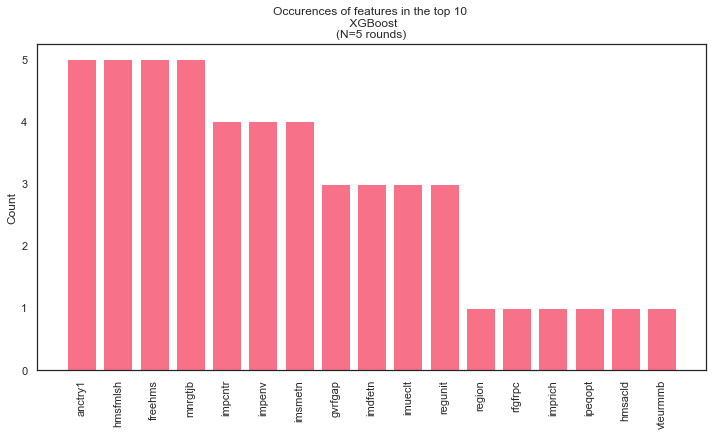

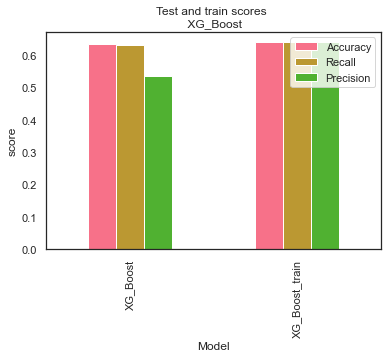

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.634119  0.629327   0.534521  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.639320  0.639320   0.639401  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.64      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.57      0.17       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

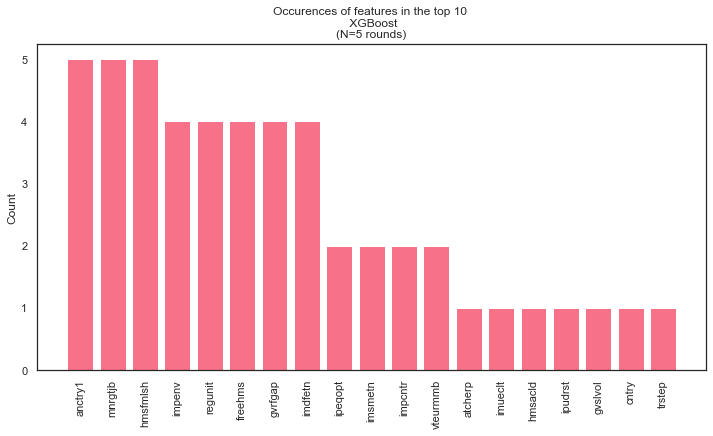

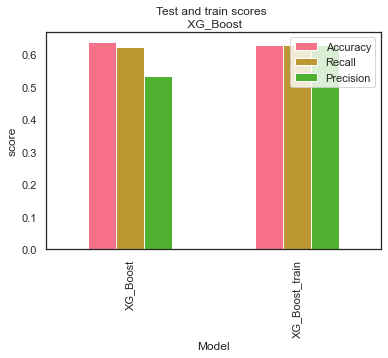

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.637122  0.622577   0.532855  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.628062  0.628062   0.628324  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8077
Def + Prob not       0.10      0.60      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.61      0.46      8

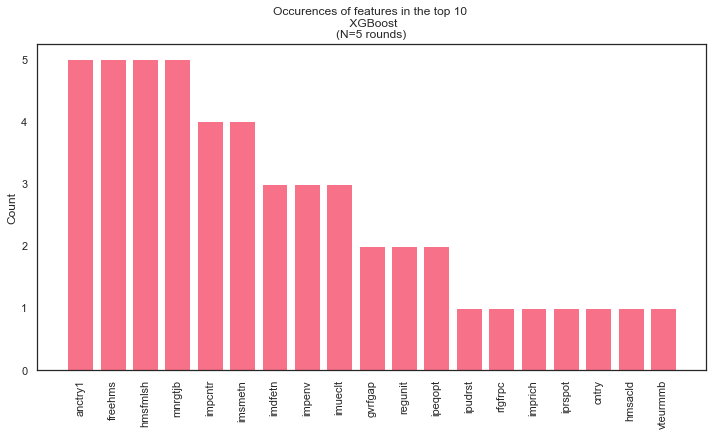

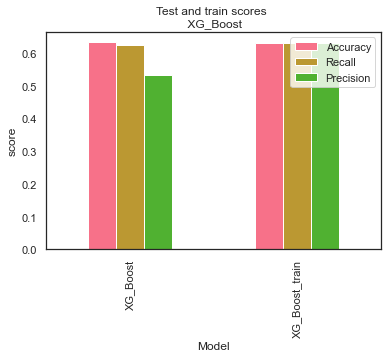

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.633218  0.625209   0.533448  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.631707  0.631707   0.631846  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.66      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.91      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.61      0.75      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.60      0.46      8

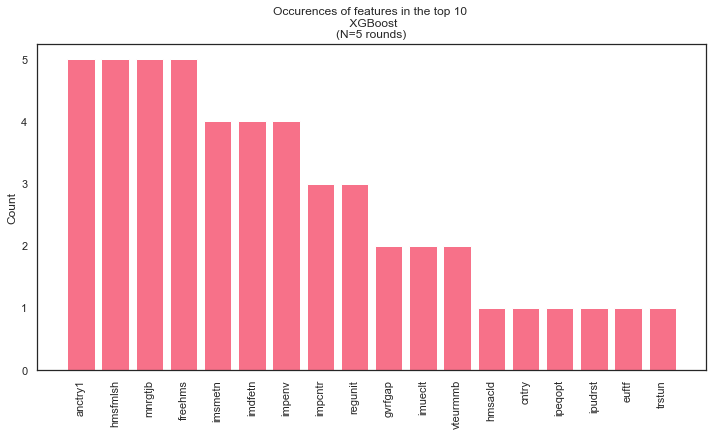

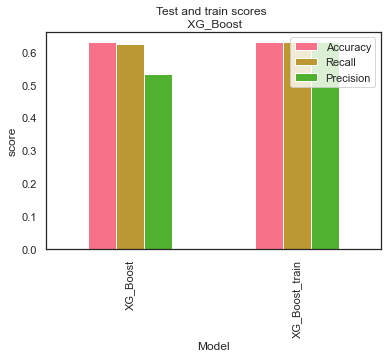

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.628621  0.623606   0.532835  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.627765  0.627765   0.627938  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

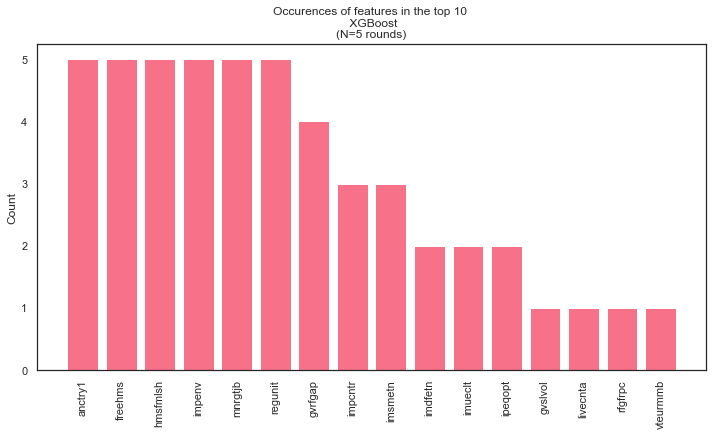

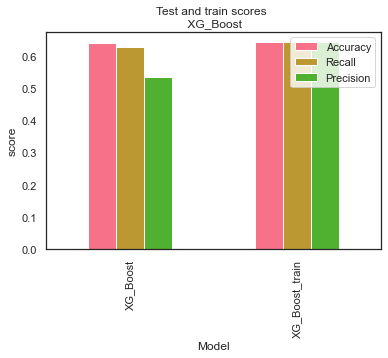

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.640772  0.628089   0.534467  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.641852  0.641852   0.642001  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.62      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.62      8658
     macro avg       0.53      0.61      0.47      8

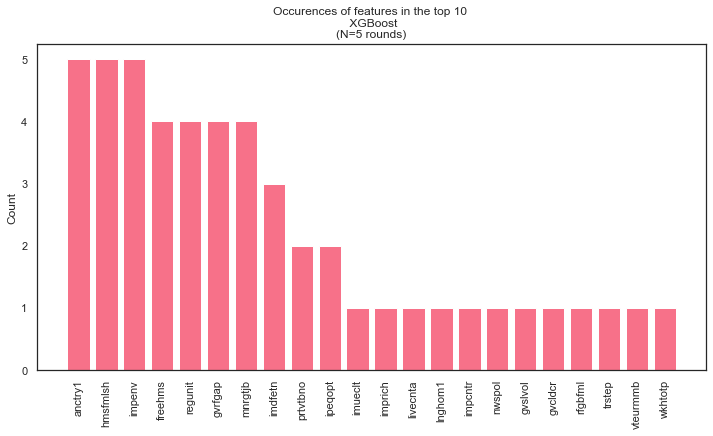

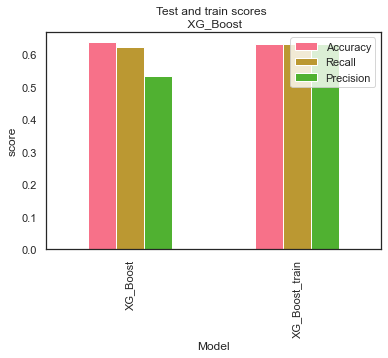

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.636729  0.621991   0.532720  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.630831  0.630831   0.631018  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8077
Def + Prob not       0.10      0.60      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.61      0.46      8

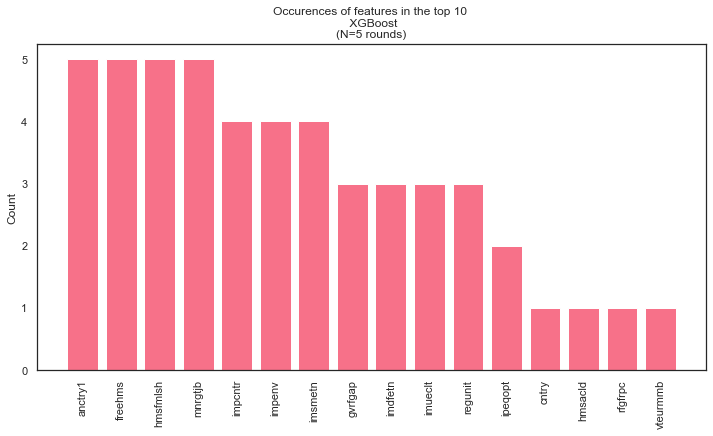

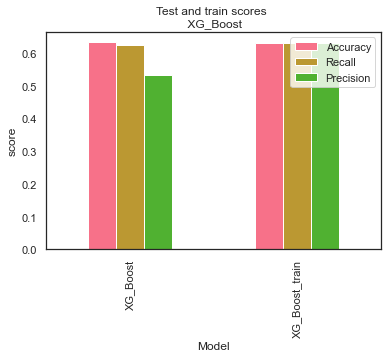

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.632571  0.625215   0.533431  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.630735  0.630735   0.630893  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.66      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.62      0.75      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.60      0.46      8

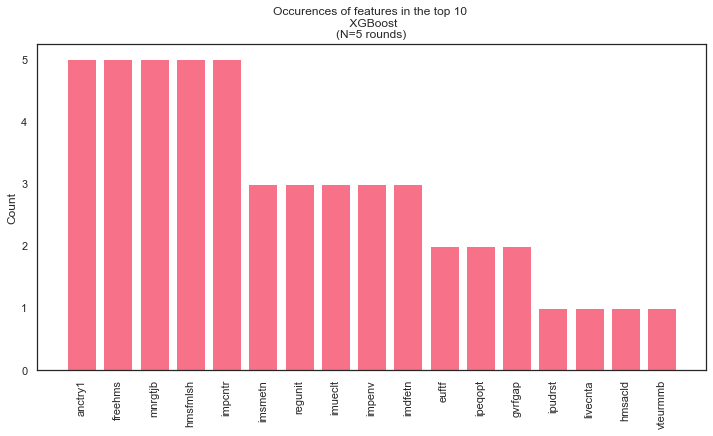

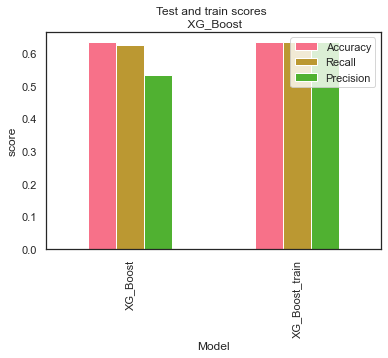

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.631809  0.625056   0.533327  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.632356  0.632356   0.632444  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.18       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

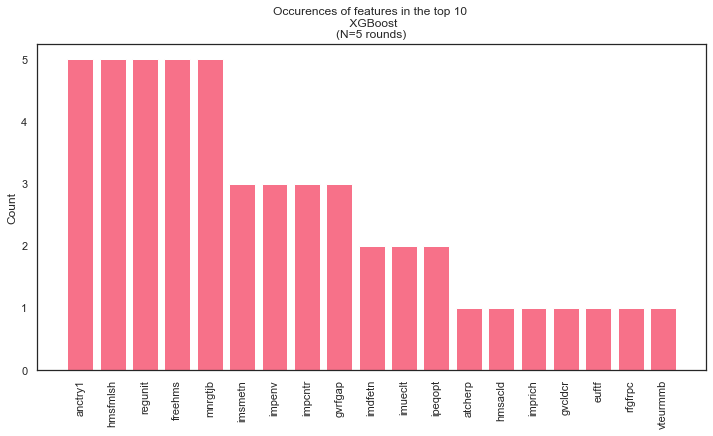

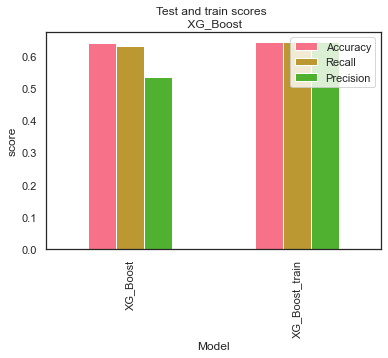

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.640702  0.630273   0.535026  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.641638  0.641638   0.641789  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.18       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

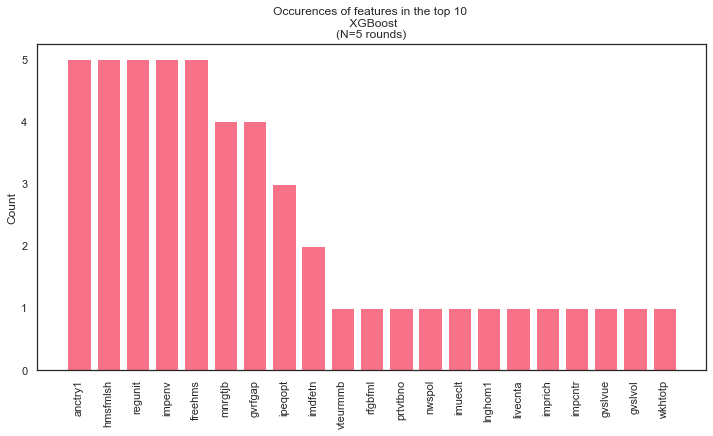

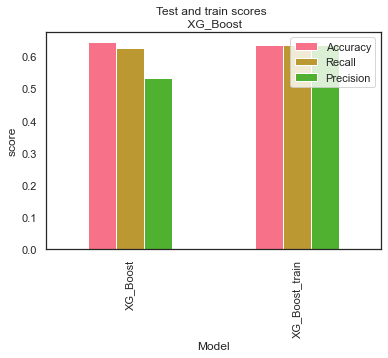

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.643867  0.624893   0.533778  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.634433  0.634433   0.634833  [5, 12, 19, 26, 33]


In [249]:
#try them all
keep_score_duo =[]
keep_feat_duo = []

for i in range(len(top_hyperparams_duo)):
    a  = pd.Series.to_dict(top_hyperparams_duo.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score_duo, feat_duo = XG_Boost_duo(X_noclimate, y_duo, random_states, True, top_lr_duo, a)  
    print(score_duo)
    keep_score_duo.append(score_duo)
    keep_feat_duo.append(feat_duo)

In [252]:
keep_score_duo 

[            Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.634119  0.629327   0.534521  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.639320  0.639320   0.639401  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.637122  0.622577   0.532855  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.628062  0.628062   0.628324  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.633218  0.625209   0.533448  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.631707  0.631707   0.631846  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.628621  0.623606   0.532835  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.627765  0.627765   0.627938  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.640772  0.628089   0.534467  [5, 12, 19, 26, 33]
 1

In [358]:
acc_test = []
acc_train = []

for i in range(len(keep_score_duo)):
    a = keep_score_duo[i]
    acc_test.append(a["Accuracy"][0])
    acc_train.append(a["Accuracy"][1])

In [359]:
outcomes = pd.DataFrame(zip(acc_test,acc_train), columns=["test", "train"])
outcomes["difference "] = abs(outcomes["test"] - outcomes["train"])

In [360]:
outcomes.sort_values("test", ascending=False)

,test,train,difference
9,0.643867,0.634433,0.009434
4,0.640772,0.641852,0.001081
8,0.640702,0.641638,0.000935
1,0.637122,0.628062,0.009059
5,0.636729,0.630831,0.005898
0,0.634119,0.639320,0.005201
2,0.633218,0.631707,0.001511
6,0.632571,0.630735,0.001836
7,0.631809,0.632356,0.000547
3,0.628621,0.627765,0.000855


In [361]:
#choose the second one in this casem as the test score is not that different, but
#train and test are a lot closer (index 4)
top_param_duo = top_hyperparams_duo.iloc[4,:] #select hyperparam-combination
top_param_duo = top_param_duo.to_dict() #put into dict
top_param_duo["max_depth"] = int(top_param_duo["max_depth"]) #change float to int
top_param_duo

{'colsample_bytree': 0.6288200792402378,
 'min_child_weight': 10.0,
 'reg_alpha': 130.0,
 'gamma': 1.8076910950915899,
 'max_depth': 8,
 'reg_lambda': 0.36895156666369266}

4678 4678
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 0 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8057
Def + Prob not       0.11      0.59      0.18       601

      accuracy                           0.64      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4702 4702
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 1 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8069
Def + Prob not       0.11      0.64      0.18       589

      accuracy                           0.61      8658
     macro avg       0.53      0.63      0.46      8658
  weighted avg       0.90      0.61      0.71      8658
 

4750 4750
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 2 
                 precision    recall  f1-score   support

    De

Random state: 17 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8087
Def + Prob not       0.11      0.63      0.19       571

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4698 4698
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 18 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8067
Def + Prob not       0.12      0.66      0.20       591

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8079
Def + Prob not

4708 4708
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 35 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.75      8072
Def + Prob not       0.11      0.65      0.19       586

      accuracy                           0.62      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.62      0.71      8658
 

4646 4646
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 36 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.66      0.78      8041
Def + Prob not       0.12      0.59      0.19       617

      accuracy                           0.65      8658
     macro avg       0.54      0.62      0.49      8658
  weighted avg       0.89      0.65      0.74      8658
 

4624 4624
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 37 
                 precision    recall  f1-score   support

   

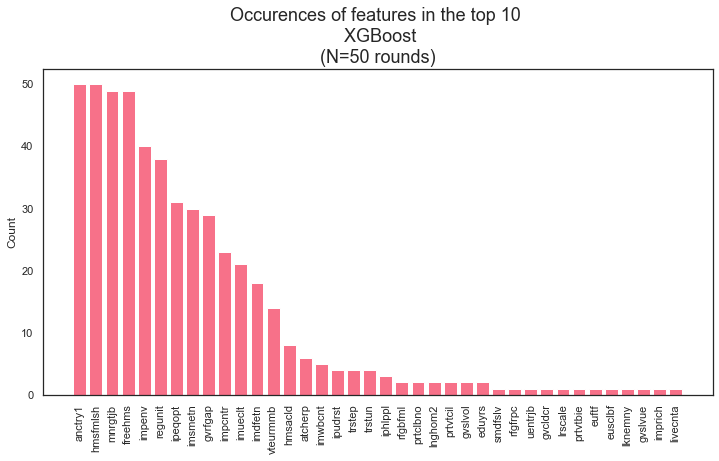

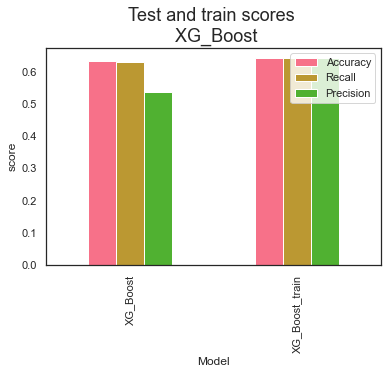

In [362]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo_scores, duo_feats = XG_Boost_duo(X_noclimate, y_duo, random_states_many, True, top_lr_duo, top_param_duo)

In [363]:
duo_scores

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.633333,0.630431,0.535064,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.640584,0.640584,0.640704,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [367]:
get_fullname(duo_feats, metadata).sort_values(by="importance", ascending=False)

,indices,importance,shorthand,full_text
0,316,0.090701,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
11,89,0.053550,hmsfmlsh,Ashamed if close family member gay or lesbian
26,87,0.049449,mnrgtjb,Men should have more right to job than women when jobs are scarce
5,88,0.047232,freehms,Gays and lesbians free to live life as they wish
4,180,0.042857,eusclbf,Against or In favour of European Union-wide social benefit scheme
16,92,0.039045,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
14,336,0.033917,impenv,Important to care for nature and environment
17,96,0.033815,imueclt,Country's cultural life undermined or enriched by immigrants
1,107,0.033335,atcherp,How emotionally attached to Europe
13,94,0.033202,impcntr,Allow many/few immigrants from poorer countries outside Europe


Check agains score of other learning rate..

## Tune duo hyperparameters to 0.0388

In [193]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [194]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo2 = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective_duo2, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo2.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:54,  1.83trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:55,  1.76trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6428736428736429                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:56,  1.71trial/s, best loss: -0.6428736428736429]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:51,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:48,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:45,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:43,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:47,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:45,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:43,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6343266343266343                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:47,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:43,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:46,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:44,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:42,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:44,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:41,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:36,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:36,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:34,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:34,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:34,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:15<00:36,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 32%|███████████████                                | 32/100 [00:16<00:38,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:36,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:34,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:33,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:32,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:30,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:29,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:19<00:33,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:31,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:21<00:32,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:30,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:30,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:28,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:23<00:30,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:26,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:24,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:24,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:26<00:26,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:26<00:25,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:24,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:27<00:23,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:21,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:21,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:29<00:22,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:29<00:23,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:30<00:24,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:21,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:31<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:19,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:19,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:33<00:20,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:33<00:18,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6481866481866482                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:34<00:19,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:17,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:35<00:16,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:36<00:14,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:37<00:13,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:14,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:38<00:13,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:12,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:39<00:11,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:11,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:40<00:10,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:10,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:42<00:11,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:10,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:08,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:07,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:06,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:06,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:05,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:50<00:01,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:00,  1.65trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:59,  1.65trial/s, best loss: -0.5761145761145761]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6156156156156156                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:59,  1.62trial/s, best loss: -0.6156156156156156]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:54,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:54,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:55,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:50,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:51,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:48,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5794640794640795                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:50,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:06<00:45,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:43,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:41,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:40,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:43,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:43,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:45,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:41,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:40,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:39,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:37,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:36,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:35,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:33,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:16<00:37,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:35,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:17<00:38,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:35,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:33,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:32,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:31,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:19<00:34,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:32,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:31,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:29,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:28,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:23<00:29,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:25,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:24,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6143451143451143                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:26<00:27,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:28,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:26,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:24,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:23,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:29<00:24,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:29<00:25,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:30<00:25,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:23,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:31<00:23,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:32<00:24,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:21,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:20,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:34<00:21,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:20,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:35<00:20,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:18,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:17,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:36<00:18,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:37<00:18,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:17,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:17,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:15,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:14,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:40<00:13,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:12,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:41<00:11,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:11,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:42<00:10,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:09,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:43<00:09,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:09,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:44<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:07,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:07,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:06,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:06,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:05,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:05,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:01,  1.61trial/s, best loss: -0.6168861168861168]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:55,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:51,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:45,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:49,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:51,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:47,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:50,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:51,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:47,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:49,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:45,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:47,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:44,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:41,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:39,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:42,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:39,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:36,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:36,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:35,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:14<00:38,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:36,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:35,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:34,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:17<00:36,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:18<00:37,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:38,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:35,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:33,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:31,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:30,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:22<00:31,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:29,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:26,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:25,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:26<00:26,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:27,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:25,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:24,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:28<00:25,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:24,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:22,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:21,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:30<00:23,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:21,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:31<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:19,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:20,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:19,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:18,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:15,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:14,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:15,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:16,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:16,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:14,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:13,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:12,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:11,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:09,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:09,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:09,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:08,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5915915915915916                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:42,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:42,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:47,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:55,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
  5%|██▍                                             | 5/100 [00:03<01:00,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<01:01,  1.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:04<00:56,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:53,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:05<00:51,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:49,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:06<00:46,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:46,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:43,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:47,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:43,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:47,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:10<00:49,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 19%|████████▉                                      | 19/100 [00:11<00:51,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:50,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:12<00:46,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:12<00:47,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:13<00:45,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:42,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 25%|███████████▊                                   | 25/100 [00:14<00:44,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:15<00:41,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:15<00:40,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:16<00:38,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:16<00:36,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:35,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:17<00:34,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:18<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:31,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:19<00:31,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 36%|████████████████▉                              | 36/100 [00:20<00:34,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:20<00:33,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:21<00:34,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:21<00:32,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:22<00:31,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:22<00:30,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:23<00:29,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:23<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:24<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:24<00:29,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:25<00:31,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:25<00:29,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:26<00:27,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:26,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:27<00:28,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:28<00:26,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:28<00:25,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:29<00:24,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:29<00:26,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:30<00:24,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:30<00:23,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:31<00:24,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:31<00:22,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:32<00:21,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:20,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:33<00:21,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:20,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:34<00:21,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:35<00:19,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:35<00:18,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:36<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:37<00:15,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:37<00:15,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:37<00:14,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:40<00:13,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:40<00:13,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:41<00:12,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:41<00:12,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:42<00:11,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:42<00:10,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:43<00:10,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:43<00:09,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:44<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:44<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:45<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:07,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:46<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:06,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:47<00:05,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:48<00:04,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:49<00:03,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:50<00:02,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:51<00:02,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:42,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5705705705705706                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:48,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:52,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:48,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:51,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:48,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:45,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:43,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:41,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:44,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:42,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:45,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:41,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:43,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:44,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:44,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:42,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:40,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:39,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:12<00:42,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:39,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:38,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:36,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:36,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:33,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:33,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:32,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:31,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:34,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:32,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:20<00:33,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:31,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:30,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:29,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:28,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:28,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:25,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:24,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:26<00:24,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:23,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:27<00:22,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:21,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:21,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:29<00:23,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:29<00:21,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:30<00:20,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:20,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:31<00:21,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:20,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:20,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:19,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:33<00:18,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:34<00:19,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:34<00:19,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:35<00:19,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:36<00:19,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:17,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:16,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:16,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:14,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:15,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:15,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:14,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:13,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:12,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:11,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:11,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:10,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:09,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:09,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:08,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:08,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:08,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:47<00:07,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:06,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:48<00:05,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:49<00:04,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:50<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:51<00:02,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:52<00:01,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6372141372141372                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:04,  1.54trial/s, best loss: -0.6372141372141372]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:57,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:57,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:52,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:48,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:51,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:52,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:53,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6078771078771079                                                                                                     
  9%|████▎                                           | 9/100 [00:05<00:54,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:49,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:46,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:43,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:46,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.617925617925618                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:48,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:49,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:49,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:49,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:45,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:47,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:11<00:42,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:40,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:39,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:38,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:36,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:35,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:35,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:34,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:34,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:32,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:32,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 34%|███████████████▉                               | 34/100 [00:17<00:35,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:18<00:37,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:34,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:32,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:31,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:31,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:30,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:29,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:28,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:27,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:24<00:28,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:25<00:29,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:25,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:27,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:25,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:24,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:23,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:22,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:30<00:23,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:22,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:20,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:32<00:21,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:22,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:22,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:34<00:22,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:34<00:22,  1.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:35<00:20,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:19,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:17,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:16,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:37<00:15,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:13,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:12,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:11,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:10,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:09,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:08,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:07,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:03,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:01,  1.62trial/s, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:01,  1.60trial/s, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:56,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:57,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:57,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:57,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:04<00:56,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:56,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:05<00:56,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:50,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:55,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 12%|█████▋                                         | 12/100 [00:07<00:55,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:49,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 14%|██████▌                                        | 14/100 [00:08<00:50,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:50,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:09<00:45,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:09<00:43,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:10<00:45,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:11<00:45,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:47,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:12<00:44,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:42,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:13<00:39,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:38,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:14<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:14<00:36,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:15<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:15<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:16<00:38,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:36,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:17<00:35,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:34,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:18<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:32,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:19<00:32,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:31,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:20<00:30,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:29,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:21<00:29,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:22<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:28,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:23<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:24<00:27,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:26,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:25<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:25<00:25,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:24,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:26<00:27,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:27<00:28,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:28,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:26,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:29<00:27,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5927465927465927                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:29<00:28,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:30<00:27,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:31<00:27,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:31<00:27,  1.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:32<00:24,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:22,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:33<00:21,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:19,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:34<00:20,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:34<00:19,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:35<00:20,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:36<00:18,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:17,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:37<00:16,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:37<00:15,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:37<00:15,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:13,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:13,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:40<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:41<00:11,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:10,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:42<00:10,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:09,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:43<00:09,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:08,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:44<00:08,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:07,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:07,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:06,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:05,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:04,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:03,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:01,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:00,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:01,  1.62trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:55,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:51,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:47,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:53,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:53,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:54,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:49,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:51,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:47,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:49,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:07<00:49,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:45,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6078771078771079                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:48,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:44,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:46,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:42,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:40,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:42,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:40,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5947100947100947                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:44,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:41,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:39,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:38,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:36,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:34,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:16<00:38,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:35,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:34,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:33,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:32,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:31,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:31,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:30,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:27,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:26,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:25,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:25,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:26<00:28,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:26<00:29,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:27<00:26,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:25,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:23,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:23,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:22,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6185031185031185                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:30<00:23,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:30<00:21,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:20,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:31<00:21,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:20,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:21,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:19,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:18,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:16,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:15,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:36<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:15,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:14,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:13,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:13,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:12,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:12,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:12,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:12,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:11,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:42<00:11,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:09,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:09,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:08,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:08,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:07,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6174636174636174                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:02,  1.57trial/s, best loss: -0.6496881496881497]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:56,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:51,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:53,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:54,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:50,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:52,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:48,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:45,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:48,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:47,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:49,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5705705705705706                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:50,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:51,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:51,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:09<00:46,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:43,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.623007623007623                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:45,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:46,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:42,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:40,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:39,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:38,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:37,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:36,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:35,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:34,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:33,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:33,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:34,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:18<00:37,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:35,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:19<00:36,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:34,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:20<00:36,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:33,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:32,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:22<00:33,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:35,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:23<00:32,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:30,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:24<00:29,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:28,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:25<00:27,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:25<00:26,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:26<00:28,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:27<00:25,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:27<00:24,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:24,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:22,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:29<00:22,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:21,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:30<00:20,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:20,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:19,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:19,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:18,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:19,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:35<00:18,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:17,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:16,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:16,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:15,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:14,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:13,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:12,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:11,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:11,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:11,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:43<00:11,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:10,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:44<00:09,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:08,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:08,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:07,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:06,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:05,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:03,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:02,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:42,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:48,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:46,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:45,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:48,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:45,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:49,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:49,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:45,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:47,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:43,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:48,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:49,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:49,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:45,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:45,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:42,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:40,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:39,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:12<00:41,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:39,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:36,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:15<00:38,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:36,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:35,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:31,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:31,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:18<00:34,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:32,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:21<00:31,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:30,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:28,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:28,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:27,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:23<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:25,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:28,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:29,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:25,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:27<00:24,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:23,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:28<00:25,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:23,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:29<00:25,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:23,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:22,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:30<00:21,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:20,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:31<00:19,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:18,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:20,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:19,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:33<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:35<00:18,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:17,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:16,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:13,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:38<00:12,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:12,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:12,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:11,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:10,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:08,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:07,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:06,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:04,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:47<00:04,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:04,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:49<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
100%|██████████████████████████████████████████████| 100/100 [00:52<00:00,  1.91trial/s, best loss: -0.933009933009933]


In [195]:
#putting the list of dictionaries into a single dictionary
dict_tuple_duo2 = tuple(values_list_duo2)
dict_full_duo2 = {k:[d.get(k) for d in dict_tuple_duo2] for k in {k for d in dict_tuple_duo2 for k in d}}


In [213]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_duo2['max_depth'])):
    dict_full_duo2['max_depth'][i] = int(dict_full_duo2['max_depth'][i])

dict_full_duo2

{'colsample_bytree': [0.7101892978393751,
  0.792614653835799,
  0.5218794834007007,
  0.7986902780638292,
  0.7336946124113521,
  0.7797655005732542,
  0.8997232020712336,
  0.787623658490654,
  0.9511774807442193,
  0.9290975590806898],
 'min_child_weight': [3.0, 9.0, 6.0, 3.0, 7.0, 1.0, 3.0, 5.0, 3.0, 4.0],
 'reg_alpha': [83.0,
  142.0,
  157.0,
  175.0,
  167.0,
  117.0,
  106.0,
  109.0,
  169.0,
  155.0],
 'gamma': [6.099076569116959,
  3.9505851940577736,
  2.6997697699876975,
  8.325410577757982,
  6.953053380295839,
  2.3836748211125105,
  1.7668779426725925,
  5.4646820764344906,
  8.769304652175158,
  7.181837377578605],
 'max_depth': [14, 15, 9, 6, 11, 16, 10, 4, 14, 11],
 'reg_lambda': [0.7432870263207774,
  0.8734490349885281,
  0.7756447276220744,
  0.36021161959751513,
  0.31380107476280417,
  0.05091563206242711,
  0.7983046448362098,
  0.6886359223049345,
  0.9399181707813307,
  0.41711369339552073]}

In [197]:
top_hyperparams_duo2 = pd.DataFrame.from_dict(dict_full_duo2)
top_hyperparams_duo2.sort_values(by="max_depth")

,colsample_bytree,min_child_weight,reg_alpha,gamma,max_depth,reg_lambda
7,0.787624,5.0,109.0,5.464682,4,0.688636
3,0.798690,3.0,175.0,8.325411,6,0.360212
2,0.521879,6.0,157.0,2.699770,9,0.775645
6,0.899723,3.0,106.0,1.766878,10,0.798305
4,0.733695,7.0,167.0,6.953053,11,0.313801
9,0.929098,4.0,155.0,7.181837,11,0.417114
0,0.710189,3.0,83.0,6.099077,14,0.743287
8,0.951177,3.0,169.0,8.769305,14,0.939918
1,0.792615,9.0,142.0,3.950585,15,0.873449
5,0.779766,1.0,117.0,2.383675,16,0.050916


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.62      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8077
Def + Prob not       0.11      0.63      0.18       581

      accuracy                           0.62      8658
     macro avg       0.53      0.63      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

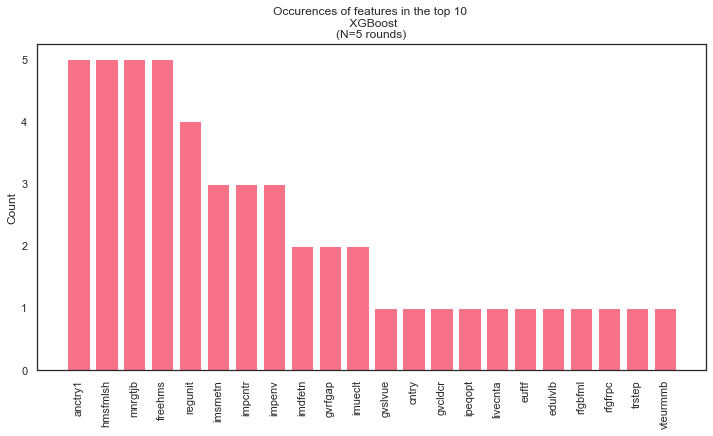

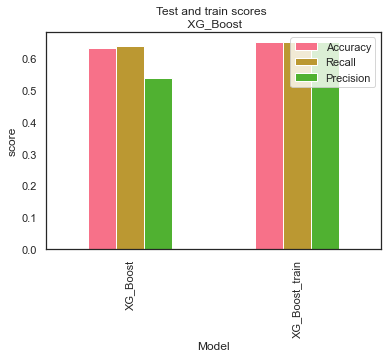

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.631624  0.636941   0.536354  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.649618  0.649618   0.649684  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8076
Def + Prob not       0.11      0.62      0.19       582

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.76      8077
Def + Prob not       0.10      0.58      0.17       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

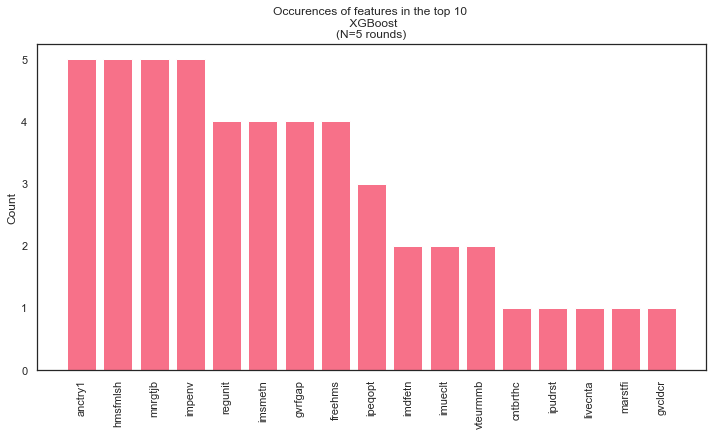

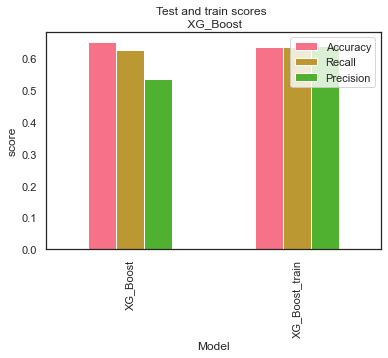

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.651213  0.625737   0.534376  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.637513  0.637513   0.638044  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8076
Def + Prob not       0.11      0.61      0.19       582

      accuracy                           0.65      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.56      0.17       581

      accuracy                           0.64      8658
     macro avg       0.53      0.60      0.47      8

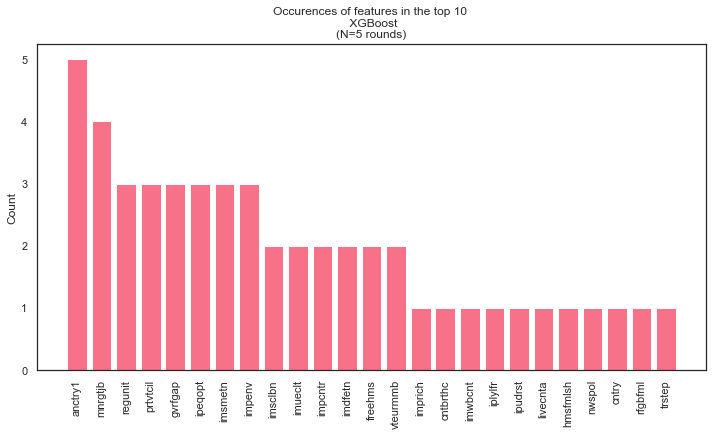

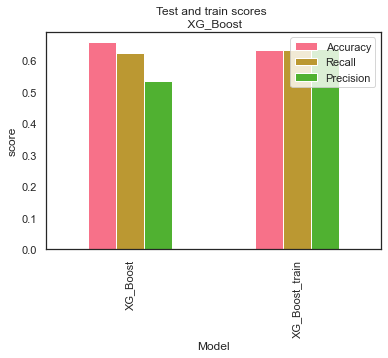

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.657935  0.623169   0.534047  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.634125  0.634125   0.635112  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8076
Def + Prob not       0.11      0.60      0.18       582

      accuracy                           0.64      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.53      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8

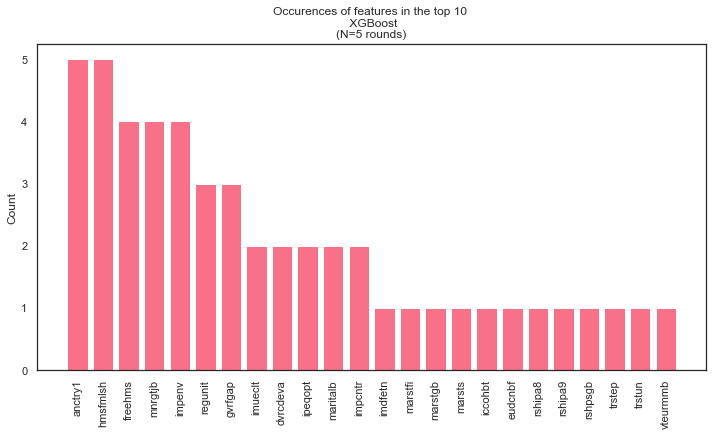

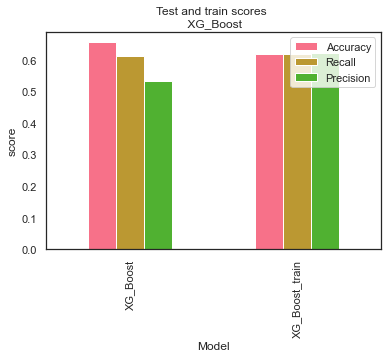

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.655209  0.613128   0.531224  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.619078  0.619078   0.620479  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8076
Def + Prob not       0.11      0.60      0.19       582

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.65      0.77      8077
Def + Prob not       0.10      0.53      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8

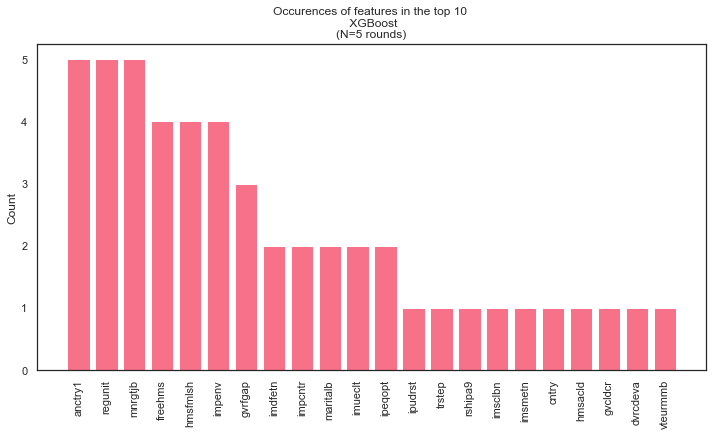

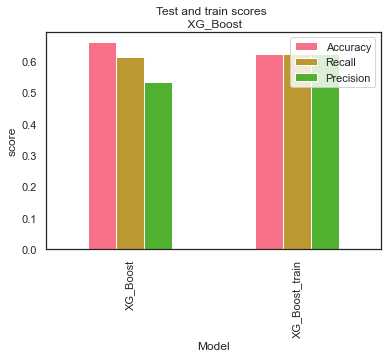

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.659182  0.613626   0.531648  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.620651  0.620651   0.622145  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.75      8077
Def + Prob not       0.11      0.63      0.18       581

      accuracy                           0.62      8658
     macro avg       0.53      0.62      0.47      8

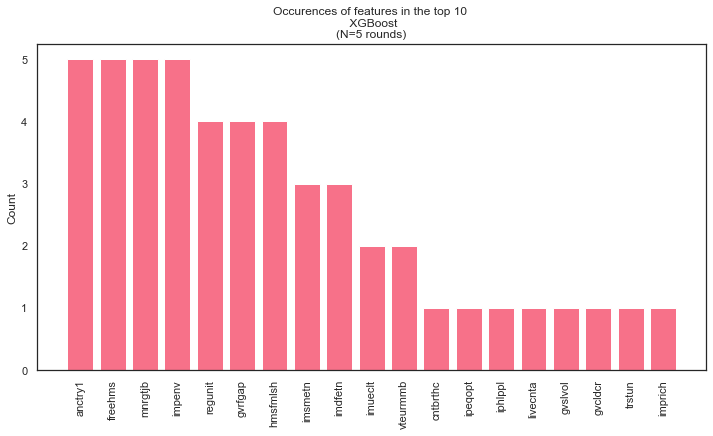

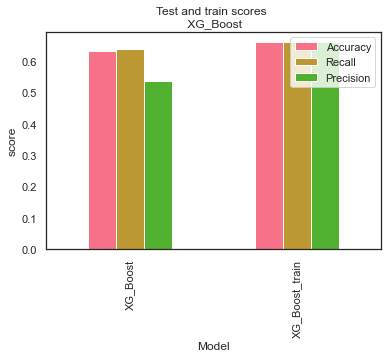

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.631116  0.638306   0.536714  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.658682  0.658682   0.658797  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8076
Def + Prob not       0.11      0.68      0.19       582

      accuracy                           0.62      8658
     macro avg       0.54      0.65      0.47      8658
  weighted avg       0.91      0.62      0.71      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.75      8077
Def + Prob not       0.11      0.66      0.19       581

      accuracy                           0.62      8658
     macro avg       0.54      0.64      0.47      8

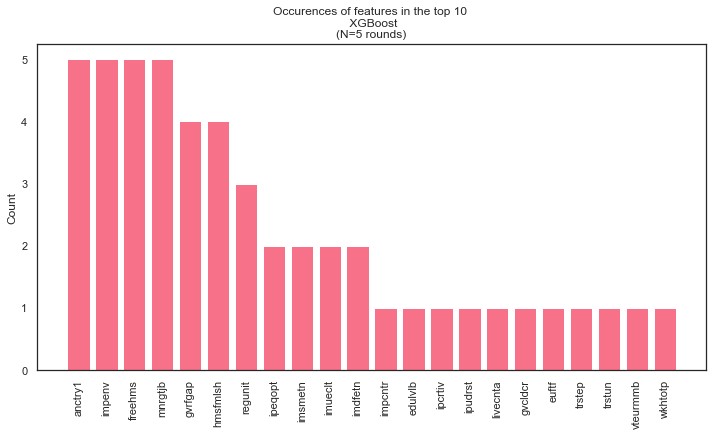

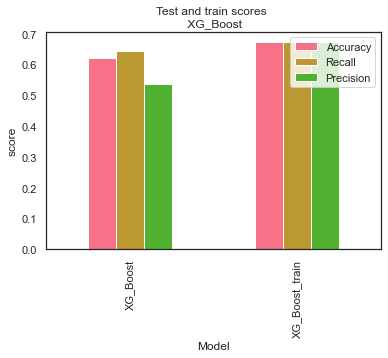

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost   0.62012  0.645312   0.538042  [5, 12, 19, 26, 33]
1  XG_Boost_train   0.67177  0.671770   0.672305  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.63      0.19       582

      accuracy                           0.63      8658
     macro avg       0.53      0.63      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.76      8077
Def + Prob not       0.10      0.59      0.18       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

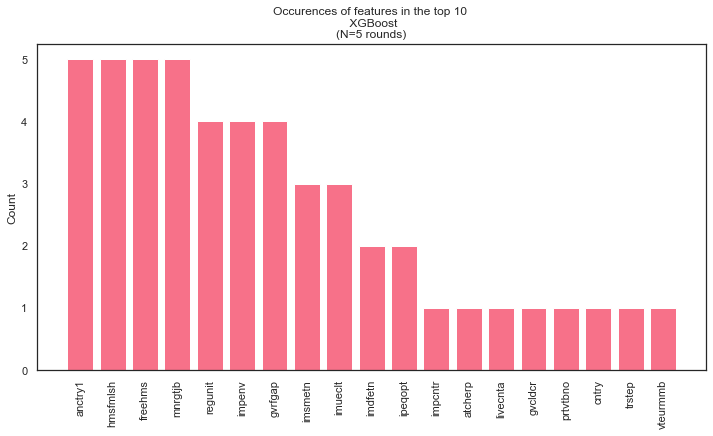

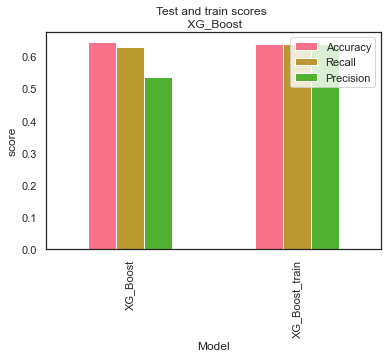

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.643428  0.627577   0.534451  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.638840  0.638840   0.639040  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8076
Def + Prob not       0.11      0.60      0.18       582

      accuracy                           0.64      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.66      0.78      8077
Def + Prob not       0.10      0.52      0.16       581

      accuracy                           0.65      8658
     macro avg       0.52      0.59      0.47      8

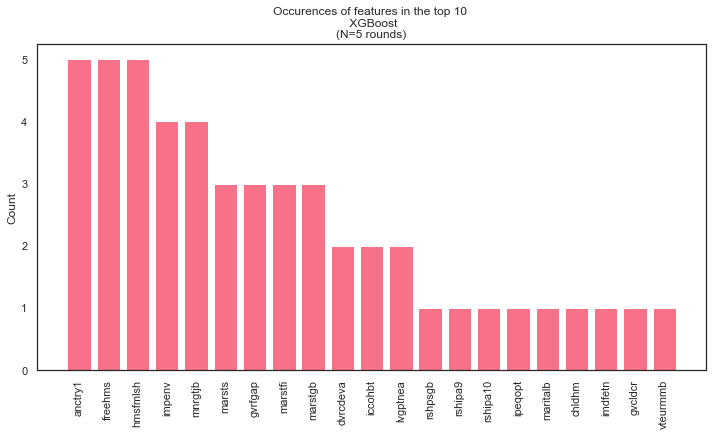

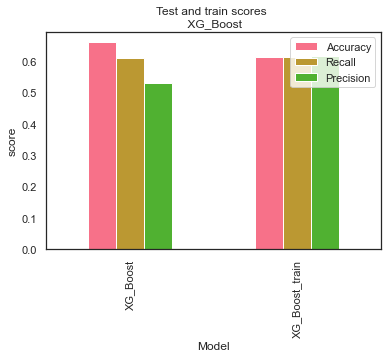

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.659067  0.609352   0.530660  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.612572  0.612572   0.614574  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8076
Def + Prob not       0.11      0.60      0.18       582

      accuracy                           0.64      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.55      0.17       581

      accuracy                           0.64      8658
     macro avg       0.53      0.59      0.47      8

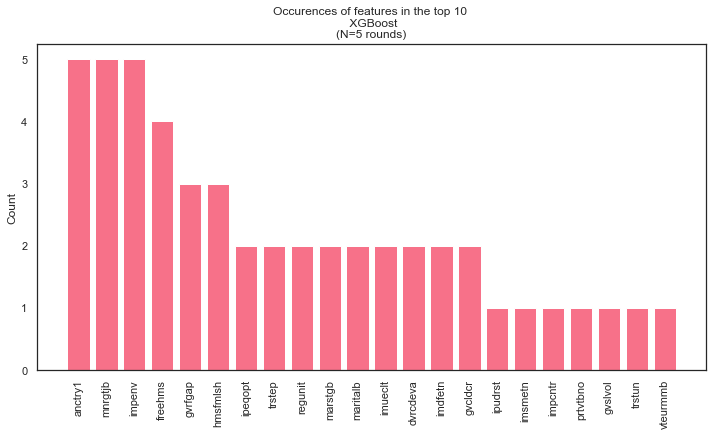

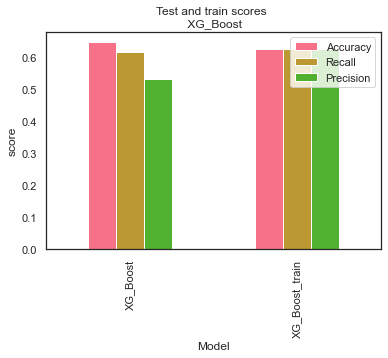

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.646685  0.616467   0.531783  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.624173  0.624173   0.624995  [5, 12, 19, 26, 33]


In [250]:
#try them all
keep_score_duo2 =[]
keep_feat_duo2 = []

for i in range(len(top_hyperparams_duo2)):
    a  = pd.Series.to_dict(top_hyperparams_duo2.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score_duo2, feat_duo2 = XG_Boost_duo(X_noclimate, y_duo, random_states, True, top_lr_duo2, a)  
    print(score_duo2)
    keep_score_duo2.append(score_duo2)
    keep_feat_duo2.append(feat_duo2)

In [261]:
acc_test = []
acc_train = []

for i in range(len(keep_score_duo2)):
    a = keep_score_duo2[i]
    acc_test.append(a["Accuracy"][0])
    acc_train.append(a["Accuracy"][1])

In [279]:
outcomes = pd.DataFrame(zip(acc_test,acc_train), columns=["test", "train"])
outcomes["difference "] = abs(outcomes["test"] - outcomes["train"])

In [280]:
outcomes.sort_values("test", ascending=False)

,test,train,difference
4,0.659182,0.620651,0.038531
8,0.659067,0.612572,0.046495
2,0.657935,0.634125,0.023810
3,0.655209,0.619078,0.036131
1,0.651213,0.637513,0.013699
9,0.646685,0.624173,0.022512
7,0.643428,0.638840,0.004589
0,0.631624,0.649618,0.017994
5,0.631116,0.658682,0.027567
6,0.620120,0.671770,0.051650


In [285]:
#choose the max (located at index 4)
top_param_duo2 = top_hyperparams_duo2.iloc[4,:] #select hyperparam-combination
top_param_duo2 = top_param_duo2.to_dict() #put into dict
top_param_duo2["max_depth"] = int(top_param_duo2["max_depth"]) #change float to int
top_param_duo2

{'colsample_bytree': 0.7336946124113521,
 'min_child_weight': 7.0,
 'reg_alpha': 167.0,
 'gamma': 6.953053380295839,
 'max_depth': 11,
 'reg_lambda': 0.31380107476280417}

4678 4678
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 0 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.76      8057
Def + Prob not       0.11      0.57      0.18       601

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8658
  weighted avg       0.89      0.63      0.72      8658
 

4702 4702
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 1 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.58      0.72      8069
Def + Prob not       0.10      0.65      0.18       589

      accuracy                           0.59      8658
     macro avg       0.53      0.62      0.45      8658
  weighted avg       0.90      0.59      0.69      8658
 

4750 4750
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 2 
                 precision    recall  f1-score   support

    De

Random state: 17 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8087
Def + Prob not       0.11      0.64      0.19       571

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.91      0.63      0.72      8658
 

4698 4698
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 18 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8067
Def + Prob not       0.11      0.63      0.18       591

      accuracy                           0.62      8658
     macro avg       0.53      0.62      0.47      8658
  weighted avg       0.90      0.62      0.71      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.72      0.82      8079
Def + Prob not

4708 4708
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 35 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.74      8072
Def + Prob not       0.10      0.63      0.18       586

      accuracy                           0.61      8658
     macro avg       0.53      0.62      0.46      8658
  weighted avg       0.90      0.61      0.70      8658
 

4646 4646
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 36 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.76      8041
Def + Prob not       0.11      0.59      0.19       617

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8658
  weighted avg       0.89      0.63      0.72      8658
 

4624 4624
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 37 
                 precision    recall  f1-score   support

   

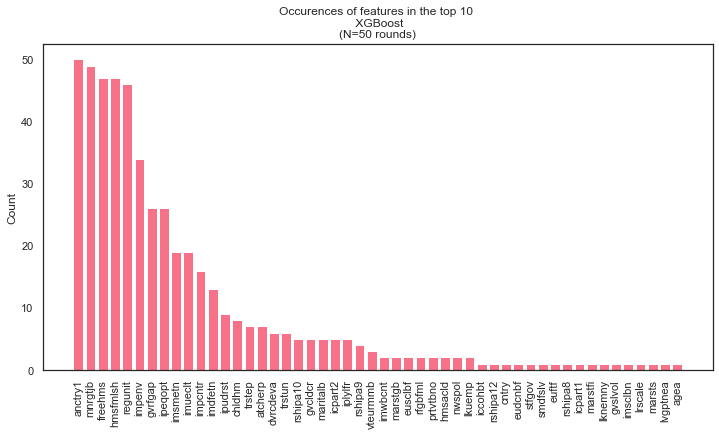

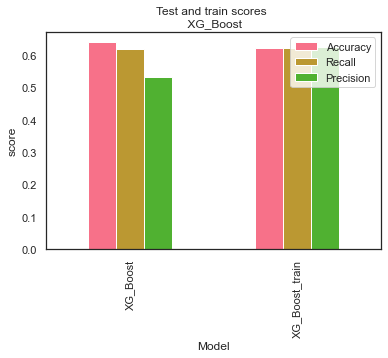

In [287]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo2_scores, duo2_feats = XG_Boost_duo(X_noclimate, y_duo, random_states_many, True, top_lr_duo2, top_param_duo2)

In [369]:
duo2_scores #Almost no difference in accuracy with other learning rate. (see cell below). I'll just continue with this 0.0388 one.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.639561,0.618483,0.532307,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.622771,0.622771,0.623352,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [368]:
duo_scores

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.633333,0.630431,0.535064,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.640584,0.640584,0.640704,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


## Find important features

In [302]:
mean_imp2 = get_fullname(duo2_feats, metadata).sort_values(by="importance", ascending=False)
mean_imp2

,indices,importance,shorthand,full_text
1,316,0.156241,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
22,92,0.123542,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
39,340,0.117990,regunit,Regional unit
36,87,0.113683,mnrgtjb,Men should have more right to job than women when jobs are scarce
11,142,0.108913,gvrfgap,Government should be generous judging applications for refugee status
27,325,0.107417,ipudrst,Important to understand different people
49,184,0.106857,vteurmmb,Would vote for [country] to remain member of European Union or leave
25,320,0.105451,ipeqopt,Important that people are treated equally and have equal opportunities
20,336,0.102920,impenv,Important to care for nature and environment
2,107,0.101330,atcherp,How emotionally attached to Europe


In [318]:
# features popping op that have mean importance of 0, merge with counts and see if they pop up often

In [311]:
count_imp2 = duo2_feats.groupby("feature").count().sort_values(by="importance", ascending=False).reset_index()
count_imp2 = count_imp2.drop(["importance", "model"], axis=1)

In [315]:
count_imp2.columns = ["feature", "count"]

In [317]:
count_imp2.head()

,feature,count
0,anctry1,50
1,mnrgtjb,49
2,freehms,47
3,hmsfmlsh,47
4,regunit,46


In [320]:
imp2 = mean_imp2.merge(count_imp2, left_on="shorthand", right_on='feature')

In [323]:
imp2.columns

Index(['indices', 'importance', 'shorthand', 'full_text', 'feature', 'count'], dtype='object')

In [333]:
#change columns around for better view
imp2 = imp2[['indices', 'importance', 'count', 'shorthand', 'full_text', 'feature']]

#sort by count
imp2 = imp2.sort_values(by="count", ascending=False)

#highlight importance of 0
imp2.style.highlight_min(color='pink', subset=['importance'])

,indices,importance,count,shorthand,full_text,feature
0,316,0.156241,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.113683,49,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
12,88,0.099149,47,freehms,Gays and lesbians free to live life as they wish,freehms
13,89,0.096299,47,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
2,340,0.117990,46,regunit,Regional unit,regunit
8,336,0.102920,34,impenv,Important to care for nature and environment,impenv
4,142,0.108913,26,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
7,320,0.105451,26,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
1,92,0.123542,19,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn
15,96,0.095065,19,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


The mean_importance of zero do not occur very frequently (as makes sense). drop those.

In [335]:
imp2 = imp2[imp2["importance"] != 0]

,indices,importance,count,shorthand,full_text,feature
33,0,0.041654,1,cntry,Country,cntry
32,180,0.055103,2,eusclbf,Against or In favour of European Union-wide social benefit scheme,eusclbf
31,94,0.055507,16,impcntr,Allow many/few immigrants from poorer countries outside Europe,impcntr
30,82,0.064331,1,stfgov,How satisfied with the national government,stfgov
29,146,0.068287,1,smdfslv,"For fair society, differences in standard of living should be small",smdfslv
28,159,0.071282,1,imsclbn,When should immigrants obtain rights to social benefits/services,imsclbn
27,90,0.081184,2,hmsacld,Gay and lesbian couples right to adopt children,hmsacld
26,40,0.081681,2,prtvtbno,"Party voted for in last national election, Norway",prtvtbno
25,150,0.083093,1,gvslvol,"Standard of living for the old, governments' responsibility",gvslvol
24,335,0.083494,5,iplylfr,Important to be loyal to friends and devote to people close,iplylfr


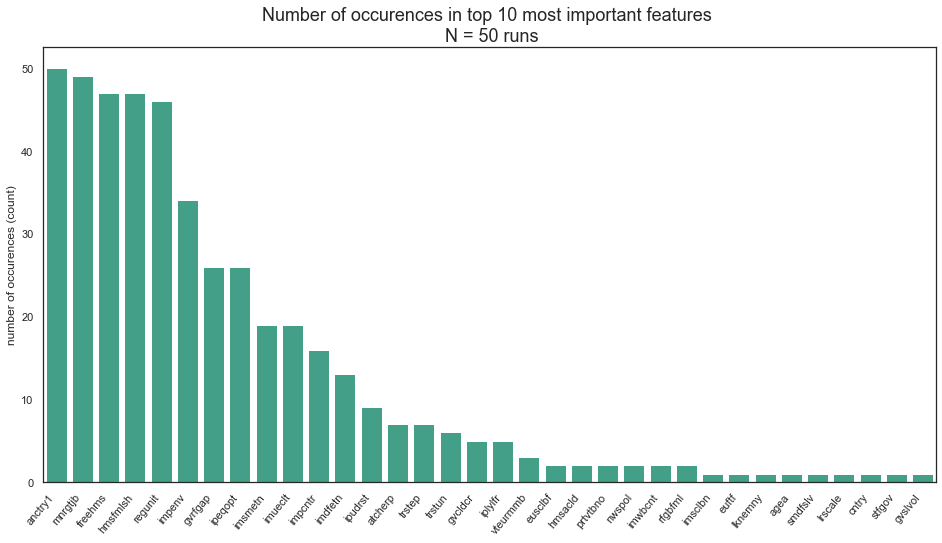

In [354]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", color=sns.color_palette("husl", 9)[4])
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.savefig('./figures/importance_count.png', dpi=360)
plt.show();

#very clear top5 features

In [425]:
imp2.sort_values(by="count", ascending=False)

,indices,importance,count,shorthand,full_text,feature
0,316,0.156241,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.113683,49,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
12,88,0.099149,47,freehms,Gays and lesbians free to live life as they wish,freehms
13,89,0.096299,47,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
2,340,0.117990,46,regunit,Regional unit,regunit
8,336,0.102920,34,impenv,Important to care for nature and environment,impenv
4,142,0.108913,26,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
7,320,0.105451,26,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
1,92,0.123542,19,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn
15,96,0.095065,19,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


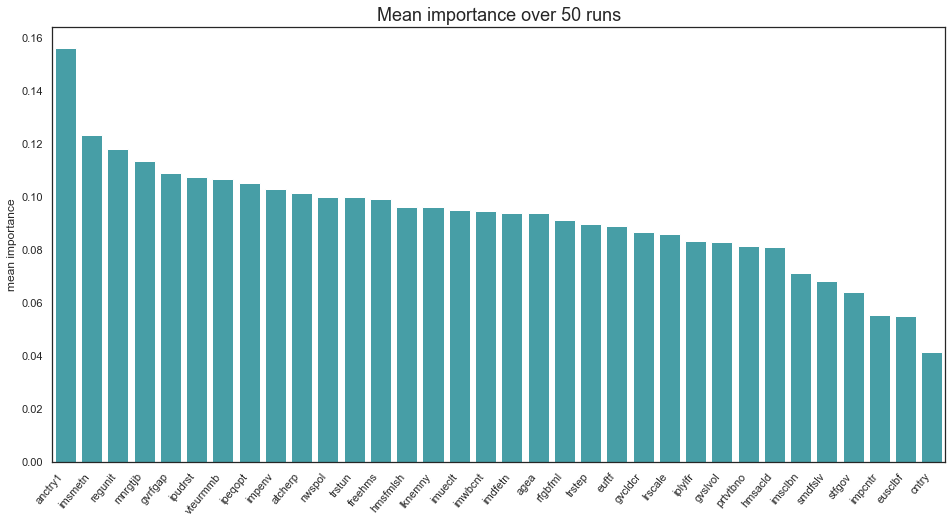

In [357]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2.sort_values(by="importance", ascending=False), x="shorthand", y="importance", color=sns.color_palette("husl", 9)[5])
plt.title("Mean importance over 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("mean importance")
plt.savefig('./figures/importance_mean.png', dpi=360)
plt.show();

#first is clear, rest is more of a blur

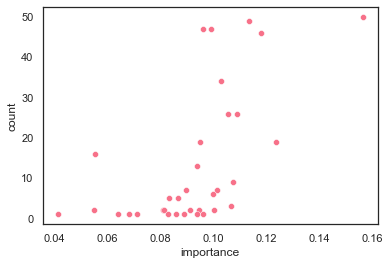

In [340]:
sns.scatterplot(data=imp2, x="importance", y="count");

## Use fewer features
check if model performs better when X is smaller (noise reduction)

In [464]:
#create some X's

#select featurenames to include
cols_forty = list(imp2.shorthand[imp2["count"] >= 40])
print(cols_forty)
cols_twfive = list(imp2.shorthand[imp2["count"] >= 25])
print(cols_twfive)
cols_fifteen = list(imp2.shorthand[imp2["count"] >= 15])
print(cols_fifteen)
cols_ten = list(imp2.shorthand[imp2["count"] >= 10])
print(cols_ten)
cols_one = list(imp2.shorthand)
print(cols_one)

['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn', 'imueclt', 'impcntr']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn', 'imueclt', 'impcntr', 'imdfetn']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn', 'imueclt', 'impcntr', 'imdfetn', 'ipudrst', 'atcherp', 'trstep', 'trstun', 'gvcldcr', 'iplylfr', 'vteurmmb', 'eusclbf', 'hmsacld', 'prtvtbno', 'nwspol', 'imwbcnt', 'rfgbfml', 'imsclbn', 'euftf', 'lknemny', 'agea', 'smdfslv', 'lrscale', 'cntry', 'stfgov', 'gvslvol']


In [465]:
X_forty = X_noclimate[cols_forty]
X_twfive = X_noclimate[cols_twfive]
X_fifteen = X_noclimate[cols_fifteen]
X_ten = X_noclimate[cols_ten]
X_one = X_noclimate[cols_one]

4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.76      8076
Def + Prob not       0.11      0.62      0.18       582

      accuracy                           0.63      8658
     macro avg       0.53      0.63      0.47      8658
  weighted avg       0.90      0.63      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.63      0.76      8077
Def + Prob not       0.10      0.55      0.16       581

      accuracy                           0.62      8658
     macro avg       0.52      0.59      0.46      8658
  weighted avg       0.89      0.62      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

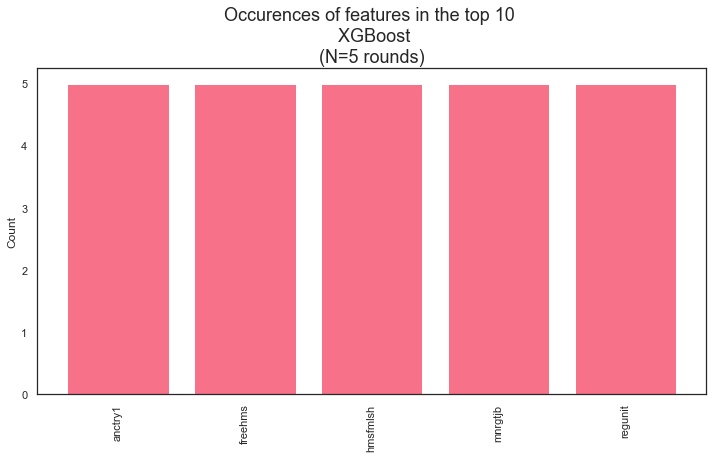

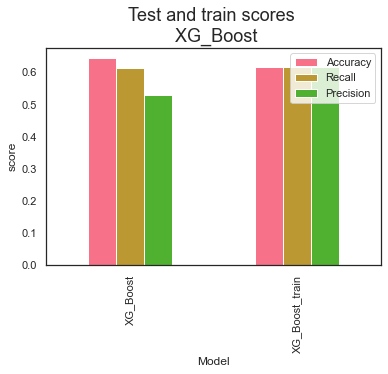

In [443]:
score_forty, feat_forty = XG_Boost_duo(X_forty, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [445]:
score_forty

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.643451,0.611545,0.530332,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.616513,0.616513,0.617254,"[5, 12, 19, 26, 33]"


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.63      0.19       582

      accuracy                           0.63      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.63      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.76      8077
Def + Prob not       0.10      0.54      0.17       581

      accuracy                           0.63      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.63      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

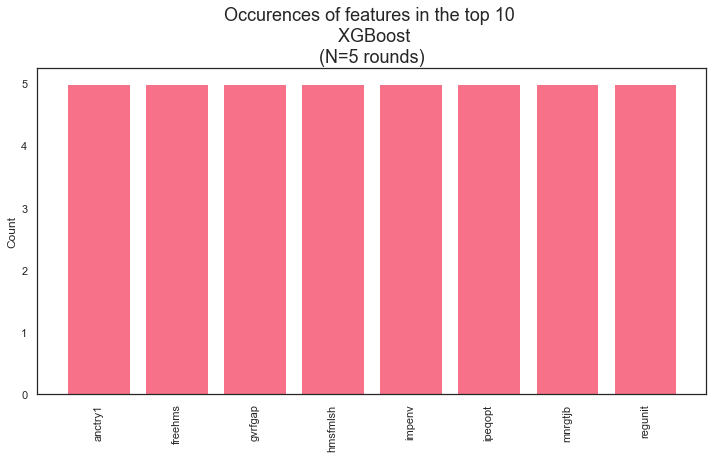

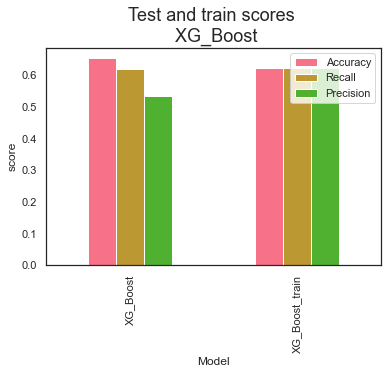

In [448]:
score_twfive, feat_twfive = XG_Boost_duo(X_twfive, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [449]:
score_twfive

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.652922,0.618260,0.532525,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.622395,0.622395,0.623497,"[5, 12, 19, 26, 33]"


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.64      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.65      0.77      8077
Def + Prob not       0.10      0.52      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.64      0.73      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

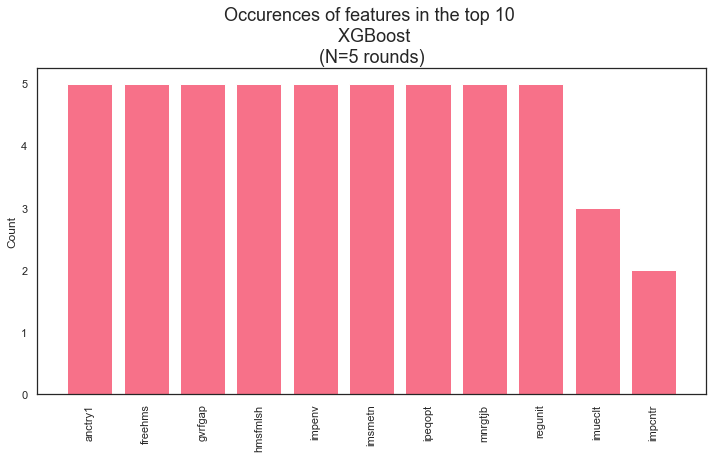

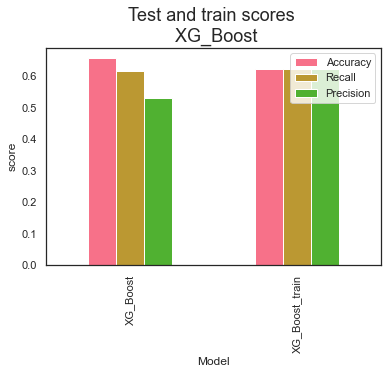

In [466]:
score_fifteen, feat_fifteen = XG_Boost_duo(X_fifteen, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [467]:
score_fifteen

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.656872,0.616079,0.532122,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.622264,0.622264,0.623585,"[5, 12, 19, 26, 33]"


In [468]:
print(cols_twfive)
print(cols_fifteen)

['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn', 'imueclt', 'impcntr']


In [469]:
cols_twfa = ['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn']
cols_twfb = ['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn','imueclt']
X_twfa = X_noclimate[cols_twfa]
X_twfb = X_noclimate[cols_twfb]

4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.63      0.19       582

      accuracy                           0.63      8658
     macro avg       0.53      0.63      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.65      0.77      8077
Def + Prob not       0.10      0.53      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.64      0.73      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

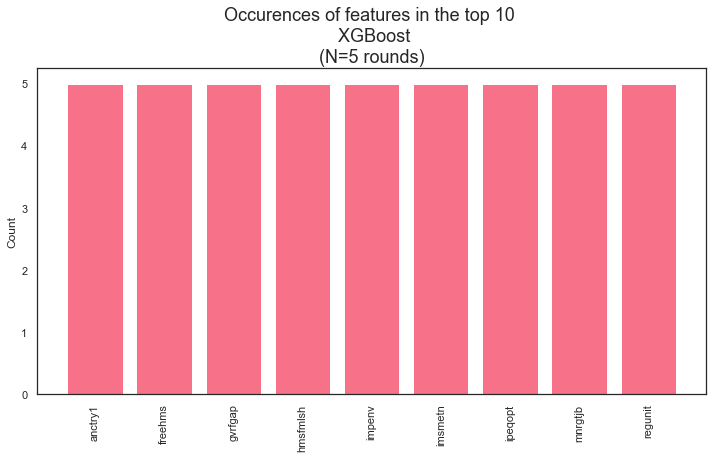

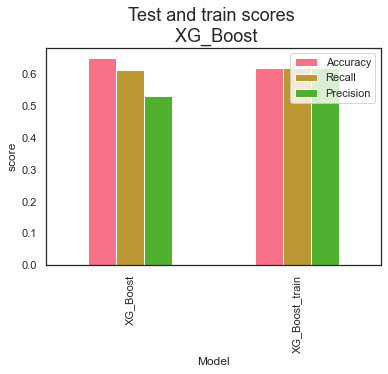

In [471]:
score_twfa, feat_twfa,= XG_Boost_duo(X_twfa, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [473]:
score_twfa

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.648348,0.612876,0.530999,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.618174,0.618174,0.619255,"[5, 12, 19, 26, 33]"


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.63      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.65      0.77      8077
Def + Prob not       0.10      0.53      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.64      0.73      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

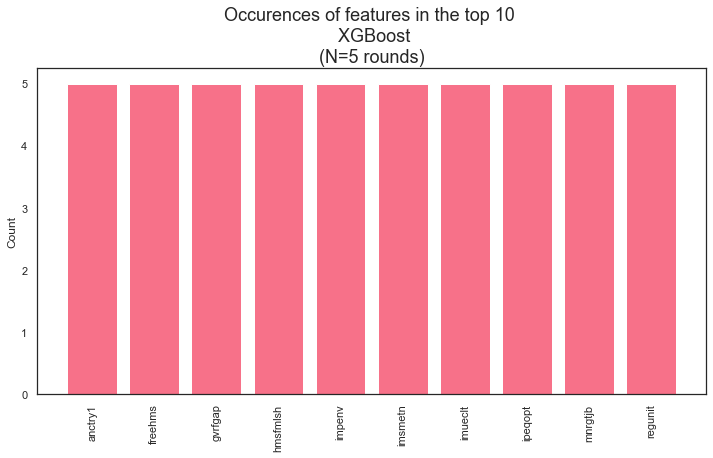

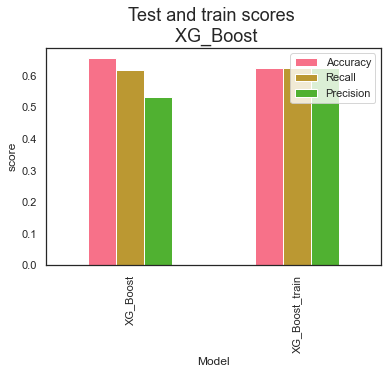

In [470]:
score_twfb, feat_twfb = XG_Boost_duo(X_twfb, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [472]:
score_twfb

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.654793,0.616282,0.532024,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.622271,0.622271,0.623359,"[5, 12, 19, 26, 33]"


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.64      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.54      0.17       581

      accuracy                           0.63      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.63      0.73      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

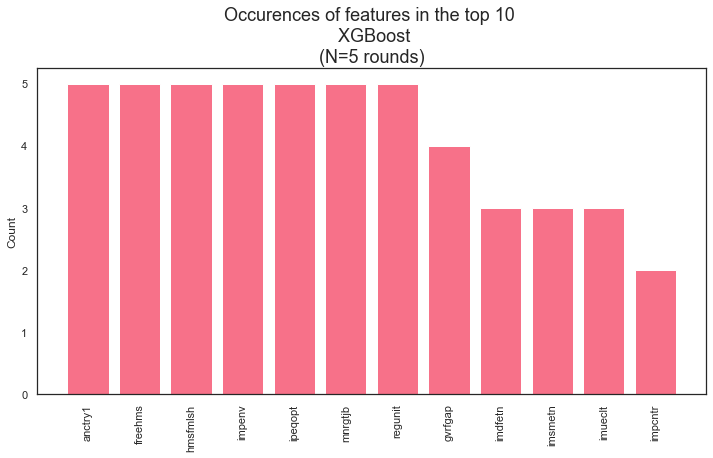

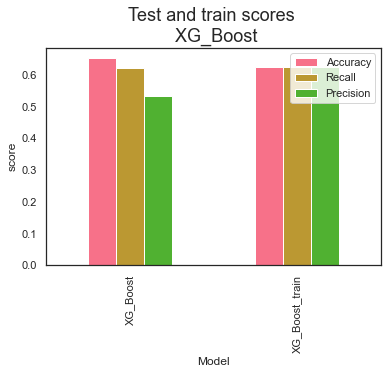

In [444]:
score_ten, feat_ten = XG_Boost_duo(X_ten, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [447]:
score_ten

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.651559,0.619221,0.532652,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.624545,0.624545,0.625372,"[5, 12, 19, 26, 33]"


4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8076
Def + Prob not       0.11      0.60      0.19       582

      accuracy                           0.64      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.65      0.77      8077
Def + Prob not       0.10      0.53      0.16       581

      accuracy                           0.64      8658
     macro avg       0.52      0.59      0.47      8658
  weighted avg       0.89      0.64      0.73      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

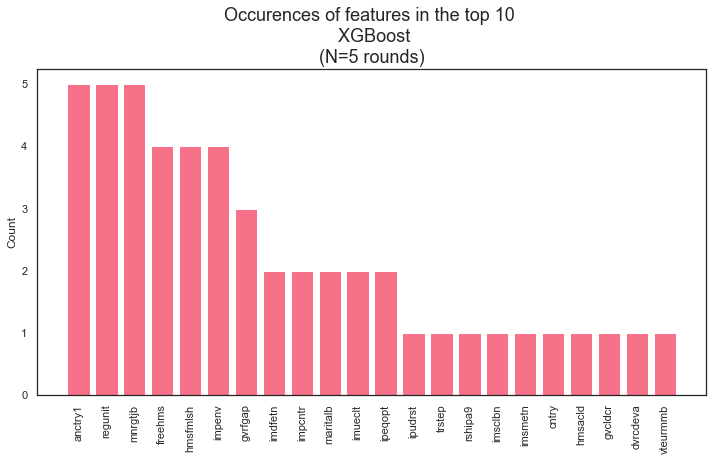

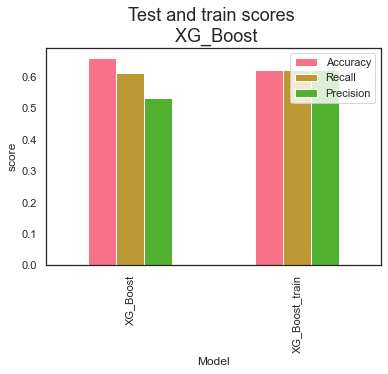

In [451]:
score_orig, feat_orig = XG_Boost_duo(X_noclimate, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [452]:
score_orig

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.659182,0.613626,0.531648,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.620651,0.620651,0.622145,"[5, 12, 19, 26, 33]"


### Tune learning rate

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Learning rate: 0.0 
                 precision    recall  f1-score   support

    Def + Prob       0.93      1.00      0.97      8078
Def + Prob not       0.00      0.00      0.00       580

      accuracy                           0.93      8658
     macro avg       0.47      0.50      0.48      8658
  weighted avg       0.87      0.93      0.90      8658
 

4720 4720
Learning rate: 0.0001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.64      8658
     macro avg       0.53      0.62      0.47      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8078
Def + Prob not       0.11      0.61      0.18       580

      accuracy                           0.63      8658
   

Learning rate: 0.0019 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.66      0.78      8078
Def + Prob not       0.11      0.59      0.18       580

      accuracy                           0.65      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.59      0.18       580

      accuracy                           0.65      8658
     macro avg       0.53      0.62      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0021000000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.59      0.18       580

      accuracy                           0

Learning rate: 0.0038 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.60      0.19       580

      accuracy                           0.65      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0039000000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.11      0.61      0.19       580

      accuracy                           0.65      8658
     macro avg       0.53      0.63      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.61      0.19       580

      accuracy                           0

Learning rate: 0.0057 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.62      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0058000000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.62      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.63      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0059 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.62      0.19       580

      accuracy                           

Learning rate: 0.0076 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0077 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0078000000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           

Learning rate: 0.0095 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.65      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.009600000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0097 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0

Learning rate: 0.0114 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0115 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.011600000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0

Learning rate: 0.013300000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0134 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0135 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.67      0.20       580

      accuracy                           0

Learning rate: 0.0152 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.015300000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0154 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.67      0.20       580

      accuracy                           0

Learning rate: 0.0171 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0172 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0173 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658


Learning rate: 0.019100000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.019200000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0193 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy              

Learning rate: 0.021 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0211 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0212 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
 

Learning rate: 0.0229 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.67      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.023 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.67      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.023100000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.

Learning rate: 0.024800000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.024900000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.025 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy               

Learning rate: 0.0267 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0268 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0269 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658


4720 4720
Learning rate: 0.0286 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0287 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.028800000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.65      0.20       580

      accuracy                  

Learning rate: 0.030500000000000003 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.030600000000000002 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0307 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy              

Learning rate: 0.0324 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0325 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.032600000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0

Learning rate: 0.0344 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0345 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0346 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658


Learning rate: 0.0364 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.036500000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0366 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.67      0.20       580

      accuracy                           0

Learning rate: 0.0383 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.038400000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0385 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0

Learning rate: 0.0402 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0403 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.040400000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0

Learning rate: 0.042100000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0422 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.042300000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy              

Learning rate: 0.044000000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0441 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0442 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0

Learning rate: 0.0459 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.046 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0461 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658
 

Learning rate: 0.0478 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.047900000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.048 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.

Learning rate: 0.0497 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.049800000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0499 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0

Learning rate: 0.0516 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0517 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.051800000000000006 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0

Learning rate: 0.053500000000000006 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0536 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.053700000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy              

Learning rate: 0.055400000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0555 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.055600000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy              

Learning rate: 0.057300000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0574 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0575 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0

Learning rate: 0.0592 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.059300000000000005 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0594 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0

Learning rate: 0.0611 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.061200000000000004 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0613 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0

Learning rate: 0.063 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0631 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0632 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.64      8658
 

Learning rate: 0.0649 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.065 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0651 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
 

Learning rate: 0.0669 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.067 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0671 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
 

Learning rate: 0.0688 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0689 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.069 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
 

Learning rate: 0.0707 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0708 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0709 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658


Learning rate: 0.0727 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0728 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0729 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658


Learning rate: 0.0746 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0747 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0748 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.19       580

      accuracy                           0.65      8658


Learning rate: 0.0766 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0767 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.07680000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.

Learning rate: 0.0785 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0786 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0787 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.66      0.20       580

      accuracy                           0.64      8658


Learning rate: 0.0804 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0805 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.64      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0806 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658


Learning rate: 0.0823 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0824 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0825 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658


Learning rate: 0.08420000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0843 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0844 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.

Learning rate: 0.08610000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0862 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0863 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.

Learning rate: 0.08800000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0881 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.0882 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.

Learning rate: 0.08990000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.09000000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0901 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                

Learning rate: 0.0918 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.09190000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.092 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.6

Learning rate: 0.0937 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.09380000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.09390000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.63      0.19       580

      accuracy                

Learning rate: 0.0956 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.09570000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4720 4720
Learning rate: 0.09580000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                

Learning rate: 0.0975 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.65      0.73      8658
 

4720 4720
Learning rate: 0.0976 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8078
Def + Prob not       0.12      0.64      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.74      8658
 

4720 4720
Learning rate: 0.09770000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.

Learning rate: 0.0994 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.11      0.64      0.19       580

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4720 4720
Learning rate: 0.0995 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.65      8658
     macro avg       0.54      0.65      0.49      8658
  weighted avg       0.91      0.65      0.73      8658
 

4720 4720
Learning rate: 0.09960000000000001 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.77      8078
Def + Prob not       0.12      0.65      0.20       580

      accuracy                           0.

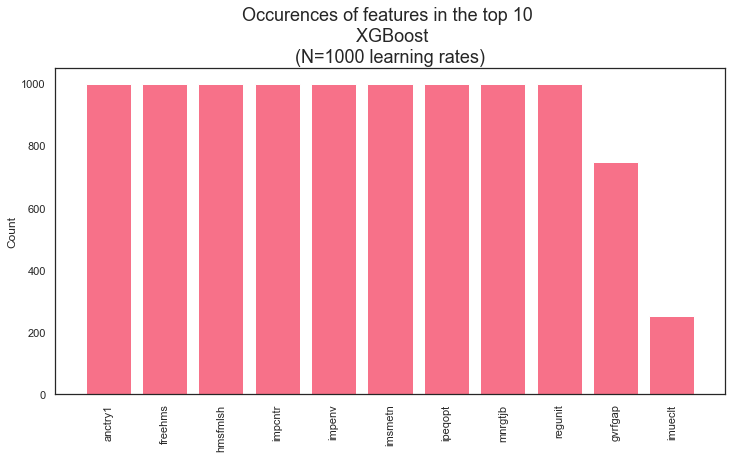

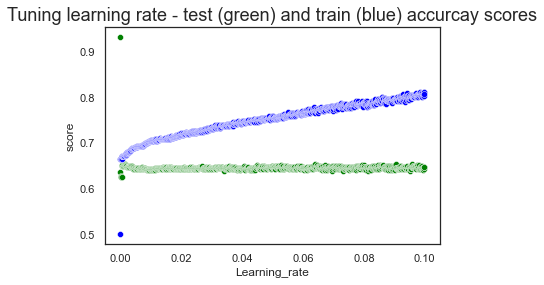

In [495]:
learning_rates=np.arange(0,0.1,0.0001)
scores_fifteen, feat_fifteen = tune_learning_duo(X_fifteen, y_duo, 7, True, learning_rates, empty_dict)

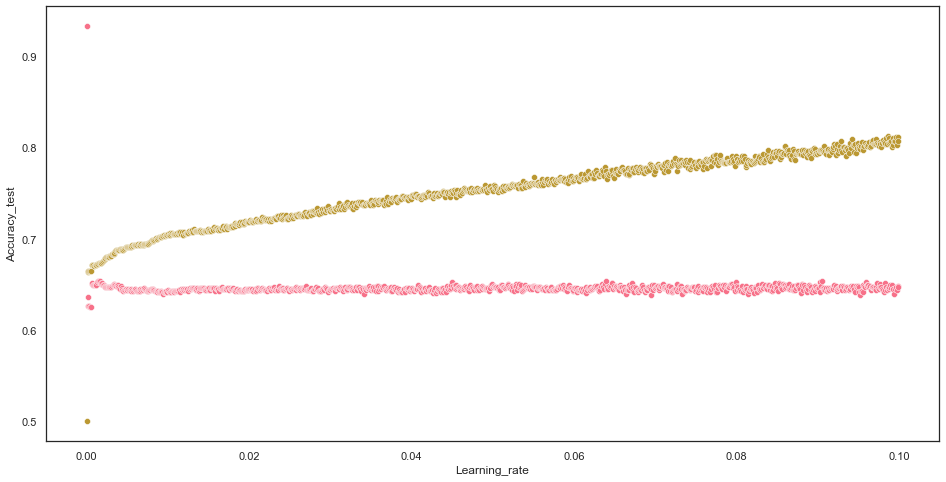

In [498]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [499]:
scores_fifteen.sort_values(by="Accuracy_test", ascending=False)

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000
905,0.654193,0.649846,0.540399,0.797034,0.797034,0.798337,0.0905
16,0.653846,0.619254,0.532480,0.673093,0.673093,0.673731,0.0016
15,0.653846,0.619254,0.532480,0.673093,0.673093,0.673713,0.0015
14,0.653731,0.619992,0.532667,0.672458,0.672458,0.673067,0.0014
639,0.653384,0.651814,0.540858,0.774364,0.774364,0.775404,0.0639
959,0.653153,0.645288,0.539175,0.802542,0.802542,0.803803,0.0959
902,0.653038,0.648427,0.539973,0.796610,0.796610,0.798157,0.0902
13,0.652807,0.621098,0.532911,0.672669,0.672669,0.673203,0.0013
799,0.652576,0.653781,0.541317,0.790678,0.790678,0.792158,0.0799


In [501]:
top_lr_fifteen = scores_fifteen.loc[905, "Learning_rate"]
top_lr_fifteen

0.09050000000000001

In [524]:
# tune hyperparams
def objective_fifteen(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """
    #NOTE: INSERT top learning rate! 0.0905
    
    clf=xgb.XGBClassifier(learning_rate = 0.0905, n_estimators = space['n_estimators'], 
                          max_depth = int(space['max_depth']), gamma = space['gamma'],
                          reg_alpha = int(space['reg_alpha']), min_child_weight=int(space['min_child_weight']),
                          colsample_bytree = int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    clf.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

### Tune hyperparams

In [528]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [535]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective_fifteen, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:51,  1.92trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:51,  1.92trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:46,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:43,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:44,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:44,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:41,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:38,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:41,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:38,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 11%|█████▏                                         | 11/100 [00:04<00:40,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:42,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:43,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:42,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:39,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:36,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:34,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:37,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:35,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:33,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:32,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:30,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:30,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:30,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:28,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:28,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:15<00:30,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:26,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:26,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:25,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:24,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:18<00:24,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:19<00:27,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:24,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:24,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:21<00:23,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:22<00:24,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:24,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:24<00:23,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:21,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:21,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:20,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:20,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:31,  1.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:29<00:28,  1.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:24,  1.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:21,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:30<00:20,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:20,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:18,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:17,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:13,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:13,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:11,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:11,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:10,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:09,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:08,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:05,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:05,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:02,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:36,  2.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:37,  2.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:42,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:45,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:42,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:39,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:39,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:42,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:44,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:41,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:04<00:39,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:37,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:05<00:36,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:35,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:34,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:06<00:33,  2.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:32,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:07<00:35,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:34,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:08<00:32,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:32,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 22%|██████████▎                                    | 22/100 [00:09<00:36,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:34,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:34,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:11<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:35,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:11<00:34,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:32,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:32,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:35,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:34,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:32,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:30,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:17<00:33,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:17<00:35,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:33,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:30,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5986370986370987                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:32,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:29,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:30,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:28,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:25,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:22,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:24,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:22,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:21,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:21,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:20,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:19,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:19,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:27<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:19,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:18,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:17,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:30<00:16,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:16,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:15,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:15,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:32<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:32<00:17,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:15,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:13,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:14,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:12,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:11,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:11,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:05,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:02,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6215061215061215                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:43,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:46,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:43,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:45,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:42,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5954030954030954                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:45,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:46,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:47,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:44,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:44,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:38,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:36,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:38,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:40,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:37,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:36,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:35,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:33,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:33,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:32,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:30,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:30,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:29,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:15<00:32,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:31,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:28,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:27,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:29,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:28,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:26,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:25,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:25,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:24,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:23,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:23,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:22,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:22,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:23<00:24,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:25,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:24<00:26,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:24,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:22,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:20,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5997920997920998                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:27<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:20,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:28<00:21,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:18,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:30<00:18,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:17,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:31<00:16,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:16,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:13,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:12,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:10,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:08,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:04,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:37,  2.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:39,  2.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:42,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:47,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:44,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:42,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:41,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:44,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6056826056826057                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:47,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:41,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:36,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:35,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5973665973665974                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:39,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:41,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:41,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:38,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:10<00:40,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:38,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:36,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 25%|███████████▊                                   | 25/100 [00:11<00:38,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:36,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:34,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:13<00:36,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:32,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:16<00:33,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:31,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:31,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:18<00:32,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:30,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:32,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:30,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:28,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:29,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:28,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:26,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:24,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:23<00:26,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 49%|███████████████████████                        | 49/100 [00:23<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:25<00:26,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:26<00:26,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:27<00:24,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:23,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:21,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:19,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:17,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:17,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:32<00:18,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:16,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:15,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:34<00:16,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:16,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:14,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:13,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:11,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:12,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:10,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:07,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:07,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:06,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:06,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:45<00:05,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:05,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:46<00:04,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:48<00:02,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:48<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5954030954030954                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:49<00:01,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:50<00:00,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:58,  1.69trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:57,  1.70trial/s, best loss: -0.6089166089166089]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:53,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:48,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:46,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:48,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:45,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:48,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:44,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:41,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:39,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:37,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:40,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:42,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6033726033726033                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:44,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:44,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:41,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:39,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:36,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:35,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:34,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:33,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:32,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 30%|██████████████                                 | 30/100 [00:14<00:36,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:15<00:37,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:35,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:16<00:37,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:17<00:34,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:32,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:31,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:30,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:28,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:27,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:25,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:23<00:27,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:25,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 49%|███████████████████████                        | 49/100 [00:24<00:27,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:24,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:26<00:24,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:22,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:28<00:22,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:21,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:29<00:20,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:21,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:30<00:21,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:22,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:22,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:32<00:21,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:33<00:21,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:19,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:34<00:18,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:16,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:35<00:15,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:14,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:14,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:13,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:12,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:11,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:10,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:39<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:09,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:40<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:08,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:06,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:06,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:45<00:04,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:46<00:04,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:48<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:49<00:00,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:02,  1.57trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:56,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:57,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:52,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:53,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:03<00:49,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:46,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:48,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:50,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:50,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:46,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:52,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:47,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:48,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:44,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:41,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:37,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5990990990990991                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:40,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:38,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:37,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:36,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:34,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:33,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:33,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:32,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:15<00:36,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:16<00:37,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:16<00:38,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:17<00:39,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 35%|████████████████▍                              | 35/100 [00:18<00:39,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:36,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:33,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:31,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:30,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:28,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:27,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:27,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:26,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:24<00:28,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:25,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:24,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:26<00:26,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5954030954030954                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:27<00:27,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:27<00:25,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:28<00:23,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:28<00:22,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:22,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:30<00:23,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:30<00:21,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:20,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:31<00:19,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:18,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:32<00:18,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:17,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:33<00:19,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:18,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:34<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:35<00:17,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:35<00:16,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:36<00:14,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:37<00:13,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:38<00:12,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:11,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:39<00:11,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:10,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:40<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:09,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:41<00:09,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:08,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:42<00:09,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:08,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:43<00:08,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:07,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:44<00:06,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:06,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:45<00:05,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:05,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:46<00:04,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:47<00:03,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:47<00:03,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:48<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:49<00:02,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5949410949410949                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:02,  1.57trial/s, best loss: -0.5949410949410949]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:56,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:56,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:52,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:48,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:51,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:48,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:45,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:50,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:52,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:48,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:45,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:43,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:46,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:47,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:41,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:38,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:38,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:37,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:36,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 26%|████████████▏                                  | 26/100 [00:13<00:39,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:38,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:37,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:15<00:40,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.567914067914068                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:42,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:39,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:37,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:17<00:39,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:36,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:34,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:33,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:19<00:36,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:33,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:32,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:31,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:30,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:29,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:22<00:31,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:30,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:28,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:27,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:25<00:29,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:25<00:27,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:25,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:27<00:24,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:27<00:23,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:22,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:28<00:25,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:29<00:26,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:30<00:27,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:30<00:27,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:31<00:24,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:23,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:21,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:32<00:20,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:34<00:18,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:34<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:35<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:16,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:36<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:37<00:15,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:39<00:13,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:13,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:12,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:11,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:42<00:10,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:08,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:08,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:46<00:05,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:06,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:04,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:04,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:51<00:02,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:45,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:45,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:44,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:49,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:47,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:52,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:51,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:53,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:50,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:53,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:06<00:50,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:47,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:45,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:48,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:45,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:45,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:47,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:09<00:45,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:42,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:40,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:41,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:41,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:40,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:39,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:37,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6377916377916378                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:15<00:39,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:15<00:41,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:16<00:43,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:39,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:38,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6127281127281127                                                                                                     
 33%|███████████████▌                               | 33/100 [00:18<00:40,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:37,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:19<00:35,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:33,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:20<00:36,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:33,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:21<00:32,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:31,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:22<00:30,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:29,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:23<00:28,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:28,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:24<00:27,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:25<00:30,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:25<00:28,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:28,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:27<00:25,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:28<00:25,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:28<00:27,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:29<00:25,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:29<00:23,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:30<00:22,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:30<00:21,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:31<00:20,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:31<00:20,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:19,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:32<00:21,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:21,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:20,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:34<00:22,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:35<00:23,  1.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:35<00:21,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:20,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:37<00:19,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:37<00:19,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:38<00:18,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:17,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:39<00:16,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:15,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:40<00:14,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:41<00:13,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:41<00:13,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:42<00:12,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:42<00:12,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:43<00:11,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:43<00:10,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:44<00:09,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:44<00:10,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:45<00:10,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:46<00:10,  1.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:47<00:09,  1.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 86%|████████████████████████████████████████▍      | 86/100 [00:47<00:09,  1.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:48<00:08,  1.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:49<00:08,  1.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:49<00:07,  1.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:50<00:06,  1.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:51<00:05,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:51<00:04,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:51<00:03,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:52<00:03,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:52<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:53<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:54<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:54<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:55<00:00,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:45,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:44,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:49,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:52,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:54,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:55,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:51,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:52,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:48,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:51,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:52,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:48,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:45,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:44,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:44,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:46,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:43,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:41,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 21%|█████████▊                                     | 21/100 [00:11<00:45,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:42,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:40,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:39,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:38,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:14<00:37,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:36,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:35,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:34,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:34,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:16<00:33,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:17<00:36,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:35,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:33,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:32,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:19<00:35,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:33,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:32,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:21<00:35,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:22<00:36,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:22<00:36,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:23<00:36,  1.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:24<00:34,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:24<00:31,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:25<00:29,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:25<00:31,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:26<00:31,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:29,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:27<00:30,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:28<00:28,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:28<00:26,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:29<00:27,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:29<00:28,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:30<00:28,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:31<00:26,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:31<00:26,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:32<00:24,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:32<00:22,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:33<00:21,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:33<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:34<00:19,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:34<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:35<00:20,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:35<00:19,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:36<00:17,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:17,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:37<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:38<00:17,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:38<00:16,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:39<00:16,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:39<00:15,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:40<00:14,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:40<00:13,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:41<00:14,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:41<00:13,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:42<00:13,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:43<00:12,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:43<00:12,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:44<00:11,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:44<00:10,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:45<00:09,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:45<00:08,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:46<00:08,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:46<00:07,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:47<00:07,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:47<00:06,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:48<00:06,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:49<00:06,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:49<00:05,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:50<00:05,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:51<00:05,  1.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:51<00:04,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:52<00:03,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:53<00:03,  1.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:53<00:02,  1.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:54<00:01,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:55<00:01,  1.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:55<00:00,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:02,  1.57trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:02,  1.57trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6256641256641257                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:03,  1.54trial/s, best loss: -0.6256641256641257]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:57,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6370986370986371                                                                                                     
  5%|██▍                                             | 5/100 [00:03<00:58,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:59,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:04<00:53,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:50,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:05<00:47,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:45,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:06<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:48,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:07<00:50,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:08<00:48,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 16%|███████▌                                       | 16/100 [00:09<00:50,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:09<00:46,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:10<00:43,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:47,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:49,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:12<00:45,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:42,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:13<00:41,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:39,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:14<00:39,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:14<00:37,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:15<00:37,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:15<00:36,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:16<00:35,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:16<00:35,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:17<00:35,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:34,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:18<00:34,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:34,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:19<00:35,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:34,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:20<00:37,  1.67trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:21<00:39,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:21<00:38,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:22<00:40,  1.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:23<00:40,  1.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:24<00:44,  1.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:25<00:45,  1.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:25<00:41,  1.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:26<00:38,  1.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:26<00:36,  1.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:27<00:35,  1.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:28<00:37,  1.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:29<00:38,  1.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:30<00:39,  1.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:31<00:42,  1.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:32<00:41,  1.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:32<00:41,  1.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:33<00:38,  1.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:34<00:38,  1.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:35<00:36,  1.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:36<00:36,  1.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:36<00:32,  1.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:37<00:32,  1.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:38<00:30,  1.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:38<00:27,  1.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:40<00:31,  1.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:40<00:28,  1.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:41<00:30,  1.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:42<00:28,  1.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:43<00:26,  1.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:44<00:27,  1.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:44<00:26,  1.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:45<00:23,  1.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:46<00:20,  1.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:46<00:20,  1.45trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:47<00:19,  1.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:48<00:20,  1.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:50<00:27,  1.05s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:51<00:27,  1.11s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:52<00:28,  1.20s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:53<00:24,  1.05s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:54<00:20,  1.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:54<00:18,  1.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:55<00:18,  1.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:57<00:20,  1.06s/trial, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:57<00:17,  1.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:58<00:14,  1.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:59<00:13,  1.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [01:00<00:11,  1.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [01:00<00:10,  1.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [01:01<00:09,  1.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [01:01<00:08,  1.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [01:02<00:07,  1.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [01:03<00:06,  1.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [01:03<00:05,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [01:04<00:05,  1.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [01:05<00:04,  1.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [01:05<00:03,  1.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [01:06<00:03,  1.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [01:06<00:02,  1.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [01:07<00:02,  1.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [01:08<00:01,  1.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [01:08<00:00,  1.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [01:09<00:00,  1.44trial/s, best loss: -0.933009933009933]


In [536]:
#putting the list of dictionaries into a single dictionary
dict_tuple_duo = tuple(values_list_duo)
dict_full_duo = {k:[d.get(k) for d in dict_tuple_duo] for k in {k for d in dict_tuple_duo for k in d}}

In [537]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_duo['max_depth'])):
    dict_full_duo['max_depth'][i] = int(dict_full_duo['max_depth'][i])

dict_full_duo

{'colsample_bytree': [0.9539933443807641,
  0.8407403345591125,
  0.6081494378823735,
  0.7494824648101045,
  0.6046662899328159,
  0.9347868324509214,
  0.5657282872841519,
  0.8284191598892847,
  0.9999904392867598,
  0.5672601461734647],
 'min_child_weight': [0.0, 5.0, 1.0, 5.0, 1.0, 4.0, 3.0, 9.0, 3.0, 3.0],
 'reg_alpha': [109.0,
  109.0,
  148.0,
  83.0,
  167.0,
  129.0,
  118.0,
  162.0,
  93.0,
  165.0],
 'gamma': [4.544261266218232,
  7.158908427488117,
  6.313046782983833,
  6.227482553842197,
  1.3063402709333198,
  8.712664026622646,
  3.576735348840306,
  4.342484544098378,
  8.540337361506484,
  4.2283115931118225],
 'max_depth': [12, 5, 15, 7, 12, 13, 14, 4, 4, 11],
 'reg_lambda': [0.5907027674822087,
  0.8269947579065293,
  0.5081784213641798,
  0.3754301007829459,
  0.986756261245414,
  0.17536682687318117,
  0.9028836280183246,
  0.29222626780837047,
  0.9170466312998253,
  0.20852460719678378]}

4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.75      8077
Def + Prob not       0.10      0.61      0.18       581

      accuracy                           0.62      8658
     macro avg       0.53      0.61      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    

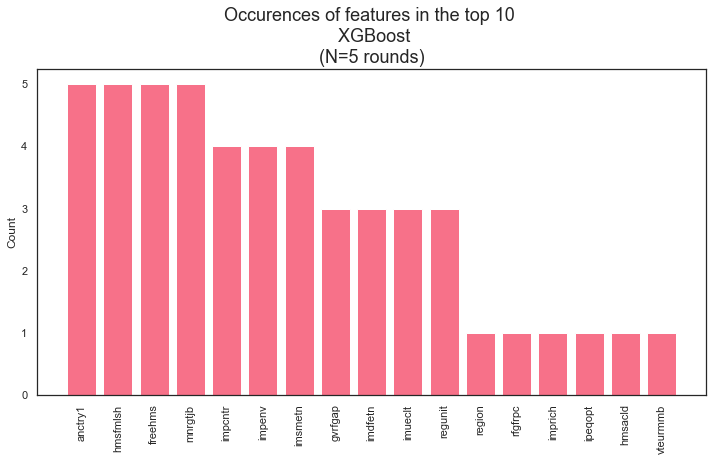

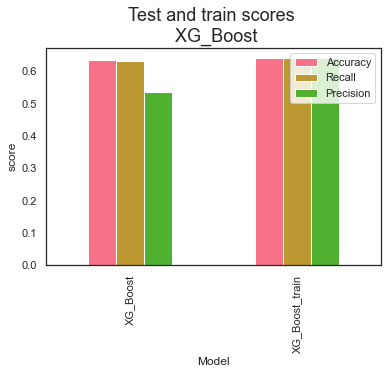

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.634119  0.629327   0.534521  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.639320  0.639320   0.639401  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.64      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.64      0.77      8077
Def + Prob not       0.10      0.57      0.17       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

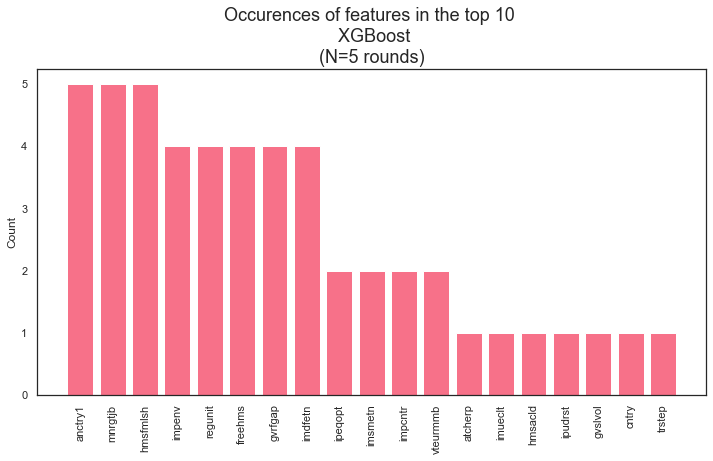

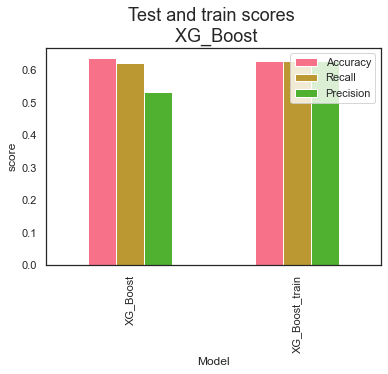

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.637122  0.622577   0.532855  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.628062  0.628062   0.628324  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8077
Def + Prob not       0.10      0.60      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.61      0.46      8

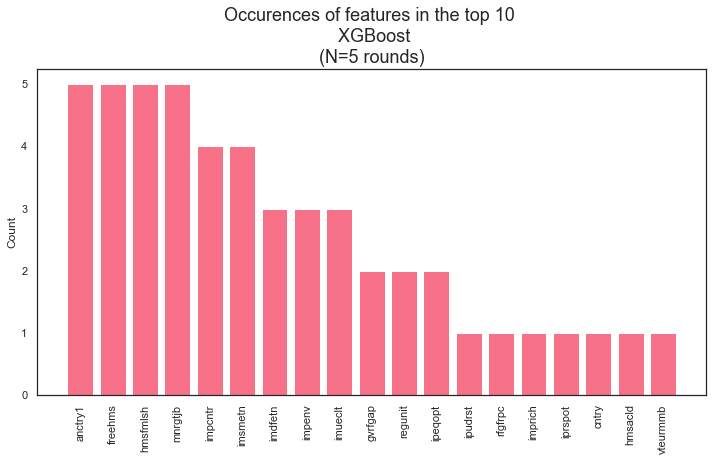

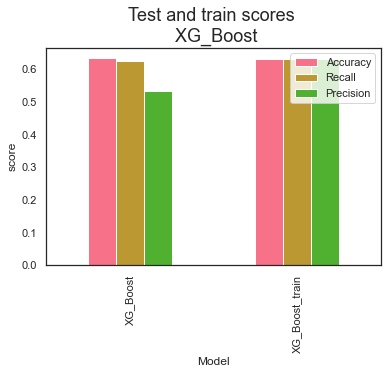

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.633218  0.625209   0.533448  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.631707  0.631707   0.631846  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.66      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.91      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.61      0.75      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.60      0.46      8

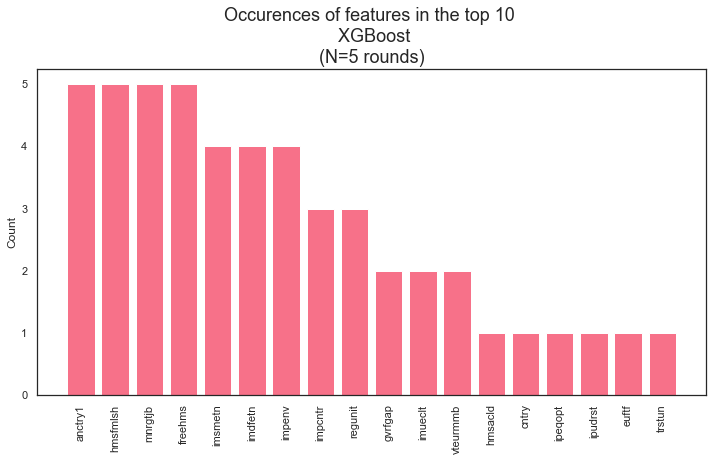

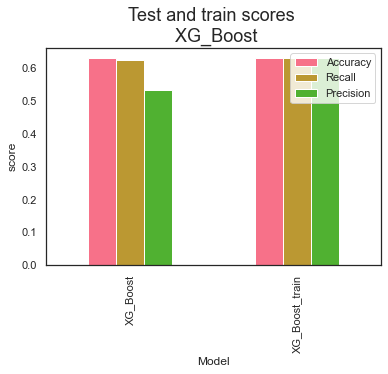

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.628621  0.623606   0.532835  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.627765  0.627765   0.627938  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

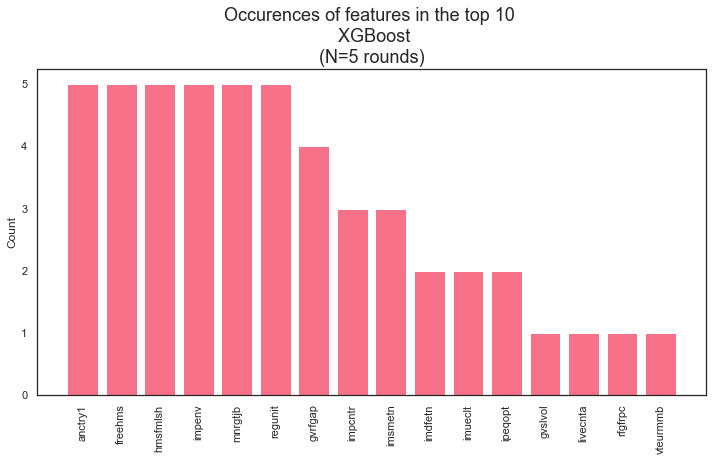

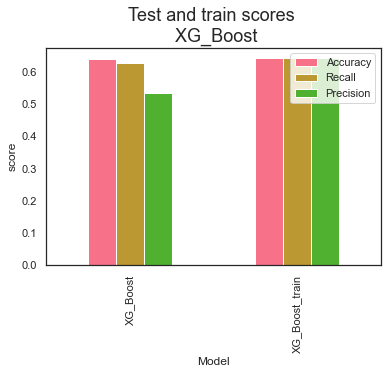

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.640772  0.628089   0.534467  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.641852  0.641852   0.642001  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.62      8658
     macro avg       0.54      0.63      0.47      8658
  weighted avg       0.90      0.62      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.62      8658
     macro avg       0.53      0.61      0.47      8

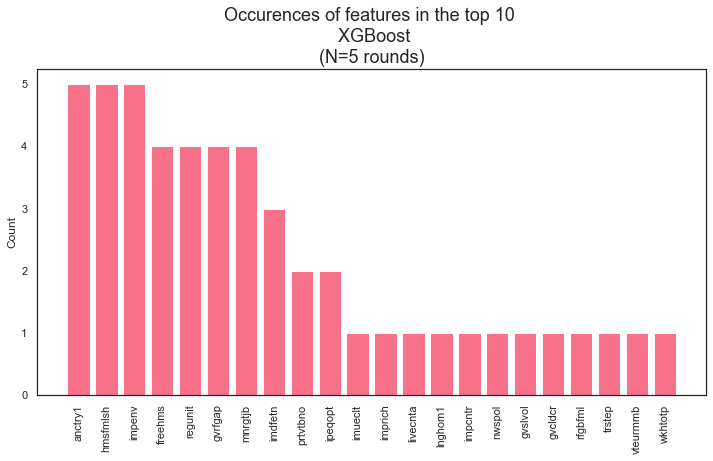

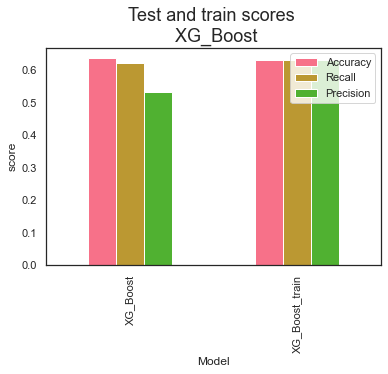

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.636729  0.621991   0.532720  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.630831  0.630831   0.631018  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8077
Def + Prob not       0.10      0.60      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.61      0.46      8

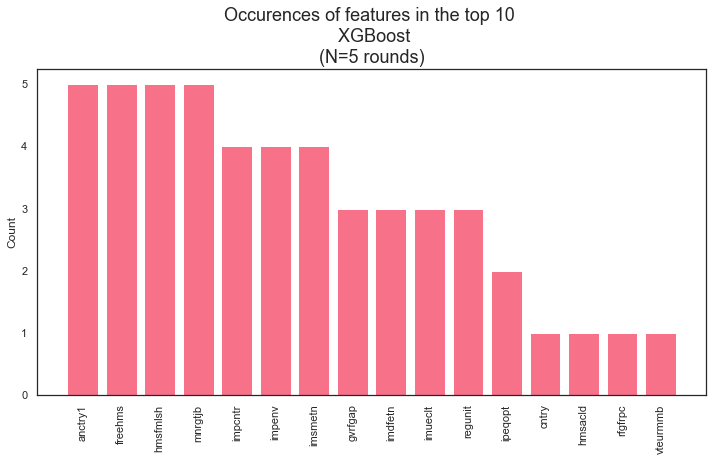

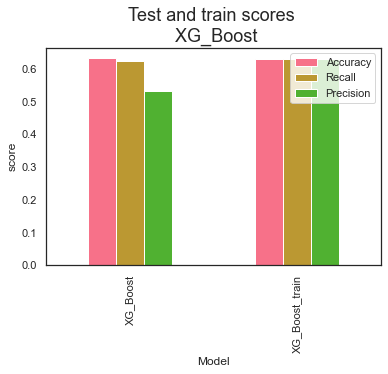

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.632571  0.625215   0.533431  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.630735  0.630735   0.630893  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.66      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.62      0.75      8077
Def + Prob not       0.10      0.59      0.17       581

      accuracy                           0.61      8658
     macro avg       0.53      0.60      0.46      8

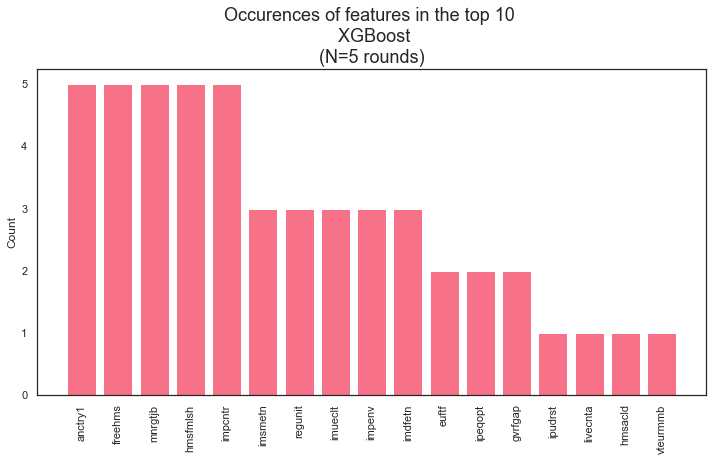

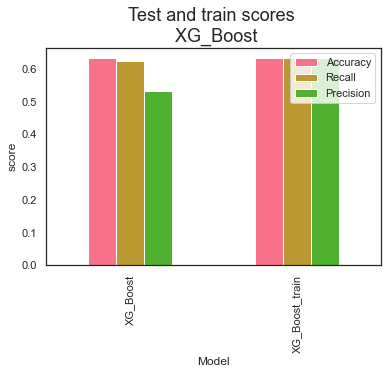

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.631809  0.625056   0.533327  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.632356  0.632356   0.632444  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.91      0.64      0.73      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.18       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

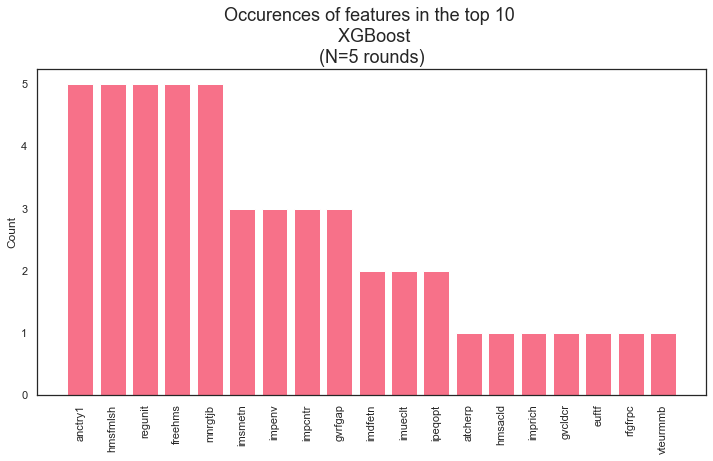

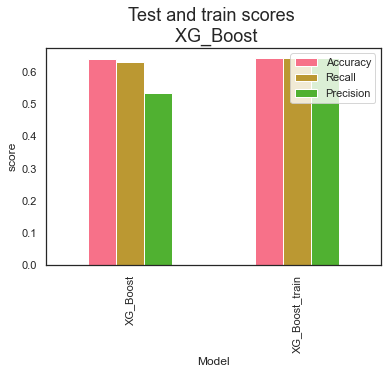

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.640702  0.630273   0.535026  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.641638  0.641638   0.641789  [5, 12, 19, 26, 33]
4716 4716
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 5 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.62      0.76      8076
Def + Prob not       0.11      0.65      0.19       582

      accuracy                           0.63      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.63      0.72      8658
 

4718 4718
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 12 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8077
Def + Prob not       0.10      0.59      0.18       581

      accuracy                           0.63      8658
     macro avg       0.53      0.61      0.47      8

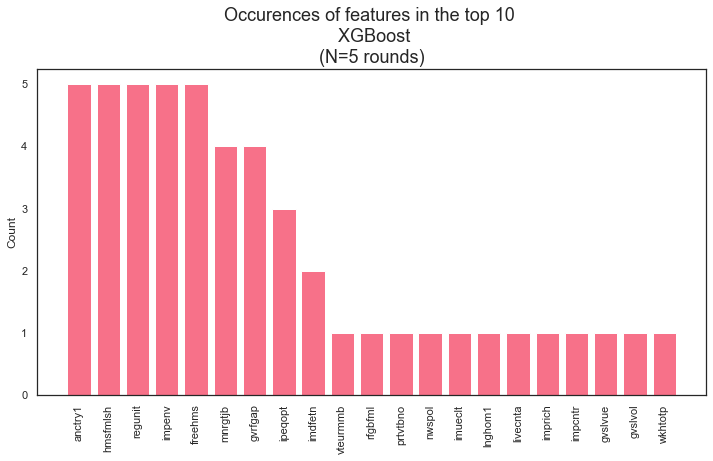

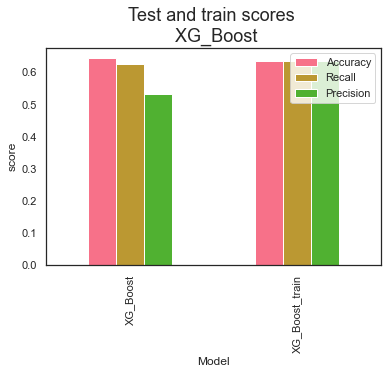

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.643867  0.624893   0.533778  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.634433  0.634433   0.634833  [5, 12, 19, 26, 33]


In [538]:
#try them all
keep_score_duo =[]
keep_feat_duo = []

for i in range(len(top_hyperparams_duo)):
    a  = pd.Series.to_dict(top_hyperparams_duo.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score_duo, feat_duo = XG_Boost_duo(X_noclimate, y_duo, random_states, True, top_lr_duo, a)  
    print(score_duo)
    keep_score_duo.append(score_duo)
    keep_feat_duo.append(feat_duo)

In [539]:
keep_score_duo

[            Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.634119  0.629327   0.534521  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.639320  0.639320   0.639401  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.637122  0.622577   0.532855  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.628062  0.628062   0.628324  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.633218  0.625209   0.533448  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.631707  0.631707   0.631846  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.628621  0.623606   0.532835  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.627765  0.627765   0.627938  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.640772  0.628089   0.534467  [5, 12, 19, 26, 33]
 1

In [540]:
acc_test = []
acc_train = []

for i in range(len(keep_score_duo)):
    a = keep_score_duo[i]
    acc_test.append(a["Accuracy"][0])
    acc_train.append(a["Accuracy"][1])

In [541]:
outcomes = pd.DataFrame(zip(acc_test,acc_train), columns=["test", "train"])
outcomes["difference "] = abs(outcomes["test"] - outcomes["train"])

In [547]:
outcomes.sort_values(by="test", ascending=False)

,test,train,difference
9,0.643867,0.634433,0.009434
4,0.640772,0.641852,0.001081
8,0.640702,0.641638,0.000935
1,0.637122,0.628062,0.009059
5,0.636729,0.630831,0.005898
0,0.634119,0.639320,0.005201
2,0.633218,0.631707,0.001511
6,0.632571,0.630735,0.001836
7,0.631809,0.632356,0.000547
3,0.628621,0.627765,0.000855


In [550]:
#best score is index 9
top_param_fifteen = top_hyperparams_duo.iloc[9,:] #select hyperparam-combination
top_param_fifteen = top_param_fifteen.to_dict() #put into dict
top_param_fifteen["max_depth"] = int(top_param_fifteen["max_depth"]) #change float to int
top_param_fifteen

{'colsample_bytree': 0.934253411065058,
 'min_child_weight': 7.0,
 'reg_alpha': 121.0,
 'gamma': 2.9346854766594745,
 'max_depth': 7,
 'reg_lambda': 0.23275675277493624}

4678 4678
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 0 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.74      8057
Def + Prob not       0.11      0.63      0.18       601

      accuracy                           0.61      8658
     macro avg       0.53      0.62      0.46      8658
  weighted avg       0.90      0.61      0.70      8658
 

4702 4702
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 1 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.59      0.73      8069
Def + Prob not       0.11      0.66      0.18       589

      accuracy                           0.60      8658
     macro avg       0.53      0.63      0.46      8658
  weighted avg       0.90      0.60      0.70      8658
 

4750 4750
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 2 
                 precision    recall  f1-score   support

    De

Random state: 17 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8087
Def + Prob not       0.11      0.63      0.19       571

      accuracy                           0.64      8658
     macro avg       0.54      0.64      0.48      8658
  weighted avg       0.90      0.64      0.73      8658
 

4698 4698
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 18 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.63      0.76      8067
Def + Prob not       0.12      0.67      0.20       591

      accuracy                           0.63      8658
     macro avg       0.54      0.65      0.48      8658
  weighted avg       0.90      0.63      0.72      8658
 

4722 4722
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 19 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.64      0.77      8079
Def + Prob not

Random state: 35 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.61      0.75      8072
Def + Prob not       0.11      0.66      0.19       586

      accuracy                           0.61      8658
     macro avg       0.54      0.64      0.47      8658
  weighted avg       0.90      0.61      0.71      8658
 

4646 4646
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 36 
                 precision    recall  f1-score   support

    Def + Prob       0.96      0.65      0.78      8041
Def + Prob not       0.12      0.62      0.20       617

      accuracy                           0.65      8658
     macro avg       0.54      0.64      0.49      8658
  weighted avg       0.90      0.65      0.74      8658
 

4624 4624
percentage def/prob: 50.0 
percentage prob/def not: 50.0
Random state: 37 
                 precision    recall  f1-score   support

    Def + Prob       0.95      0.62      0.75      8030
Def + Prob not

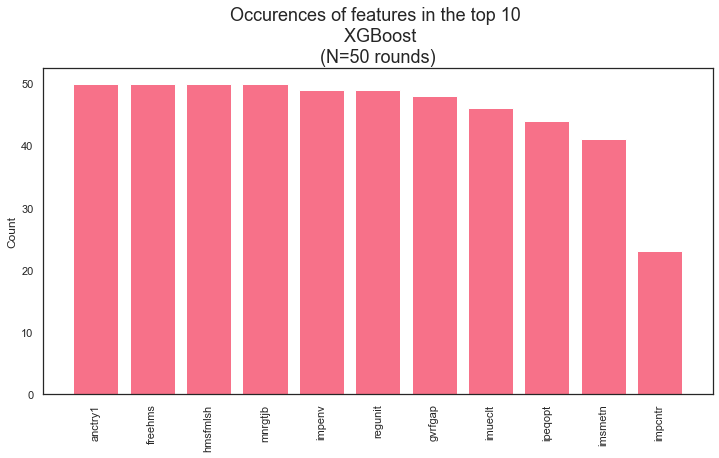

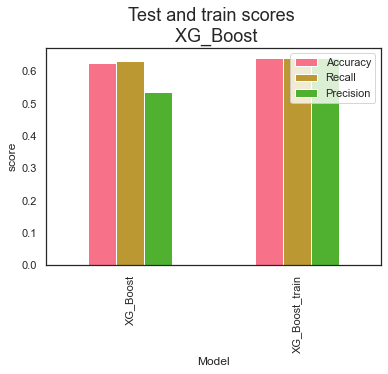

In [552]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

score_fifteen, feat_fifteen = XG_Boost_duo(X_fifteen, y_duo, random_states_many, True, top_lr_fifteen, top_param_fifteen)

In [553]:
score_fifteen

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.623705,0.632449,0.535238,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.639544,0.639544,0.639761,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


# END

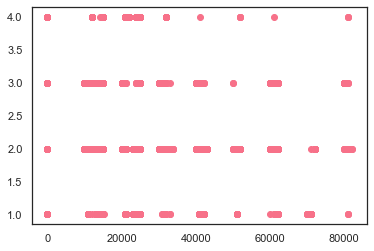

In [453]:
plt.scatter(data=X_noclimate, x="anctry1", y="regunit")

In [426]:
imp2.sort_values(by="count", ascending=False)

,indices,importance,count,shorthand,full_text,feature
0,316,0.156241,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
3,87,0.113683,49,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
12,88,0.099149,47,freehms,Gays and lesbians free to live life as they wish,freehms
13,89,0.096299,47,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
2,340,0.117990,46,regunit,Regional unit,regunit
8,336,0.102920,34,impenv,Important to care for nature and environment,impenv
4,142,0.108913,26,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
7,320,0.105451,26,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
1,92,0.123542,19,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn
15,96,0.095065,19,imueclt,Country's cultural life undermined or enriched by immigrants,imueclt


If you occur <10 times, but your importance is still about the mean, I select you as being important.
If your importance = in top 15%, I select you as being important

In [375]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = i) #split data
        
undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **top_param_duo2, learning_rate = top_lr_duo2, use_label_encoder = False)
result = model.fit(X_train_under, y_train_under)


In [388]:
from xgboost import plot_tree
import graphviz
# import treeplot

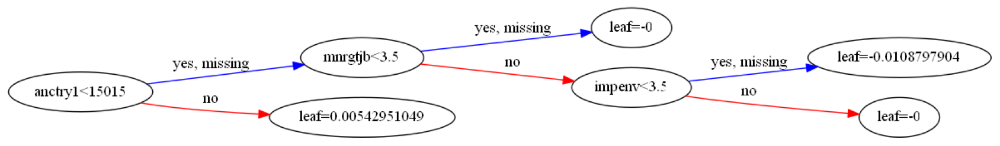

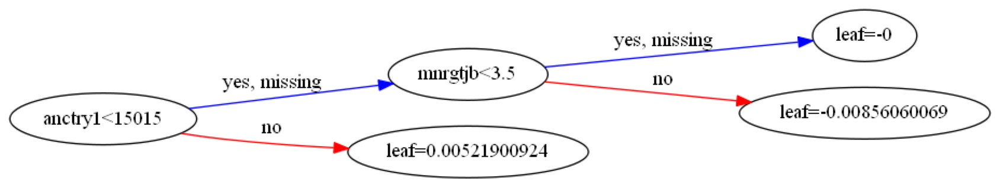

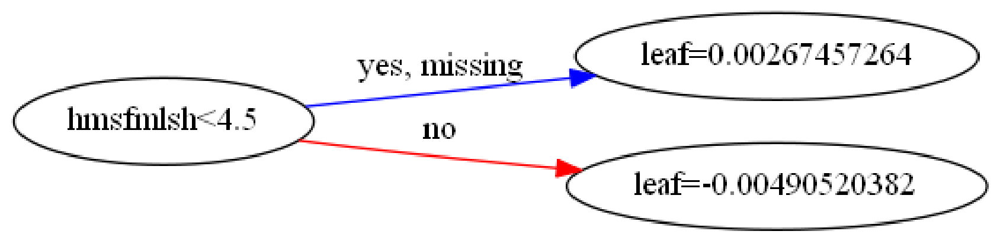

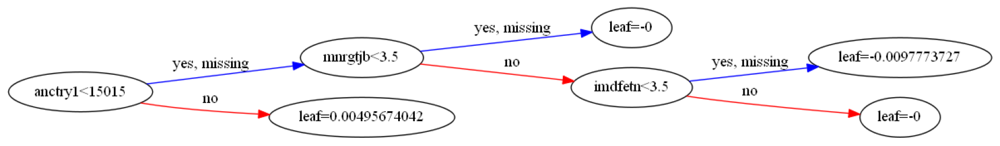

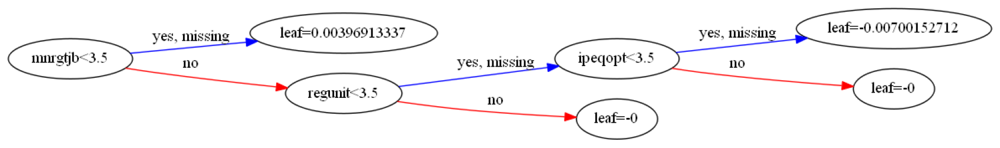

...

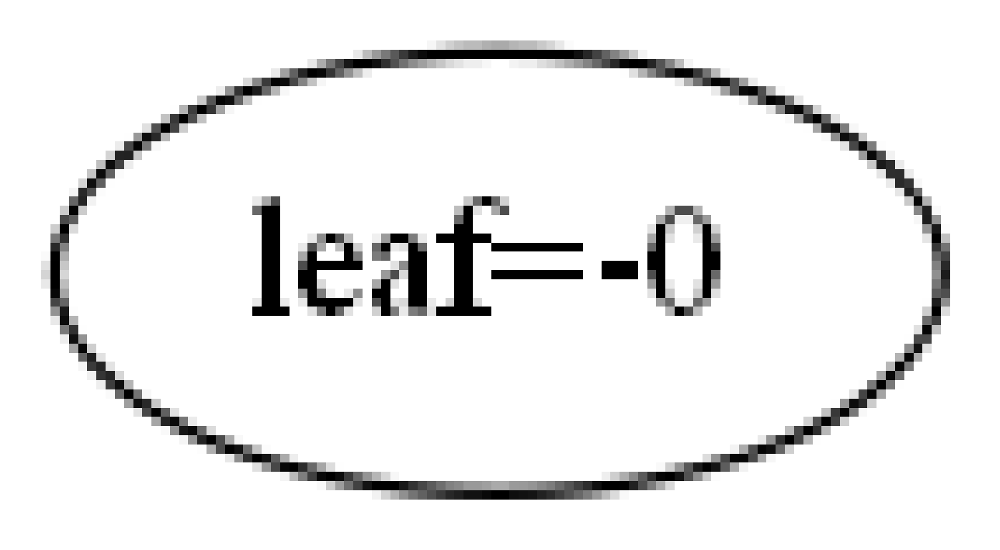

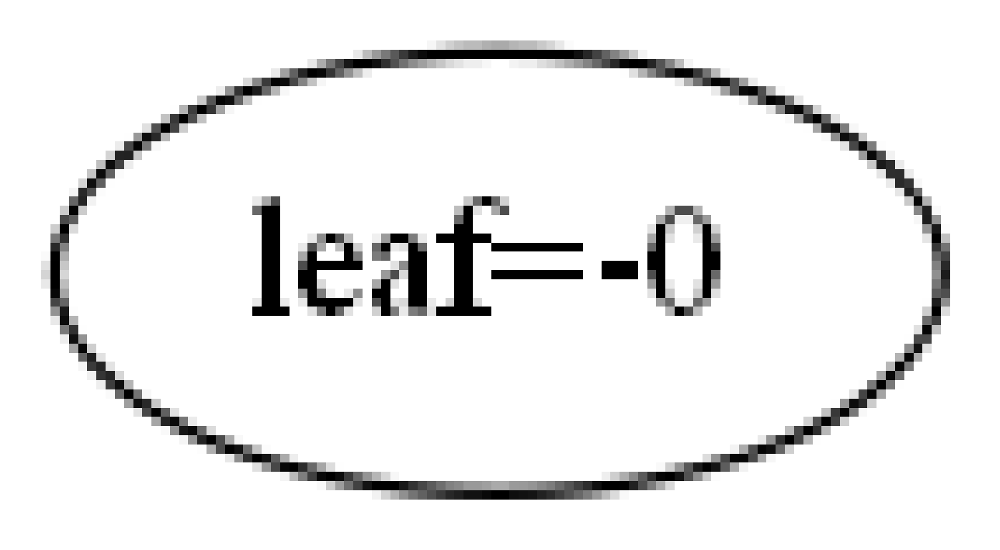

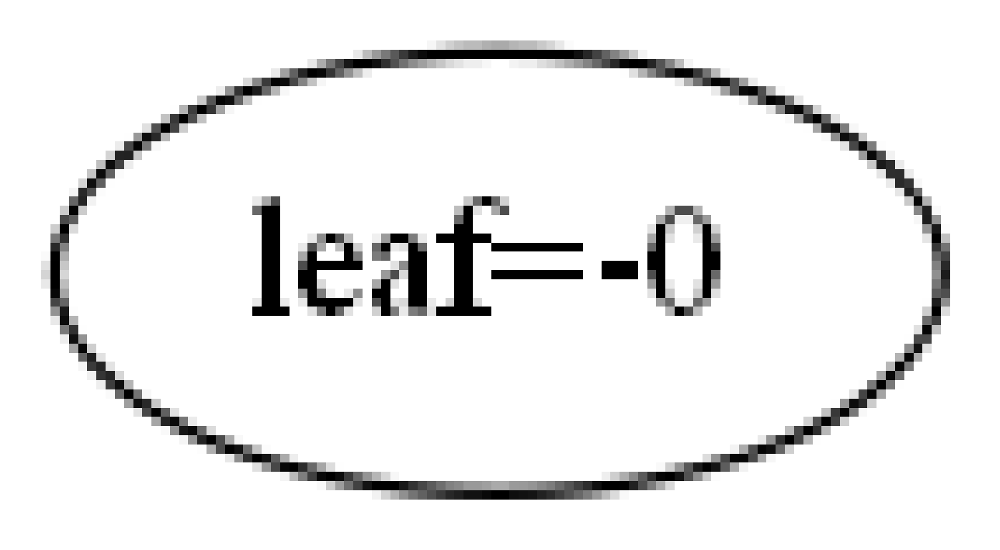

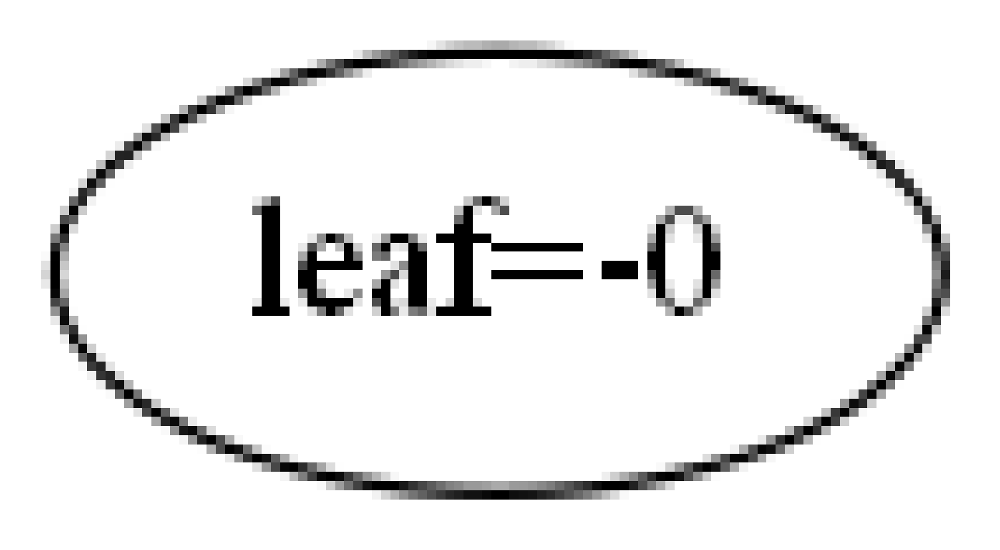

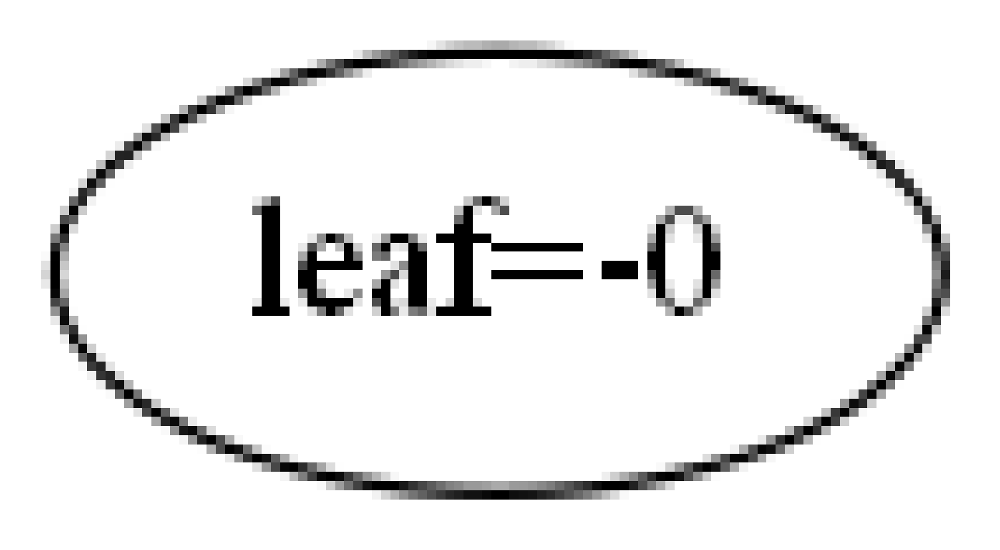

In [423]:
# fig = plt.figure(figsize=(25,20))
for i in range(0,100):
    plot_tree(model, num_trees=i, rankdir='LR')
    
    fig = plt.gcf()
    fig.set_size_inches(30, 15)


In [204]:
# fig = plt.figure(figsize=(25,20))
# _ = tree.plot_tree(clf, 
#                    feature_names=iris.feature_names,  
#                    class_names=iris.target_names,
#                    filled=True)

# https://mljar.com/blog/visualize-decision-tree/